# PIML Slope-Stability Manuscript — Reproduction Notebook

This notebook reproduces **every figure and table** used in the manuscript, end to end, from a
**single uploaded input CSV plus three pretrained model checkpoints** (see below). Run all cells
top to bottom (`Runtime > Run all` in Colab).

**What this notebook builds:**

| Part | Produces | Source script |
|---|---|---|
| A — PINN Digital Twin | Fig 8a/8b/8c, Fig 9, Fig 10, Fig 11, Fig 12, Fig 18a/18b + 5 CSV exports (incl. `fos_timeseries_main.csv`, `test_predictions_108_by_pinn.csv`) | `pinn_digital_twin.ipynb` |
| B — Event-based infiltration | Fig 16 | rebuilt from Part A's own predictions (see note below) |
| C — Sensitivity analysis | Fig 17a–17e + `sensitivity_values.csv` (Table 8) | `figure_17.py` |
| D — Bishop pore-pressure / Table 10 | Fig 19a, Fig 19b, Table 10 | `figure_19_table10_bishop.py` |
| E — Constitutive agreement | Fig 20 | `figure_20_constitutive_agreement.py` |
| F — Chronological rainfall events | Fig 21 | `figure21_corrected.py` |
| G — Operational dashboard | Fig 22, Fig 23, alert-stream summary | `make_fig22_fig23.py` |
| H — FoS timeline, California data | Fig 13 | `fos_run.py` |

Parts B–G all read the CSVs written by **Part A**, so Part A must run first (it does, in cell order).

**Note on Part A (checkpoint reproduction, no training):** Part A no longer trains the PINN, ML
baseline, or LSTM from scratch. Instead it loads three pretrained checkpoints
(`piml_slope_model_108_pinn_richards_final.pt`, `piml_slope_model_108_ml_baseline_final.pt`,
`piml_slope_model_108_lstm_final.pt`) and runs the exact same data pipeline, evaluation,
sensitivity sweeps, and inference-latency benchmarks on top of the loaded weights. Each checkpoint
load is sanity-checked against the current data split (`T_MIN`/`T_MAX`/`scaler_y`) so the figures
and CSVs stay aligned with the rest of the pipeline. Everything downstream of Part A (Parts B–G)
is unchanged and continues to read Part A's outputs (`fos_timeseries_main.csv`,
`test_predictions_108_by_pinn.csv`, in-kernel variables like `theta_te`/`theta_pred_te`, etc.), so
the whole notebook stays internally consistent.

**Note on Part B (Fig 16):** the original `figure_16.ipynb` loaded a *separate* pretrained checkpoint
with a different network architecture than the one Part A uses (flat 18-feature input, no output
activation, vs. Part A's z/t-separated input with a Sigmoid output — the first layer alone is
`(128, 20)` vs `(128, 18)`, so the weights are not interchangeable, renaming the file will not make
`load_state_dict` succeed). Instead of requiring that second file, Part B below is rebuilt to reuse
Part A's own PINN predictions (`theta_piml`, `FoS_piml` from `fos_timeseries_main.csv`), split into
Dry/Moderate/Extreme rainfall bands. This also makes Fig 16 physically consistent with the rest of
the manuscript — it now uses the same Bishop c'=5 kPa formula as Fig 17/19/table 10, instead of the
old script's leftover c'=10 kPa simplified formula. Net effect: **only the raw CSV plus the three
checkpoints are needed — no training happens anywhere in this notebook.**


## Files you need to upload

Upload these into the **same folder this notebook is run from** (in Colab: click the folder icon on
the left -> upload, which puts files in `/content/`). Exact filenames matter.

| # | File | What it is | Used by |
|---|---|---|---|
| 1 | `pinn_108_new.csv` | Raw Device-108 telemetry (timestamp, devID, rain, soil, temp, humi, ...) | Part A (data pipeline); everything else derives from Part A's outputs |
| 2 | `piml_slope_model_108_pinn_richards_final.pt` | Pretrained PINN checkpoint (Richards-equation constrained) | Part A — loaded instead of training |
| 3 | `piml_slope_model_108_ml_baseline_final.pt` | Pretrained data-only MLP baseline checkpoint | Part A — loaded instead of training |
| 4 | `piml_slope_model_108_lstm_final.pt` | Pretrained LSTM baseline checkpoint | Part A (continued) — loaded instead of training |
| 5 | `Obs_Node_6.out`, `Obs_Node_7.out`, `Obs_Node_8.out` | HYDRUS-1D observation-node outputs (optional) | Part A — Fig 12c only; skipped automatically if absent |
| 5b | `Obs_Node_31.out` | HYDRUS-1D observation-node output, ~30 cm depth (optional) | Part A — Fig 11 only (paired with `Obs_Node_7.out`, ~6 cm); skipped automatically if absent |
| 6 | `california_hourly_rain.csv` | California hourly rainfall/soil-moisture record | Part H — Fig 13 |
| 7 | `pinn_model_108_for_california.pt` | Pretrained PINN checkpoint calibrated on California data | Part H — Fig 13 |
| 8 | `107_pinn.csv` | Raw Device-107 telemetry | Part I — cross-device transfer learning |
| 9 | `piml_slope_model_101_pinn_richards.pt` | Pretrained source-domain (Device 101) PINN checkpoint | Part I — zero-shot/recal/fine-tune source model |
| 10 | `dev101se_to_107_finetuned_chronosplit.pt`, `dev101se_to_108_finetuned_chronosplit.pt` | Cached fine-tuned checkpoints (optional, upload directly into the same folder) | Part I — skips the fine-tuning loop if present; trained fresh and cached otherwise |

Everything else (all CSVs, all figures) is generated automatically as the notebook runs. You do not
need to upload `fos_timeseries_main.csv`, `test_predictions_108_by_pinn.csv`, or any
`manuscript_figure_*` file — those are outputs, not inputs. **No model is trained anywhere in this
notebook** — Part A loads the three checkpoints above and reruns the (deterministic) data
pipeline, evaluation, sensitivity sweeps, and latency benchmarks on top of them.


In [1]:
# -*- coding: utf-8 -*-
"""
PINN Digital Twin — Device 108
========================================================================
Physics-Informed Neural Network (PINN) for Slope Stability / Landslide EWS

  PINN: dtheta/dt = d/dz [ K(psi) . (dpsi/dz + 1) ]  <- physics constrained
  ML  : Data loss only (LAM=0, LAM_ZVAR=0)             <- pure data driven

This is a trimmed "digital twin" build derived from the full ablation +
4-model benchmark study. Scope of this script:
  - HYDRUS-1D proxy model REMOVED entirely (no comparison baselines to it).
  - 7 figures are generated:
        manuscript_figure_8a.png      (loss convergence — train/val)
        manuscript_figure_8b.png      (loss convergence — physics loss)
        manuscript_figure_8c.png      (loss convergence — data loss)
        manuscript_figure_9.png       (empirical S_e distribution, Device 108, S_e=0.85 threshold)
        manuscript_figure_11.png      (HYDRUS-1D vs Observed theta, depth-dependent
                                       amplitude damping, optional — needs Obs_Node_7.out
                                       + Obs_Node_31.out)
        manuscript_figure_12.png      (PDE residual, PINN only)
        manuscript_figure_12b.png     (PDE residual, PINN, test set only)
        manuscript_figure_12c.png     (PDE residual, HYDRUS-1D, optional — needs Obs_Node files)
        manuscript_figure_10.png       (3-model PINN/LSTM/MLP scatter)
        manuscript_figure_18a.png     (inference latency & throughput)
        manuscript_figure_18b.png     (latency vs batch size, PINN vs ML)
  - CSV data exports added, matching the structure of previously exported
    reference files:
        fos_timeseries_main.csv
        test_predictions_108_by_pinn.csv
        sensitivity_ks_sweep.csv
        sensitivity_slope_sweep.csv
        sensitivity_2d_grid_ks_x_slope.csv

NOTE ON EXACT REPRODUCIBILITY:
  Random seeds (torch.manual_seed(42), np.random.seed(42)) and the training
  code path up to the PINN/ML model definitions are UNCHANGED from the
  original script, so PINN/ML outputs (theta, psi, FoS, sensitivity sweeps,
  test predictions) should match the original bit-for-bit *given the same
  input CSV, same PyTorch/NumPy/sklearn versions, and same hardware/BLAS
  backend*. Removing the HYDRUS block does not disturb this seed chain,
  since HYDRUS was deterministic (no RNG draws) and the LSTM block in
  Part 2 re-seeds explicitly (torch.manual_seed(42)) before training.
  The only piece that is NOT reproduced bit-for-bit is the old λ
  grid-search loop (Part 2 originally ran 200 extra epochs on a throwaway
  model just to "select" λ from a single candidate [0.5] — since there was
  only one candidate, that loop is redundant and has been removed here;
  LAM_SELECTED is simply hardcoded to LAM).
"""
import warnings; warnings.filterwarnings("ignore")
import os, json, datetime
import numpy as np
import pandas as pd
import matplotlib; matplotlib.use("Agg")
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from sklearn.preprocessing import MinMaxScaler  # scaler_y only
from sklearn.metrics import r2_score, mean_squared_error
import torch, torch.nn as nn, torch.optim as optim
from torch.utils.data import TensorDataset, DataLoader

# ── Optional: install Times New Roman / core MS fonts (Colab/Linux only) ──
def install_fonts():
    """Run once, then restart the runtime. Not required — matplotlib will
    fall back to Liberation Serif / DejaVu Serif if Times New Roman is
    unavailable (see STYLE below)."""
    os.system("apt-get update -qq")
    os.system("apt-get install -y ttf-mscorefonts-installer -qq")
    cache_dir = matplotlib.get_cachedir()
    os.system(f"rm -rf {cache_dir}")
    print("Font installed and cache cleared! Please restart the runtime now.")
# install_fonts()  # <- uncomment to run

# additional imports needed by the downstream figure scripts (Parts C-G)
import argparse
import matplotlib.dates as mdates
import matplotlib.lines as mlines
import matplotlib.patches as mpatches
from collections import Counter
from pathlib import Path


In [2]:
# ══════════════════════════════════════════════════════════════════
# CONFIG — set/verify paths, then check that the required uploads are
# present before anything else runs.
# ══════════════════════════════════════════════════════════════════
from IPython.display import display  # show figures inline, alongside the saved files

WORKDIR = Path("/content") if Path("/content").exists() else Path.cwd()  # put CSV + .pt files in this folder

DATA_PATH_RAW = WORKDIR / "pinn_108_new.csv"

# Pretrained checkpoints — Part A loads these instead of retraining, so all
# three must be present alongside the raw CSV.
PINN_CHECKPOINT_PATH = WORKDIR / "piml_slope_model_108_pinn_richards_final.pt"
ML_CHECKPOINT_PATH   = WORKDIR / "piml_slope_model_108_ml_baseline_final.pt"
LSTM_CHECKPOINT_PATH = WORKDIR / "piml_slope_model_108_lstm_final.pt"
REQUIRED_CHECKPOINTS = [PINN_CHECKPOINT_PATH, ML_CHECKPOINT_PATH, LSTM_CHECKPOINT_PATH]

OUT = WORKDIR / "outputs"
import shutil
if OUT.exists():
    shutil.rmtree(OUT)   # clear stale files (e.g. leftover table7.csv) from previous runs
OUT.mkdir(exist_ok=True)

print(f"Working directory : {WORKDIR}")
print(f"Output directory  : {OUT}\n")
print(f"{'file':45s} {'status'}")
print("-" * 60)
ok = DATA_PATH_RAW.exists()
print(f"{str(DATA_PATH_RAW):45s} {'FOUND' if ok else 'MISSING'}")

ckpt_ok = True
for _p in REQUIRED_CHECKPOINTS:
    _found = _p.exists()
    ckpt_ok = ckpt_ok and _found
    print(f"{str(_p):45s} {'FOUND' if _found else 'MISSING'}")

if not ok:
    print(f"\n*** Missing {DATA_PATH_RAW.name} — upload it before running Part A ***")
    print("Everything in this notebook depends on Part A, which needs this file.")
if not ckpt_ok:
    print("\n*** One or more pretrained checkpoints (.pt) are missing ***")
    print("Part A loads pretrained checkpoints instead of retraining — upload all")
    print("three .pt files above alongside the raw CSV before running.")
if ok and ckpt_ok:
    print("\nRequired uploads found. Safe to Run All.")



Working directory : /content
Output directory  : /content/outputs

file                                          status
------------------------------------------------------------
/content/pinn_108_new.csv                     FOUND
/content/piml_slope_model_108_pinn_richards_final.pt FOUND
/content/piml_slope_model_108_ml_baseline_final.pt FOUND
/content/piml_slope_model_108_lstm_final.pt   FOUND

Required uploads found. Safe to Run All.


## Part A — PINN Digital Twin (checkpoint reproduction, evaluation, sensitivity, efficiency)

Loads the raw Device-108 CSV, then loads the pretrained PINN and data-only MLP baseline
checkpoints instead of training them. Each checkpoint is sanity-checked against the current data
split, evaluates both models, runs the Ks/slope sensitivity sweeps, benchmarks inference latency,
and writes:

- `manuscript_figure_8a.png`, `_7b.png`, `_7c.png` — loss convergence (curves stored in the checkpoint)
- `manuscript_figure_12.png` — PDE residual (PINN only)
- `manuscript_figure_18a.png`, `_18b.png` — inference latency / throughput
- `fos_timeseries_main.csv`, `test_predictions_108_by_pinn.csv`, `sensitivity_ks_sweep.csv`, `sensitivity_slope_sweep.csv`, `sensitivity_2d_grid_ks_x_slope.csv`

No training happens in this cell — `piml_slope_model_108_pinn_richards_final.pt` and
`piml_slope_model_108_ml_baseline_final.pt` must be present in the working directory (see the
upload table above). All outputs land in `OUT`.


Device: cpu

[Step 1-2] Loading data for Device 108 ...
  Rows after subsample: 30,977

[Step 3] Building PINN (true autograd Richards) ...
  Parameters: 43,777

[Step 4-6] Training PINN with true Richards autograd loss ...
  ∂θ/∂t scale for normalization: 8.7802e-08 m³/m³/s

[Step 4-6] Loading pretrained PINN checkpoint instead of retraining ...
  Checkpoint: /content/piml_slope_model_108_pinn_richards_final.pt
  ✓ Checkpoint matches current data pipeline (T_MIN/T_MAX/scaler_y identical)
  Best val: 0.00002  @ epoch 412  (from checkpoint, 600 epochs)

█████████████████████████████████████████████████████████████████
  ABLATION: Training ML Baseline (Vanilla MLP, Data-Only)
  LAM=0  LAM_ZVAR=0  — No physics constraint
█████████████████████████████████████████████████████████████████
  ML Baseline Parameters: 43,777

[ML] Loading pretrained ML Baseline checkpoint instead of retraining ...
  Checkpoint: /content/piml_slope_model_108_ml_baseline_final.pt
  ✓ Checkpoint matches current dat

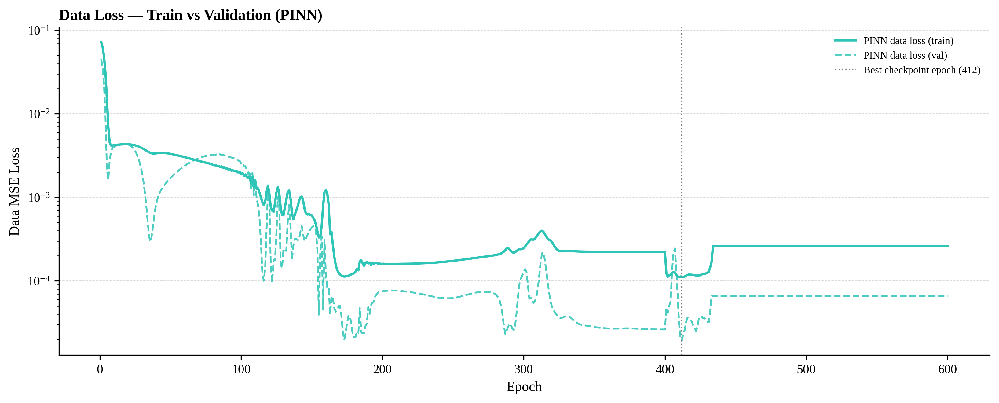

  → Saved: /content/outputs/manuscript_figure_8a.png


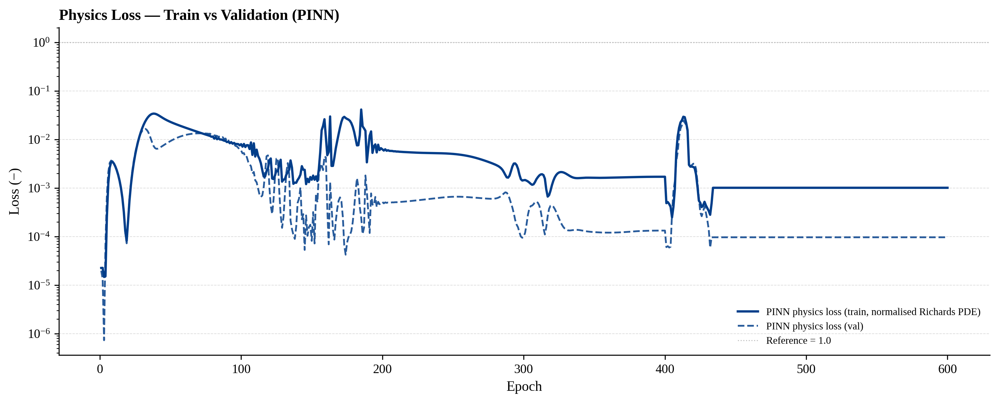

  → Saved: /content/outputs/manuscript_figure_8b.png


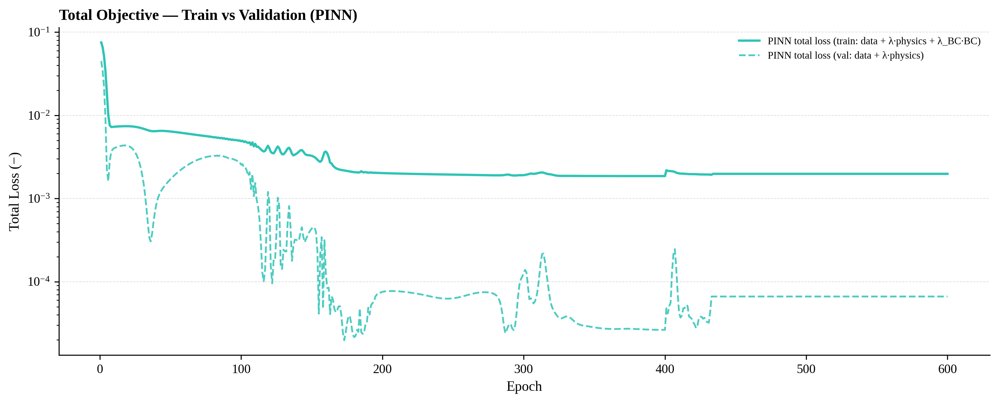

  → Saved: /content/outputs/manuscript_figure_8c.png


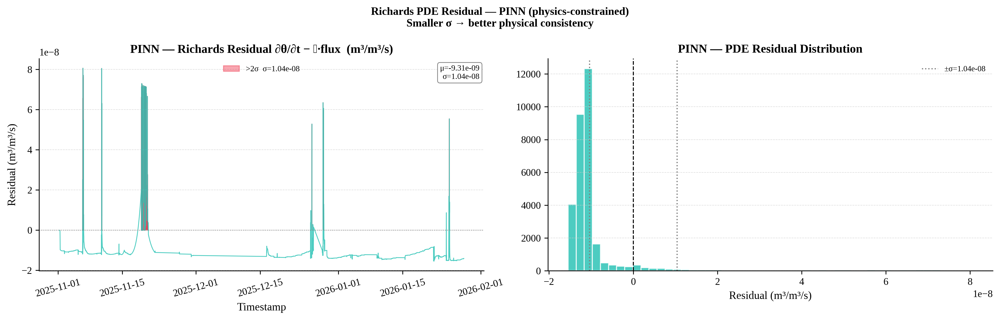

  → Saved: /content/outputs/manuscript_figure_12.png
  [PINN][TEST] Richards residual  μ = -1.2459e-08  σ = 4.6955e-09  m³/m³/s


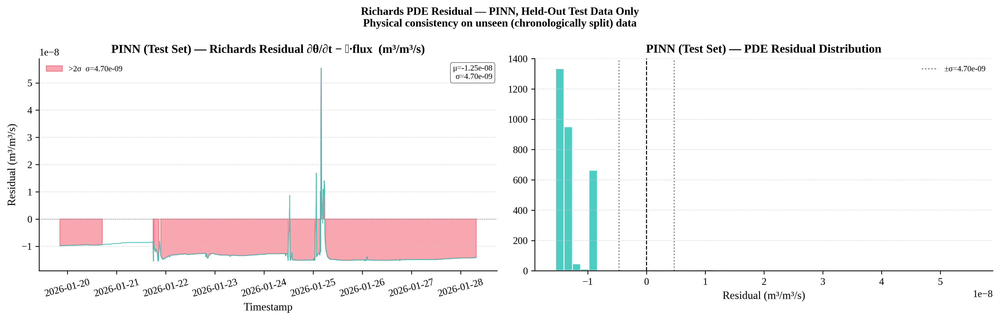

  → Saved: /content/outputs/manuscript_figure_12b.png

[Step 11c] Computing HYDRUS-1D Richards residual ...
  [HYDRUS] Richards residual  μ = 6.5795e-09  σ = 2.5338e-06  m³/m³/s


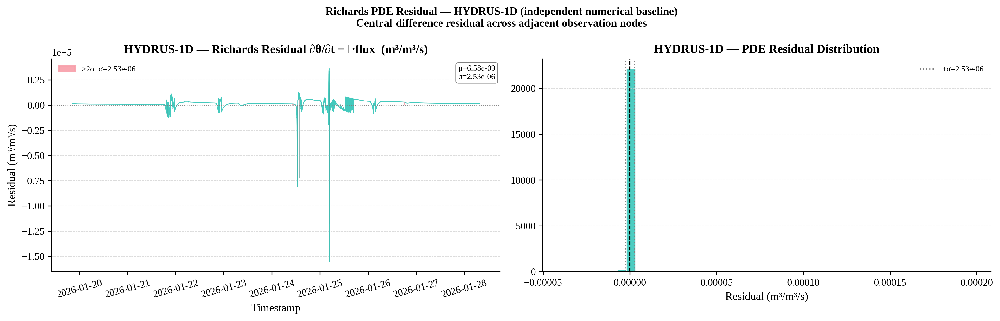

  → Saved: /content/outputs/manuscript_figure_12c.png

█████████████████████████████████████████████████████████████████
  SENSITIVITY ANALYSIS
  Perturbing Ks and slope angle β independently
█████████████████████████████████████████████████████████████████

[SA-A] Ks sensitivity ...
  Ks×0.60  FoS_mean=1.760  FoS_min=1.597  fail=0
  Ks×0.70  FoS_mean=1.732  FoS_min=1.592  fail=0
  Ks×0.80  FoS_mean=1.710  FoS_min=1.588  fail=0
  Ks×0.90  FoS_mean=1.694  FoS_min=1.585  fail=0
  Ks×1.00  FoS_mean=1.681  FoS_min=1.583  fail=0
  Ks×1.10  FoS_mean=1.670  FoS_min=1.581  fail=0
  Ks×1.20  FoS_mean=1.661  FoS_min=1.580  fail=0
  Ks×1.30  FoS_mean=1.654  FoS_min=1.578  fail=0
  Ks×1.40  FoS_mean=1.647  FoS_min=1.577  fail=0

[SA-B] Slope angle sensitivity ...
  β=23°  FoS_mean=2.348  FoS_min=2.223  fail=0
  β=25°  FoS_mean=2.168  FoS_min=2.052  fail=0
  β=27°  FoS_mean=2.017  FoS_min=1.906  fail=0
  β=29°  FoS_mean=1.888  FoS_min=1.782  fail=0
  β=31°  FoS_mean=1.777  FoS_min=1.676  fail=0
  β

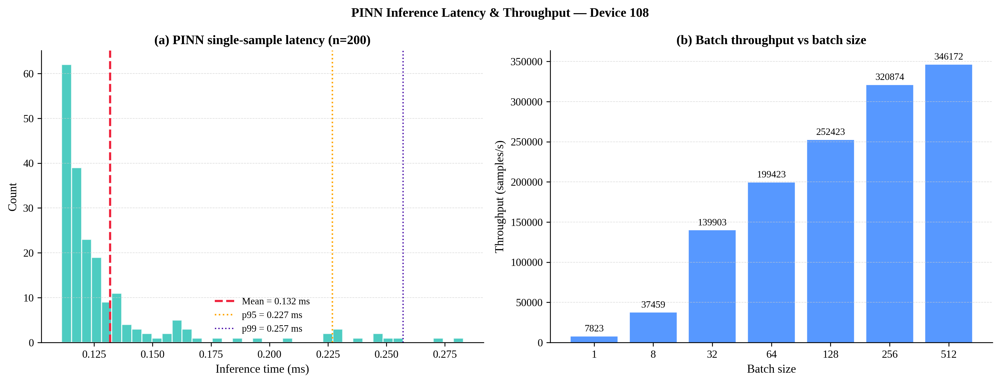

  → Saved: /content/outputs/manuscript_figure_18a.png


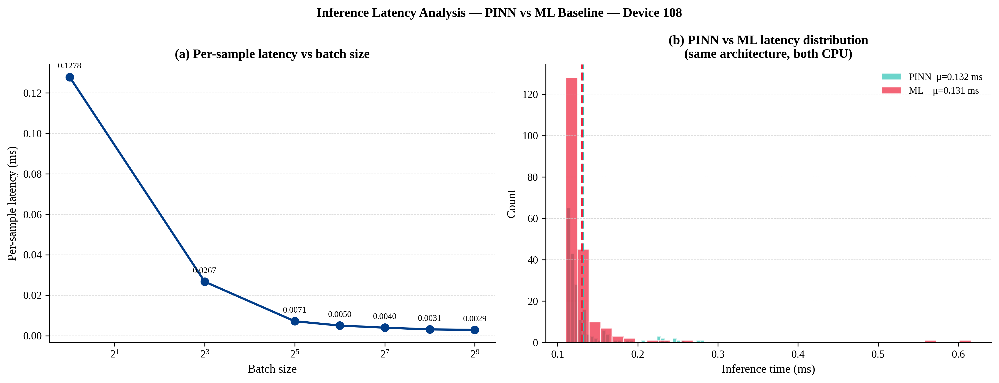

  → Saved: /content/outputs/manuscript_figure_18b.png

[Data Export] Writing CSV outputs ...
  → Saved: /content/outputs/fos_timeseries_main.csv  (30932 rows)
  → Saved: /content/outputs/test_predictions_108_by_pinn.csv  (3083 rows)
  → Saved: /content/outputs/sensitivity_ks_sweep.csv  (9 rows)
  → Saved: /content/outputs/sensitivity_slope_sweep.csv  (10 rows)
  → Saved: /content/outputs/sensitivity_2d_grid_ks_x_slope.csv  (90 rows)

✅ Data exports complete.


In [3]:
# ── Reproducibility ─────────────────────────────────────────
torch.manual_seed(42); np.random.seed(42)
DEVICE = torch.device("cpu")
print(f"Device: {DEVICE}")

os.makedirs(OUT, exist_ok=True)

STYLE = {
    "font.family": "serif", "font.size": 10,
    "font.serif": ["Times New Roman", "Liberation Serif", "DejaVu Serif"],
    "axes.labelsize": 11, "axes.titlesize": 12, "axes.titleweight": "bold",
    "axes.spines.top": False, "axes.spines.right": False, "axes.linewidth": 0.8,
    "xtick.major.size": 3.5, "ytick.major.size": 3.5,
    "legend.frameon": False, "legend.fontsize": 9,
    "figure.dpi": 300, "savefig.dpi": 300,
    "savefig.bbox": "tight", "savefig.facecolor": "white",
}
plt.rcParams.update(STYLE)

C = {
    "rain": "#4895EF", "obs": "#E63946", "pred": "#2EC4B6",
    "train": "#3A86FF", "val": "#FF006E", "test": "#FB5607",
    "psi": "#7209B7", "u": "#F77F00", "fos": "#06D6A0",
    "warn": "#EF233C", "grid": "#CCCCCC", "resid": "#480CA8",
    "phys": "#023E8A", "vg1": "#0077B6", "vg2": "#00B4D8",
    "coral": "#FF7F50",
}

def savefig(fig, name):
    path = os.path.join(OUT, name)
    fig.savefig(path, dpi=300, bbox_inches="tight", facecolor="white")
    display(fig)
    plt.close(fig)
    print(f"  → Saved: {path}")
    return path

def add_panel_label(ax, label, x=-0.08, y=1.06):
    ax.text(x, y, label, transform=ax.transAxes,
            fontsize=13, fontweight="bold", va="top", ha="right")

def light_grid(ax, axis="y"):
    ax.grid(axis=axis, color=C["grid"], lw=0.5, ls="--", alpha=0.7)

# ═══════════════════════════════════════════════════════════
# VAN GENUCHTEN PARAMETERS  (Sandy Clay Loam, Device 108)
# ═══════════════════════════════════════════════════════════
VG = dict(
    theta_r=0.05, theta_s=0.55,
    alpha=5.9, n=1.48, m=1 - 1/1.48,
    Ks=0.0043,           # m/h
)
VG["Ks_ms"] = VG["Ks"] / 3600.0  # m/s

# [ALIGN v5] Fixed physical suction bound, matching Part C / Part D
# (permanent-wilting-point bound), used everywhere instead of the old
# adaptive np.percentile(...,2) floor, which — because psi is heavily
# right-skewed (dry tail extends to ~-103 m) — was collapsing ~98% of
# the dry-side range onto a single clipped value and flattening FoS.
PSI_MIN_M = -165.0    # physical permanent-wilting-point bound (m)
PSI_MAX_M = 0.0

# Collocation depths (m, positive downward)
Z_SENSOR    = 0.30
Z_COLLOC    = np.array([ 0.30, 0.50], dtype=np.float32)

# ═══════════════════════════════════════════════════════════
# VAN GENUCHTEN TORCH UTILITIES
# ═══════════════════════════════════════════════════════════

def vg_Se_t(theta, vg):
    tc = theta.clamp(vg["theta_r"] + 1e-6, vg["theta_s"] - 1e-6)
    return (tc - vg["theta_r"]) / (vg["theta_s"] - vg["theta_r"])

def vg_psi_t(theta, vg):
    Se = vg_Se_t(theta, vg).clamp(1e-6, 1 - 1e-6)
    h  = (1.0 / vg["alpha"]) * (Se**(-1.0 / vg["m"]) - 1.0)**(1.0 / vg["n"])
    return -h

def vg_K_t(theta, vg):
    Se = vg_Se_t(theta, vg).clamp(1e-6, 1 - 1e-6)
    Kr = Se**0.5 * (1.0 - (1.0 - Se**(1.0 / vg["m"]))**vg["m"])**2
    return vg["Ks_ms"] * Kr

# NumPy equivalents (evaluation only)
def vg_Se_np(theta, vg):
    tc = np.clip(theta, vg["theta_r"]+1e-6, vg["theta_s"]-1e-6)
    return (tc - vg["theta_r"]) / (vg["theta_s"] - vg["theta_r"])

def vg_psi_np(theta, vg):
    Se = np.clip(vg_Se_np(theta, vg), 1e-6, 1-1e-6)
    return -(1.0/vg["alpha"]) * (Se**(-1.0/vg["m"]) - 1.0)**(1.0/vg["n"])

def vg_Kr_np(theta, vg):
    Se = np.clip(vg_Se_np(theta, vg), 1e-6, 1-1e-6)
    return Se**0.5 * (1-(1-Se**(1/vg["m"]))**vg["m"])**2

def vg_K_np(theta, vg):
    return vg["Ks_ms"] * vg_Kr_np(theta, vg)

# ═══════════════════════════════════════════════════════════
# 1-2.  LOAD & PREPROCESS  (Device 107 only)
# ═══════════════════════════════════════════════════════════
print("\n[Step 1-2] Loading data for Device 108 ...")
DATA_PATH = str(DATA_PATH_RAW)  # <- set in the CONFIG cell above
df_raw = pd.read_csv(DATA_PATH, low_memory=False)
df_raw = df_raw.dropna(subset=["timestamp", "devID", "soil", "rain"])
df_raw["devID"]     = df_raw["devID"].astype(int)
df_raw["timestamp"] = pd.to_datetime(df_raw["timestamp"], dayfirst=False, errors="coerce")
df_raw = df_raw.dropna(subset=["timestamp"]).sort_values("timestamp").reset_index(drop=True)

d108 = df_raw[df_raw["devID"] == 108].copy().reset_index(drop=True)
d108["t_min"] = d108["timestamp"].dt.floor("min")
df = d108[["t_min","soil","rain"]].rename(
    columns={"t_min":"timestamp","soil":"theta","rain":"rain"}).copy()
df = df.sort_values("timestamp").reset_index(drop=True)
df["t_sec"] = (df["timestamp"] - df["timestamp"].iloc[0]).dt.total_seconds()

df = df.dropna(subset=["rain","theta","t_sec"]).reset_index(drop=True)
df = df.iloc[::2].reset_index(drop=True)
print(f"  Rows after subsample: {len(df):,}")

LAG = 15
n   = len(df)
n_tr  = int(0.80 * n)
n_val = int(0.90 * n)

df_tr  = df.iloc[:n_tr].copy().reset_index(drop=True)
df_val = df.iloc[n_tr:n_val].copy().reset_index(drop=True)
df_te  = df.iloc[n_val:].copy().reset_index(drop=True)

ROLL_W = 5
for _d in [df_tr, df_val, df_te]:
    _d["theta"] = _d["theta"].rolling(ROLL_W, center=False, min_periods=1).median()

def build_features(d, lag=1):
    X_rows, y_rows = [], []
    for i in range(lag, len(d)):
        lags = [d["theta"].iloc[i-k] for k in range(1, lag+1)]
        X_rows.append([d["rain"].iloc[i]] + lags)
        y_rows.append(d["theta"].iloc[i])
    X      = np.array(X_rows, dtype=np.float32)
    y      = np.array(y_rows, dtype=np.float32).reshape(-1,1)
    rain_  = d["rain"].values[lag:].astype(np.float32)
    theta_ = d["theta"].values[lag:].astype(np.float32)
    t_sec_ = d["t_sec"].values[lag:].astype(np.float32)
    ts_    = d["timestamp"].values[lag:]
    return X, y, rain_, theta_, t_sec_, ts_

X_tr_raw,  y_tr_raw,  rain_tr,  theta_tr,  t_sec_tr,  ts_tr  = build_features(df_tr,  LAG)
X_val_raw, y_val_raw, rain_val, theta_val, t_sec_val, ts_val  = build_features(df_val, LAG)
X_te_raw,  y_te_raw,  rain_te,  theta_te,  t_sec_te,  ts_te   = build_features(df_te,  LAG)

# ── Physics-based normalization (replaces MinMaxScaler for X) ──────
# Rain normalized by regional design storm threshold (RAIN_MAX=75 mm/30min);
# lagged θ bounded by Van Genuchten theta_r / theta_s — valid beyond observed range.
RAIN_MAX = 75.0   # mm/30 min — regional upper bound (IDF curve)

def physics_normalize_X(X_raw):
    """Physics-based normalization: rain → RAIN_MAX; lagged θ → VG bounds."""
    X_norm = X_raw.copy()
    X_norm[:, 0]  = X_raw[:, 0] / RAIN_MAX                                           # rain
    X_norm[:, 1:] = (X_raw[:, 1:] - VG["theta_r"]) / (VG["theta_s"] - VG["theta_r"])  # lags
    return X_norm.astype(np.float32)

scaler_y = MinMaxScaler().fit(y_tr_raw)  # output scaler unchanged

X_tr  = physics_normalize_X(X_tr_raw)
X_val = physics_normalize_X(X_val_raw)
X_te  = physics_normalize_X(X_te_raw)
y_tr  = scaler_y.transform(y_tr_raw).astype(np.float32)
y_val = scaler_y.transform(y_val_raw).astype(np.float32)
y_te  = scaler_y.transform(y_te_raw).astype(np.float32)

X_np      = np.concatenate([X_tr_raw, X_val_raw, X_te_raw], axis=0)
theta_np  = np.concatenate([theta_tr,  theta_val,  theta_te],  axis=0)
rain_np   = np.concatenate([rain_tr,   rain_val,   rain_te],   axis=0)
t_sec_np  = np.concatenate([t_sec_tr,  t_sec_val,  t_sec_te],  axis=0)
ts_all_np = np.concatenate([ts_tr,     ts_val,     ts_te],     axis=0)
X_norm    = physics_normalize_X(X_np)

T_MIN   = float(t_sec_tr.min())
T_MAX   = float(t_sec_tr.max()) + 1e-8
Z_MAX   = float(Z_COLLOC.max()) + 1e-8

def to_t(a): return torch.tensor(a, dtype=torch.float32).to(DEVICE)

Xt, yt   = to_t(X_tr),  to_t(y_tr)
Xv, yv   = to_t(X_val), to_t(y_val)
Xte, yte = to_t(X_te),  to_t(y_te)

rain_t  = to_t(rain_tr[:, None])
t_sec_t = to_t(t_sec_tr[:, None])
dt_tr   = np.diff(t_sec_tr, prepend=t_sec_tr[0]).clip(min=1.0)
dt_t    = to_t(dt_tr[:, None])

# ═══════════════════════════════════════════════════════════
# 3.  MODEL
# ═══════════════════════════════════════════════════════════
print("\n[Step 3] Building PINN (true autograd Richards) ...")

class RichardsPINN(nn.Module):
    def __init__(self, feat_dim, h=128):
        super().__init__()
        in_dim = feat_dim + 2
        self.net = nn.Sequential(
            nn.Linear(in_dim, h), nn.Tanh(),
            nn.Linear(h, h),      nn.Tanh(),
            nn.Linear(h, h),      nn.Tanh(),
            nn.Linear(h, h//2),   nn.Tanh(),
            nn.Linear(h//2, 1),   nn.Sigmoid(),
        )
        self.theta_lo = VG["theta_r"] + 0.01
        self.theta_hi = VG["theta_s"] - 0.01

    def forward(self, z_norm, t_norm, feat):
        x   = torch.cat([z_norm, t_norm, feat], dim=1)
        raw = self.net(x)
        theta = self.theta_lo + (self.theta_hi - self.theta_lo) * raw
        return theta

model = RichardsPINN(feat_dim=X_tr.shape[1]).to(DEVICE)
print(f"  Parameters: {sum(p.numel() for p in model.parameters()):,}")

# ═══════════════════════════════════════════════════════════
# 4.  PHYSICS LOSS  — [FIX 3] dθ/dz penalty added
# ═══════════════════════════════════════════════════════════

def richards_residual(model, z_norm, t_norm, feat):
    """
    Compute 1D Richards PDE residual + dθ/dz for z-gradient penalty.

    Returns
    -------
    residual   : (B,1)  m³/m³/s
    theta      : (B,1)  predicted θ̂
    dtheta_dz  : (B,1)  ∂θ/∂z  [FIX 3: returned for z-gradient penalty]
    """
    theta = model(z_norm, t_norm, feat)

    dtheta_dt = torch.autograd.grad(
        outputs=theta, inputs=t_norm,
        grad_outputs=torch.ones_like(theta),
        create_graph=True, retain_graph=True
    )[0]

    psi = vg_psi_t(theta, VG)

    dpsi_dz = torch.autograd.grad(
        outputs=psi, inputs=z_norm,
        grad_outputs=torch.ones_like(psi),
        create_graph=True, retain_graph=True
    )[0]

    K = vg_K_t(theta, VG)

    dpsi_dz_phys = dpsi_dz / Z_MAX
    flux = K * (dpsi_dz_phys + 1.0)

    dflux_dz = torch.autograd.grad(
        outputs=flux, inputs=z_norm,
        grad_outputs=torch.ones_like(flux),
        create_graph=True, retain_graph=True
    )[0]

    dflux_dz_phys = dflux_dz / Z_MAX
    dtheta_dt_phys = dtheta_dt / (T_MAX - T_MIN)
    residual = dtheta_dt_phys - dflux_dz_phys

    # ── [FIX 3] ∂θ/∂z — for z-gradient variance penalty ─────
    dtheta_dz = torch.autograd.grad(
        outputs=theta, inputs=z_norm,
        grad_outputs=torch.ones_like(theta),
        create_graph=True, retain_graph=True
    )[0]

    return residual, theta, dtheta_dz   # ← now returns 3 values


def surface_bc_flux(model, z_norm, t_norm, feat):
    """
    [FIX 4 / Eq. 5, 12] Predicted Darcy flux at the soil surface (z=0).

    Mirrors the upper (flux) boundary condition of the Richards equation
    (Eq. 5): q(z=0,t) = -K(θ)(∂h/∂z + 1). The sign/orientation here is
    kept identical to the interior flux term already used inside
    richards_residual() — i.e. flux = K(ψ)(∂ψ/∂z + 1) — so that the
    boundary residual (Eq. 11) is evaluated with the *same* physical
    convention as the PDE residual (Eq. 8) it is coupled to.

    Returns
    -------
    q_pred : (B,1)  predicted surface infiltration flux, m/s  [Eq. 12]
    """
    theta = model(z_norm, t_norm, feat)
    psi   = vg_psi_t(theta, VG)

    dpsi_dz = torch.autograd.grad(
        outputs=psi, inputs=z_norm,
        grad_outputs=torch.ones_like(psi),
        create_graph=True, retain_graph=True
    )[0]

    K = vg_K_t(theta, VG)
    dpsi_dz_phys = dpsi_dz / Z_MAX
    q_pred = K * (dpsi_dz_phys + 1.0)
    return q_pred


# ═══════════════════════════════════════════════════════════
# 5.  COLLOCATION POINT BUILDER
# ═══════════════════════════════════════════════════════════

def make_colloc_batch(t_sec_batch, rain_batch, feat_batch):
    Nz = len(Z_COLLOC)
    B  = t_sec_batch.shape[0]
    z_phys   = np.tile(Z_COLLOC, B).reshape(-1, 1).astype(np.float32)
    z_norm_c = z_phys / Z_MAX
    t_phys_c = np.repeat(t_sec_batch, Nz).reshape(-1, 1).astype(np.float32)
    t_norm_c = (t_phys_c - T_MIN) / (T_MAX - T_MIN)
    feat_c   = np.repeat(feat_batch, Nz, axis=0).astype(np.float32)
    z_c    = torch.tensor(z_norm_c, dtype=torch.float32,
                          device=DEVICE, requires_grad=True)
    t_c    = torch.tensor(t_norm_c, dtype=torch.float32,
                          device=DEVICE, requires_grad=True)
    feat_c = torch.tensor(feat_c,   dtype=torch.float32, device=DEVICE)
    return z_c, t_c, feat_c


# ═══════════════════════════════════════════════════════════
# 6.  TRAINING LOOP
# ═══════════════════════════════════════════════════════════
print("\n[Step 4-6] Training PINN with true Richards autograd loss ...")
EPOCHS   = 600
LR       = 5e-4
LAM      = 0.05
BATCH    = 512
WARMUP   = 100
LAM_ZVAR = 0.1   # [FIX 3] z-gradient variance penalty weight
LAM_BC   = .1   # [FIX 4] boundary (surface flux) loss weight — Eq. 11

# ── [FIX 4] Rainfall → surface flux conversion (Eq. 12) ─────
# Raw "rain" feature is a 30-min accumulated depth in mm (RAIN_MAX=75 mm/30min).
# q_rain = R / 1800 [m/s] requires R in metres, so a mm→m factor (1e-3) is
# applied before dividing by the 1800 s (30-min) accumulation window; the
# manuscript's Eq. 12 states this in metres directly.
RAIN_MM_TO_M = 1e-3
RAIN_WINDOW_S = 1800.0
BC_FLUX_SCALE = VG["Ks_ms"]   # normalizes q_pred/q_rain residual to O(1), like DTHDT_SCALE does for L_phys

# ── [FIX 2] Physical scale for residual normalization ───────
THETA_RANGE = VG["theta_s"] - VG["theta_r"]          # 0.50 m³/m³
T_RANGE_SEC = float(T_MAX - T_MIN)                    # seconds
DTHDT_SCALE = THETA_RANGE / T_RANGE_SEC               # typical ∂θ/∂t, m³/m³/s
print(f"  ∂θ/∂t scale for normalization: {DTHDT_SCALE:.4e} m³/m³/s")

y_min_t = torch.tensor(scaler_y.data_min_[0], dtype=torch.float32, device=DEVICE)
y_scl_t = torch.tensor(scaler_y.scale_[0],    dtype=torch.float32, device=DEVICE)

optimizer = optim.AdamW(model.parameters(), lr=LR, weight_decay=1e-4)

def lr_lambda(epoch):
    if epoch < WARMUP:
        return float(epoch + 1) / float(WARMUP)
    progress = (epoch - WARMUP) / max(1, EPOCHS - WARMUP)
    return 0.5 * (1.0 + np.cos(np.pi * progress))

scheduler = optim.lr_scheduler.LambdaLR(optimizer, lr_lambda)
mse_loss  = nn.MSELoss()

z_sens_norm = torch.tensor([[Z_SENSOR / Z_MAX]], dtype=torch.float32, device=DEVICE)

t_tr_norm   = ((t_sec_tr  - T_MIN) / (T_MAX - T_MIN)).astype(np.float32)
t_tr_norm_t = to_t(t_tr_norm[:, None])

dataset = TensorDataset(Xt, yt, rain_t, t_tr_norm_t, dt_t,
                        to_t(t_sec_tr[:, None]))
loader  = DataLoader(dataset, batch_size=BATCH, shuffle=False)

data_losses  = []
phys_losses  = []
train_losses = []
val_losses   = []
lr_history   = []

best_val   = np.inf
best_state = None

z_v_rep  = z_sens_norm.expand(Xv.shape[0], -1).detach()
t_v_norm = to_t(((t_sec_val - T_MIN) / (T_MAX - T_MIN))[:, None])

CHECKPOINT_PATH = str(WORKDIR / "piml_slope_model_108_pinn_richards_final.pt")
# NOTE: the checkpoint below was originally trained with the 4-term loss
#   loss = loss_d + LAM*loss_p + LAM_ZVAR*z_var_loss + LAM_BC*loss_bc   [Eq. 13]
# governing PDE (Eq. 8): d(theta)/dt = d/dz[K(psi(theta))(dpsi/dz + 1)]
# upper BC (Eq. 5): q(z=0,t) = -K(theta)(dh/dz + 1), coupled to rainfall via Eq. 12
# loss_bc (Eq. 11) penalizes surface_bc_flux(z=0) against the observed rainfall
# flux. This cell reproduces outputs by loading that checkpoint directly rather
# than re-running the training loop, so surface_bc_flux() above is not
# re-invoked here — it is retained for methodological documentation /
# manuscript consistency with the original training script.
print(f"\n[Step 4-6] Loading pretrained PINN checkpoint instead of retraining ...")
print(f"  Checkpoint: {CHECKPOINT_PATH}")
_ckpt = torch.load(CHECKPOINT_PATH, map_location=DEVICE, weights_only=False)

# sanity-check that this checkpoint was trained on the exact same data/pipeline
assert _ckpt["model_architecture"]["feat_dim"] == X_tr.shape[1], "feat_dim mismatch"
assert abs(_ckpt["scalers"]["T_MIN"] - T_MIN) < 1e-3, "T_MIN mismatch — different data split"
assert abs(_ckpt["scalers"]["T_MAX"] - T_MAX) < 1e-3, "T_MAX mismatch — different data split"
assert abs(_ckpt["scalers"]["scaler_y_min"][0] - scaler_y.data_min_[0]) < 1e-6, "scaler_y mismatch"
print("  ✓ Checkpoint matches current data pipeline (T_MIN/T_MAX/scaler_y identical)")

best_state = _ckpt["model_state_dict"]
model.load_state_dict(best_state)
data_losses  = _ckpt["data_losses"]
phys_losses  = _ckpt["phys_losses"]
bc_losses    = _ckpt["bc_losses"]     # [FIX 4] Eq. 11 boundary-loss history
train_losses = _ckpt["train_losses"]
val_losses   = _ckpt["val_losses"]
lr_history   = _ckpt["lr_history"]
best_val     = _ckpt["best_val_loss"]

# [FIX 7] val physics / val total — only present if the checkpoint was produced
# by the updated training script (pinn_bc_LBFG.py with val-physics logging).
# Fall back to None so Fig 8 can degrade gracefully on an older checkpoint.
val_phys_losses  = _ckpt.get("val_phys_losses")
val_total_losses = _ckpt.get("val_total_losses")
HAS_VAL_PHYS = val_phys_losses is not None and val_total_losses is not None
if not HAS_VAL_PHYS:
    print("  [WARN] Checkpoint has no val_phys_losses/val_total_losses — "
          "retrain with the updated pinn_bc_LBFG.py to get matched val curves "
          "in Fig 8b/8c. Falling back to train-only physics/total panels.")

print(f"  Best val: {best_val:.5f}  @ epoch {int(np.argmin(val_losses))+1}  (from checkpoint, {len(val_losses)} epochs)")

# ── [FIX 6 / ADAM → L-BFGS SCHEDULE] — documented, NOT executed ─────────
# The checkpoint above already IS the Adam(400ep) + L-BFGS(200ep) result —
# the model was optimized once, offline, in the original training script
# (pinn_bc_LBFG.py). This notebook is a reproducible reviewer script: it
# reloads that finished checkpoint rather than re-optimizing anything.
# The block below is kept `if False:` — not commented out — so the exact
# L-BFGS fine-tuning code that produced the checkpoint's second-stage
# weights is visible and auditable here, without ever re-running it (which
# would perturb the already-optimized, submission-reported weights).
ADAM_EPOCHS    = 400
LBFGS_EPOCHS   = 200
LBFGS_MAX_ITER = 10     # internal line-search iterations per L-BFGS step
LBFGS_HISTORY  = 50     # curvature history size
assert ADAM_EPOCHS + LBFGS_EPOCHS == EPOCHS, "Adam+L-BFGS split must sum to EPOCHS"

if False:  # NOT executed — checkpoint already reflects this stage; kept for methodological transparency
    print(f"\n[Step 6b] Switching to L-BFGS fine-tuning "
          f"({LBFGS_EPOCHS} steps, full-batch) ...")
    if best_state is not None:
        model.load_state_dict(best_state)  # resume from Adam's best point, not the last

    optimizer_lbfgs = optim.LBFGS(
        model.parameters(), lr=1.0,
        max_iter=LBFGS_MAX_ITER, history_size=LBFGS_HISTORY,
        line_search_fn="strong_wolfe",
    )

    # L-BFGS performs best full-batch (its curvature estimate assumes a
    # consistent objective across calls) — mini-batching would make the
    # line search chase a moving target, so we use the whole training set.
    tb_sec_full_np = t_sec_tr[:, None].astype(np.float32)
    Xb_full_np     = X_tr

    def lbfgs_closure():
        optimizer_lbfgs.zero_grad()
        B = Xt.shape[0]

        z_d = z_sens_norm.expand(B, -1).requires_grad_(True)
        t_d = t_tr_norm_t.clone().requires_grad_(True)
        theta_pred = model(z_d, t_d, Xt)
        pred_norm = (theta_pred - y_min_t) * y_scl_t
        loss_d = mse_loss(pred_norm, yt)

        z_c, t_c, feat_c = make_colloc_batch(tb_sec_full_np.flatten(), None, Xb_full_np)
        resid, _, dtheta_dz = richards_residual(model, z_c, t_c, feat_c)
        resid_norm = resid / (DTHDT_SCALE + 1e-12)
        loss_p = (resid_norm ** 2).mean()

        Nz = len(Z_COLLOC)
        dtheta_dz_r = dtheta_dz.view(B, Nz)
        z_var_loss  = -dtheta_dz_r.var(dim=1).mean()

        z_bc = torch.zeros(B, 1, dtype=torch.float32, device=DEVICE).requires_grad_(True)
        t_bc = t_tr_norm_t.clone().requires_grad_(True)
        q_pred_bc   = surface_bc_flux(model, z_bc, t_bc, Xt)
        q_rain_bc   = (rain_t * RAIN_MM_TO_M) / RAIN_WINDOW_S
        q_target_bc = torch.clamp(q_rain_bc, max=BC_FLUX_SCALE)
        loss_bc     = (((q_pred_bc - q_target_bc) / (BC_FLUX_SCALE + 1e-12)) ** 2).mean()

        loss = loss_d + LAM * loss_p + LAM_ZVAR * z_var_loss + LAM_BC * loss_bc
        loss.backward()
        lbfgs_closure.last = (loss_d.item(), loss_p.item(), loss_bc.item())
        return loss

    for step in range(1, LBFGS_EPOCHS + 1):
        optimizer_lbfgs.step(lbfgs_closure)
        ld, lp, lbc = lbfgs_closure.last

        model.eval()
        with torch.no_grad():
            vl = mse_loss(
                (model(z_v_rep, t_v_norm, Xv) - y_min_t) * y_scl_t, yv
            ).item()
        model.train()

        epoch = ADAM_EPOCHS + step
        data_losses.append(ld)
        phys_losses.append(lp)
        bc_losses.append(lbc)
        train_losses.append(ld + LAM * lp + LAM_BC * lbc)
        val_losses.append(vl)
        lr_history.append(np.nan)  # L-BFGS has no single scalar LR (strong-Wolfe line search)

        if vl < best_val:
            best_val   = vl
            best_state = {k: v.clone() for k, v in model.state_dict().items()}

        if step % 20 == 0 or step == LBFGS_EPOCHS:
            print(f"  [L-BFGS] Step {step:3d}/{LBFGS_EPOCHS} (epoch {epoch}) | "
                  f"Data {ld:.5f} | Phys(norm) {lp:.5f} | BC(norm) {lbc:.5f} | Val {vl:.5f}")

    model.load_state_dict(best_state)
    print(f"\n  Best val: {best_val:.5f}  @ epoch {int(np.argmin(val_losses))+1}")



def predict_sensor(X_norm_np, t_sec_arr):
    model.eval()
    N = X_norm_np.shape[0]
    z_s  = z_sens_norm.expand(N, -1)
    t_s  = to_t(((t_sec_arr - T_MIN) / (T_MAX - T_MIN))[:, None])
    Xn   = to_t(X_norm_np)
    with torch.no_grad():
        return model(z_s, t_s, Xn).cpu().numpy().flatten()

# ═══════════════════════════════════════════════════════════════
# ██  ABLATION — ML BASELINE (LAM=0, LAM_ZVAR=0, Data-Only)  ██
# ═══════════════════════════════════════════════════════════════
print("\n" + "█"*65)
print("  ABLATION: Training ML Baseline (Vanilla MLP, Data-Only)")
print("  LAM=0  LAM_ZVAR=0  — No physics constraint")
print("█"*65)

# ── Re-init same architecture from scratch (same seed) ──────
torch.manual_seed(42); np.random.seed(42)
model_ml = RichardsPINN(feat_dim=X_tr.shape[1]).to(DEVICE)
print(f"  ML Baseline Parameters: {sum(p.numel() for p in model_ml.parameters()):,}")

optimizer_ml = optim.AdamW(model_ml.parameters(), lr=LR, weight_decay=1e-4)
scheduler_ml = optim.lr_scheduler.LambdaLR(optimizer_ml, lr_lambda)

data_losses_ml  = []
train_losses_ml = []
val_losses_ml   = []

best_val_ml   = np.inf
best_state_ml = None

EPOCHS_ML = EPOCHS  # same number of epochs for fair comparison

ML_CHECKPOINT_PATH = str(WORKDIR / "piml_slope_model_108_ml_baseline_final.pt")
print(f"\n[ML] Loading pretrained ML Baseline checkpoint instead of retraining ...")
print(f"  Checkpoint: {ML_CHECKPOINT_PATH}")
_ml_ckpt = torch.load(ML_CHECKPOINT_PATH, map_location=DEVICE, weights_only=False)

# sanity-check that this checkpoint was trained on the exact same data/pipeline
assert _ml_ckpt["model_architecture"]["feat_dim"] == X_tr.shape[1], "feat_dim mismatch"
assert abs(_ml_ckpt["scalers"]["T_MIN"] - T_MIN) < 1e-3, "T_MIN mismatch — different data split"
assert abs(_ml_ckpt["scalers"]["T_MAX"] - T_MAX) < 1e-3, "T_MAX mismatch — different data split"
assert abs(_ml_ckpt["scalers"]["scaler_y_min"][0] - scaler_y.data_min_[0]) < 1e-6, "scaler_y mismatch"
print("  ✓ Checkpoint matches current data pipeline (T_MIN/T_MAX/scaler_y identical)")

best_state_ml   = _ml_ckpt["model_state_dict"]
data_losses_ml  = _ml_ckpt["data_losses"]
train_losses_ml = _ml_ckpt["train_losses"]
val_losses_ml   = _ml_ckpt["val_losses"]
best_val_ml     = _ml_ckpt["best_val_loss"]
print(f"  Best val: {best_val_ml:.5f}  @ epoch {int(np.argmin(val_losses_ml))+1}  (from checkpoint, {len(val_losses_ml)} epochs)")

model_ml.load_state_dict(best_state_ml)
best_ep_ml = int(np.argmin(val_losses_ml)) + 1
print(f"\n  [ML] Best val: {best_val_ml:.5f}  @ epoch {best_ep_ml}")

def predict_sensor_ml(X_norm_np, t_sec_arr):
    model_ml.eval()
    N = X_norm_np.shape[0]
    z_s  = z_sens_norm.expand(N, -1)
    t_s  = to_t(((t_sec_arr - T_MIN) / (T_MAX - T_MIN))[:, None])
    Xn   = to_t(X_norm_np)
    with torch.no_grad():
        return model_ml(z_s, t_s, Xn).cpu().numpy().flatten()


# ═══════════════════════════════════════════════════════════════
# 7.  EVALUATE — PINN (Physics-Informed)
# ═══════════════════════════════════════════════════════════════
print("\n[Step 7a] Evaluate PINN ...")
theta_pred_tr  = predict_sensor(X_tr,   t_sec_tr)
theta_pred_val = predict_sensor(X_val,  t_sec_val)
theta_pred_te  = predict_sensor(X_te,   t_sec_te)
theta_pred_all = predict_sensor(X_norm, t_sec_np)
theta_obs_all  = theta_np.copy()

r2_tr  = r2_score(theta_tr,  theta_pred_tr)
r2_val = r2_score(theta_val, theta_pred_val)
r2_te  = r2_score(theta_te,  theta_pred_te)
rmse_te = np.sqrt(mean_squared_error(theta_te, theta_pred_te))
residuals = theta_te - theta_pred_te

print(f"  [PINN] Train R²: {r2_tr:.4f}  |  Val R²: {r2_val:.4f}  |  Test R²: {r2_te:.4f}")
print(f"  [PINN] Test RMSE: {rmse_te:.5f} m³/m³")

rain_all = rain_np.copy()
ts       = pd.to_datetime(ts_all_np)

# ═══════════════════════════════════════════════════════════════
# 7b. EVALUATE — ML Baseline (Data-Only)
# ═══════════════════════════════════════════════════════════════
print("\n[Step 7b] Evaluate ML Baseline ...")
theta_ml_tr  = predict_sensor_ml(X_tr,   t_sec_tr)
theta_ml_val = predict_sensor_ml(X_val,  t_sec_val)
theta_ml_te  = predict_sensor_ml(X_te,   t_sec_te)
theta_ml_all = predict_sensor_ml(X_norm, t_sec_np)

r2_ml_tr   = r2_score(theta_tr,  theta_ml_tr)
r2_ml_val  = r2_score(theta_val, theta_ml_val)
r2_ml_te   = r2_score(theta_te,  theta_ml_te)
rmse_ml_te = np.sqrt(mean_squared_error(theta_te, theta_ml_te))
residuals_ml = theta_te - theta_ml_te

print(f"  [ML]   Train R²: {r2_ml_tr:.4f}  |  Val R²: {r2_ml_val:.4f}  |  Test R²: {r2_ml_te:.4f}")
print(f"  [ML]   Test RMSE: {rmse_ml_te:.5f} m³/m³")


# ═══════════════════════════════════════════════════════════════
# 8.  Van Genuchten θ→ψ  — BOTH MODELS
# ═══════════════════════════════════════════════════════════════
print("\n[Step 8] Van Genuchten θ→ψ (both models) ...")

# ── PINN ──────────────────────────────────────────────────────
frac_low = (theta_pred_all < 0.10).mean()
psi_all_raw = vg_psi_np(theta_pred_all, VG)
# [ALIGN v5] fixed physical bound instead of adaptive 2nd-percentile floor
psi_all = np.clip(psi_all_raw, PSI_MIN_M, PSI_MAX_M)
K_all   = vg_K_np(theta_pred_all, VG)
print(f"  [PINN] θ outlier frac (<0.10): {frac_low:.4f}")
print(f"  [PINN] |ψ| clipped range: [{-psi_all.max():.3f}, {-psi_all.min():.3f}] m")

# ── ML Baseline ───────────────────────────────────────────────
frac_low_ml = (theta_ml_all < 0.10).mean()
psi_ml_raw  = vg_psi_np(theta_ml_all, VG)
# [ALIGN v5] fixed physical bound instead of adaptive 2nd-percentile floor
psi_ml_all  = np.clip(psi_ml_raw, PSI_MIN_M, PSI_MAX_M)
K_ml_all    = vg_K_np(theta_ml_all, VG)
print(f"  [ML]   θ outlier frac (<0.10): {frac_low_ml:.4f}")
print(f"  [ML]   |ψ| clipped range: [{-psi_ml_all.max():.3f}, {-psi_ml_all.min():.3f}] m")

theta_vg = np.linspace(VG["theta_r"]+0.001, VG["theta_s"]-0.001, 300)
psi_vg   = vg_psi_np(theta_vg, VG)
kr_vg    = vg_Kr_np(theta_vg, VG)

# ═══════════════════════════════════════════════════════════════
# 9.  Pore pressure & FoS — BOTH MODELS
# ═══════════════════════════════════════════════════════════════
gamma_w = 9.81
SLOPE = 33.0; beta = np.radians(SLOPE)
c_ = 5.0; phi_ = np.radians(28.0)
gamma_s = 14.715; H = 1.0
sigma_n = gamma_s * H * np.cos(beta)**2
tau_d   = gamma_s * H * np.sin(beta) * np.cos(beta)

# [ALIGN v6] Bishop effective-stress formula, Se-weighted u_w = Se*gamma_w*psi
# -- same definition used in Part C (make_figSA1_SA5.py) / Part D, so FoS_mean
# reported here now matches the Part C baseline instead of drifting from it.
Se_all = np.clip((np.clip(theta_pred_all, VG["theta_r"]+1e-6, VG["theta_s"]-1e-6) - VG["theta_r"])
                  / (VG["theta_s"] - VG["theta_r"]), 0.0, 1.0)
Se_ml_all = np.clip((np.clip(theta_ml_all, VG["theta_r"]+1e-6, VG["theta_s"]-1e-6) - VG["theta_r"])
                     / (VG["theta_s"] - VG["theta_r"]), 0.0, 1.0)

# PINN FoS (Bishop: u_w = Se * gamma_w * psi)
u_all   = Se_all * gamma_w * psi_all
FoS_all = (c_ + np.maximum(sigma_n - u_all, 0) * np.tan(phi_)) / (tau_d + 1e-8)

# ML FoS
u_ml    = Se_ml_all * gamma_w * psi_ml_all
FoS_ml  = (c_ + np.maximum(sigma_n - u_ml, 0) * np.tan(phi_)) / (tau_d + 1e-8)

print(f"\n  [PINN] FoS min={FoS_all.min():.3f}  mean={FoS_all.mean():.3f}  FoS<1={(FoS_all<1).sum()}")
print(f"  [ML]   FoS min={FoS_ml.min():.3f}  mean={FoS_ml.mean():.3f}   FoS<1={(FoS_ml<1).sum()}")

# ═══════════════════════════════════════════════════════════════
# 10. Richards Residual — PINN (exact autograd) + ML (effective)
# ═══════════════════════════════════════════════════════════════
print("\n[Step 10] Computing Richards residual ...")

# PINN residual via autograd
N_all  = X_norm.shape[0]
X_all_t = to_t(X_norm)
model.eval()
CHUNK = 1024
resid_list = []
for i in range(0, N_all, CHUNK):
    z_c = torch.full((min(CHUNK, N_all-i), 1), Z_SENSOR/Z_MAX,
                     dtype=torch.float32, device=DEVICE, requires_grad=True)
    t_c = to_t(((t_sec_np[i:i+CHUNK] - T_MIN)/(T_MAX-T_MIN))[:,None])
    t_c.requires_grad_(True)
    f_c = X_all_t[i:i+CHUNK]
    resid_c, _, _ = richards_residual(model, z_c, t_c, f_c)
    resid_list.append(resid_c.detach().cpu().numpy().flatten())

phys_residual = np.concatenate(resid_list)
mu_r = phys_residual.mean(); sd_r = phys_residual.std()
print(f"  [PINN] Richards residual  μ = {mu_r:.4e}  σ = {sd_r:.4e}  m³/m³/s")

# ML "effective" Richards residual (how much it violates physics)
resid_ml_list = []
model_ml.eval()
for i in range(0, N_all, CHUNK):
    z_c = torch.full((min(CHUNK, N_all-i), 1), Z_SENSOR/Z_MAX,
                     dtype=torch.float32, device=DEVICE, requires_grad=True)
    t_c = to_t(((t_sec_np[i:i+CHUNK] - T_MIN)/(T_MAX-T_MIN))[:,None])
    t_c.requires_grad_(True)
    f_c = X_all_t[i:i+CHUNK]
    resid_c, _, _ = richards_residual(model_ml, z_c, t_c, f_c)
    resid_ml_list.append(resid_c.detach().cpu().numpy().flatten())

phys_residual_ml = np.concatenate(resid_ml_list)
mu_r_ml = phys_residual_ml.mean(); sd_r_ml = phys_residual_ml.std()
print(f"  [ML]   Richards residual  μ = {mu_r_ml:.4e}  σ = {sd_r_ml:.4e}  m³/m³/s")


# ═══════════════════════════════════════════════════════════════
# ██████████  F I G U R E S  (Ablation Study)  ████████████████
# ═══════════════════════════════════════════════════════════════
print("\n[Step 11] Generating ablation study figures ...")

n_tr_plot  = len(theta_tr)
n_val_plot = n_tr_plot + len(theta_val)
epochs_arr = np.arange(1, EPOCHS + 1)
best_ep    = int(np.argmin(val_losses)) + 1

# colour shorthands
C_PINN = C["pred"]   # teal  — PINN
C_ML   = C["warn"]   # red   — ML baseline

# ──────────────────────────────────────────────────────────────
# FIG 8a/8b/8c — PINN Training Convergence (PINN only, NOT an ablation)
# ──────────────────────────────────────────────────────────────
# NOTE (data availability): `val_losses` in the pretrained checkpoint is a
# DATA-ONLY MSE — in the original training loop, val loss was computed as
#     vl = mse_loss((model(z_v, t_v, Xv) - y_min_t) * y_scl_t, yv)
# with no physics-residual term evaluated on the validation set at each
# epoch. Only `train_losses` (= data + LAM*physics + LAM_BC*bc, the actual
# minimized objective) combines data and physics. No per-epoch validation
# physics-loss history exists in this checkpoint, so a true "val =
# data+physics" curve cannot be reconstructed after the fact — it would
# require re-running training with validation-physics logging added and
# saving a new checkpoint. Fig 8a below plots exactly what is available
# and labels each curve accurately rather than mislabeling val as combined.

# FIG 8a — Data Loss: Train vs Val (matched — both are raw data MSE)
fig, ax = plt.subplots(1, 1, figsize=(11, 4.5))
ax.semilogy(epochs_arr, np.array(data_losses), color=C_PINN, lw=1.8,
            label="PINN data loss (train)")
ax.semilogy(epochs_arr, np.array(val_losses), color=C_PINN, lw=1.4, ls="--",
            alpha=0.85, label="PINN data loss (val)")
ax.axvline(best_ep, color="gray", lw=1.0, ls=":",
           label=f"Best checkpoint epoch ({best_ep})")
ax.set_xlabel("Epoch"); ax.set_ylabel("Data MSE Loss"); light_grid(ax)
ax.set_title("Data Loss — Train vs Validation (PINN)", loc="left", fontweight="bold")
ax.legend(fontsize=8)
plt.tight_layout()
savefig(fig, "manuscript_figure_8a.png")

# FIG 8b — Physics Loss: Train vs Val (matched, if checkpoint has val physics)
fig, ax = plt.subplots(1, 1, figsize=(11, 4.5))
ax.semilogy(epochs_arr, np.array(phys_losses), color=C["phys"], lw=1.8,
            label="PINN physics loss (train, normalised Richards PDE)")
if HAS_VAL_PHYS:
    ax.semilogy(epochs_arr, np.array(val_phys_losses), color=C["phys"], lw=1.4,
                ls="--", alpha=0.85, label="PINN physics loss (val)")
    subtitle = "Physics Loss — Train vs Validation (PINN)"
else:
    subtitle = "Physics Loss Convergence — PINN Model (train only; retrain for val curve)"
ax.axhline(1.0, color="gray", lw=0.8, ls=":", alpha=0.5, label="Reference = 1.0")
ax.set_xlabel("Epoch"); ax.set_ylabel("Loss (−)"); light_grid(ax)
ax.set_title(subtitle, loc="left", fontweight="bold")
ax.legend(fontsize=8)
plt.tight_layout()
savefig(fig, "manuscript_figure_8b.png")

# FIG 8c — Total Objective: Train vs Val (matched, if checkpoint has val total)
fig, ax = plt.subplots(1, 1, figsize=(11, 4.5))
ax.semilogy(epochs_arr, np.array(train_losses), color=C_PINN, lw=1.8,
            label="PINN total loss (train: data + λ·physics + λ_BC·BC)")
if HAS_VAL_PHYS:
    ax.semilogy(epochs_arr, np.array(val_total_losses), color=C_PINN, lw=1.4,
                ls="--", alpha=0.85, label="PINN total loss (val: data + λ·physics)")
    subtitle = "Total Objective — Train vs Validation (PINN)"
else:
    subtitle = "Total Training Objective — PINN Model (train only; retrain for val curve)"
ax.set_xlabel("Epoch"); ax.set_ylabel("Total Loss (−)"); light_grid(ax)
ax.set_title(subtitle, loc="left", fontweight="bold")
ax.legend(fontsize=8)
plt.tight_layout()
savefig(fig, "manuscript_figure_8c.png")


# ──────────────────────────────────────────────────────────────
# FIG 12 — Richards PDE Residual: PINN only
# (ML baseline row removed; PINN-only 1×2 panel)
# ──────────────────────────────────────────────────────────────
fig, axes = plt.subplots(1, 2, figsize=(14, 4.5))

# PINN residual time-series
axes[0].plot(ts, phys_residual, color=C_PINN, lw=0.8, alpha=0.85)
axes[0].axhline(0, color="gray", lw=0.7, ls=":")
axes[0].fill_between(ts, phys_residual, 0,
                      where=(np.abs(phys_residual) > 2*sd_r),
                      color=C["warn"], alpha=0.4, label=f">2σ  σ={sd_r:.2e}")
axes[0].set_title("PINN — Richards Residual ∂θ/∂t − ∇·flux  (m³/m³/s)")
axes[0].set_ylabel("Residual (m³/m³/s)"); axes[0].set_xlabel("Timestamp")
axes[0].legend(fontsize=8); light_grid(axes[0])
axes[0].text(0.99, 0.97, f"μ={mu_r:.2e}\nσ={sd_r:.2e}",
             transform=axes[0].transAxes, fontsize=8, va="top", ha="right",
             bbox=dict(boxstyle="round,pad=0.3", fc="white", ec="gray", lw=0.7))
for t in axes[0].get_xticklabels(): t.set_rotation(15)

# PINN residual histogram
axes[1].hist(phys_residual, bins=50, color=C_PINN, edgecolor="white", lw=0.3, alpha=0.85)
axes[1].axvline(0, color="black", lw=1.0, ls="--")
axes[1].axvline( sd_r, color="gray", lw=1.2, ls=":", label=f"±σ={sd_r:.2e}")
axes[1].axvline(-sd_r, color="gray", lw=1.2, ls=":")
axes[1].set_title("PINN — PDE Residual Distribution")
axes[1].set_xlabel("Residual (m³/m³/s)"); axes[1].legend(fontsize=8); light_grid(axes[1])

fig.suptitle(
    "Richards PDE Residual — PINN (physics-constrained)\n"
    "Smaller σ → better physical consistency",
    fontsize=11, fontweight="bold"
)
plt.tight_layout()
savefig(fig, "manuscript_figure_12.png")


# ──────────────────────────────────────────────────────────────
# FIG 12b — Richards PDE Residual: PINN, TEST SET ONLY
# (same layout as Fig 12, restricted to the held-out chronological
#  test split so reviewers can see physics consistency on unseen data)
# ──────────────────────────────────────────────────────────────
n_te_pts = X_te_raw.shape[0]
ts_test        = ts[-n_te_pts:]
phys_res_test  = phys_residual[-n_te_pts:]
mu_r_test = phys_res_test.mean(); sd_r_test = phys_res_test.std()
print(f"  [PINN][TEST] Richards residual  μ = {mu_r_test:.4e}  σ = {sd_r_test:.4e}  m³/m³/s")

fig, axes = plt.subplots(1, 2, figsize=(14, 4.5))

# PINN residual time-series (test set only)
axes[0].plot(ts_test, phys_res_test, color=C_PINN, lw=0.8, alpha=0.85)
axes[0].axhline(0, color="gray", lw=0.7, ls=":")
axes[0].fill_between(ts_test, phys_res_test, 0,
                      where=(np.abs(phys_res_test) > 2*sd_r_test),
                      color=C["warn"], alpha=0.4, label=f">2σ  σ={sd_r_test:.2e}")
axes[0].set_title("PINN (Test Set) — Richards Residual ∂θ/∂t − ∇·flux  (m³/m³/s)")
axes[0].set_ylabel("Residual (m³/m³/s)"); axes[0].set_xlabel("Timestamp")
axes[0].legend(fontsize=8); light_grid(axes[0])
axes[0].text(0.99, 0.97, f"μ={mu_r_test:.2e}\nσ={sd_r_test:.2e}",
             transform=axes[0].transAxes, fontsize=8, va="top", ha="right",
             bbox=dict(boxstyle="round,pad=0.3", fc="white", ec="gray", lw=0.7))
for t in axes[0].get_xticklabels(): t.set_rotation(15)

# PINN residual histogram (test set only)
axes[1].hist(phys_res_test, bins=50, color=C_PINN, edgecolor="white", lw=0.3, alpha=0.85)
axes[1].axvline(0, color="black", lw=1.0, ls="--")
axes[1].axvline( sd_r_test, color="gray", lw=1.2, ls=":", label=f"±σ={sd_r_test:.2e}")
axes[1].axvline(-sd_r_test, color="gray", lw=1.2, ls=":")
axes[1].set_title("PINN (Test Set) — PDE Residual Distribution")
axes[1].set_xlabel("Residual (m³/m³/s)"); axes[1].legend(fontsize=8); light_grid(axes[1])

fig.suptitle(
    "Richards PDE Residual — PINN, Held-Out Test Data Only\n"
    "Physical consistency on unseen (chronologically split) data",
    fontsize=11, fontweight="bold"
)
plt.tight_layout()
savefig(fig, "manuscript_figure_12b.png")


# ──────────────────────────────────────────────────────────────
# FIG 12c — Richards PDE Residual: HYDRUS-1D (independent numerical baseline)
# Central-difference residual from three adjacent Obs_Node.out files
# (optional — only runs if the three HYDRUS output files are present)
# ──────────────────────────────────────────────────────────────
HYDRUS_LOWER  = str(WORKDIR / "Obs_Node_6.out")
HYDRUS_TARGET = str(WORKDIR / "Obs_Node_7.out")
HYDRUS_UPPER  = str(WORKDIR / "Obs_Node_8.out")
HYDRUS_DZ_CM       = 1.0
HYDRUS_SMOOTH_WIN  = 15

def parse_obs_node(filepath):
    data = []
    with open(filepath, "r") as f:
        in_data = False
        for line in f:
            s = line.strip()
            if "time" in s.lower() and "theta" in s.lower():
                in_data = True
                continue
            if in_data and s and not any(s.startswith(x) for x in ["*", "Node", "Device", "Date", "Units"]):
                parts = s.split()
                if len(parts) >= 4:
                    try:
                        data.append([float(p) for p in parts[:4]])
                    except Exception:
                        pass
    df = pd.DataFrame(data, columns=["time_hr", "h_cm", "theta", "flux_cm_hr"])
    return df.drop_duplicates(subset="time_hr").sort_values("time_hr").reset_index(drop=True)

if all(os.path.exists(p) for p in [HYDRUS_LOWER, HYDRUS_TARGET, HYDRUS_UPPER]):
    print("\n[Step 11c] Computing HYDRUS-1D Richards residual ...")
    df_lo = parse_obs_node(HYDRUS_LOWER)
    df_tg = parse_obs_node(HYDRUS_TARGET)
    df_up = parse_obs_node(HYDRUS_UPPER)

    t_ref     = df_tg["time_hr"].values
    t0_11c    = pd.to_datetime(ts_te).min()  # align to true test-set start (Fig 11 convention), not a fixed calendar date
    ts_hydrus = t0_11c + pd.to_timedelta(t_ref - t_ref.min(), unit="h")

    # R = dθ/dt − dq/dz  (central difference across lower/upper adjacent nodes)
    dtheta_dt_hr = np.gradient(df_tg["theta"].values, t_ref)
    flux_lo = np.interp(t_ref, df_lo["time_hr"].values, df_lo["flux_cm_hr"].values)
    flux_up = np.interp(t_ref, df_up["time_hr"].values, df_up["flux_cm_hr"].values)
    dqdz_hr = (flux_up - flux_lo) / (2.0 * HYDRUS_DZ_CM)

    resid_hydrus = (dtheta_dt_hr - dqdz_hr) / 3600.0  # → SI (m³/m³/s)
    mu_h, sd_h   = resid_hydrus.mean(), resid_hydrus.std()
    print(f"  [HYDRUS] Richards residual  μ = {mu_h:.4e}  σ = {sd_h:.4e}  m³/m³/s")

    resid_h_smooth = (pd.Series(resid_hydrus)
                       .rolling(window=HYDRUS_SMOOTH_WIN, center=True, min_periods=1)
                       .median().values)
    outlier_h = np.abs(resid_hydrus - mu_h) > 2 * sd_h

    fig, axes = plt.subplots(1, 2, figsize=(14, 4.5))

    # HYDRUS residual time-series
    axes[0].plot(ts_hydrus, resid_h_smooth, color=C_PINN, lw=0.8, alpha=0.9)
    axes[0].axhline(0, color="gray", lw=0.7, ls=":")
    fill_vals = np.where(outlier_h, resid_h_smooth, np.nan)
    axes[0].fill_between(ts_hydrus, fill_vals, 0,
                          color=C["warn"], alpha=0.4, label=f">2σ  σ={sd_h:.2e}")
    axes[0].set_title("HYDRUS-1D — Richards Residual ∂θ/∂t − ∇·flux  (m³/m³/s)")
    axes[0].set_ylabel("Residual (m³/m³/s)"); axes[0].set_xlabel("Timestamp")
    axes[0].legend(fontsize=8); light_grid(axes[0])
    axes[0].text(0.99, 0.97, f"μ={mu_h:.2e}\nσ={sd_h:.2e}",
                 transform=axes[0].transAxes, fontsize=8, va="top", ha="right",
                 bbox=dict(boxstyle="round,pad=0.3", fc="white", ec="gray", lw=0.7))
    for t in axes[0].get_xticklabels(): t.set_rotation(15)

    # HYDRUS residual histogram
    axes[1].hist(resid_hydrus, bins=45, color=C_PINN, edgecolor="white", lw=0.3, alpha=0.85)
    axes[1].axvline(0, color="black", lw=1.0, ls="--")
    axes[1].axvline( sd_h, color="gray", lw=1.2, ls=":", label=f"±σ={sd_h:.2e}")
    axes[1].axvline(-sd_h, color="gray", lw=1.2, ls=":")
    axes[1].set_title("HYDRUS-1D — PDE Residual Distribution")
    axes[1].set_xlabel("Residual (m³/m³/s)"); axes[1].legend(fontsize=8); light_grid(axes[1])

    fig.suptitle(
        "Richards PDE Residual — HYDRUS-1D (independent numerical baseline)\n"
        "Central-difference residual across adjacent observation nodes",
        fontsize=11, fontweight="bold"
    )
    plt.tight_layout()
    savefig(fig, "manuscript_figure_12c.png")
else:
    print("\n[Step 11c] Skipped — HYDRUS Obs_Node_6.out / Obs_Node_7.out / "
          "Obs_Node_8.out not found in WORKDIR.")




# ═══════════════════════════════════════════════════════════════
# SENSITIVITY ANALYSIS: Ks (hydraulic conductivity) & Slope angle β
# ═══════════════════════════════════════════════════════════════
print("\n" + "█"*65)
print("  SENSITIVITY ANALYSIS")
print("  Perturbing Ks and slope angle β independently")
print("█"*65)

import itertools

# ── Perturbation ranges ────────────────────────────────────────
KS_SCALES  = np.array([0.60, 0.70, 0.80, 0.90, 1.00,
                        1.10, 1.20, 1.30, 1.40])          # ×baseline
SLOPE_DEGS = np.array([23.0, 25.0, 27.0, 29.0, 31.0,
                        33.0, 35.0, 37.0, 39.0, 41.0])   # degrees

BASE_KS    = VG["Ks_ms"]      # baseline hydraulic conductivity (m/s)
BASE_SLOPE = 33.0             # baseline slope (degrees)

# ── Fixed geotechnical params ──────────────────────────────────
c_kPa   = 5.0
phi_deg = 28.0
phi_rad = np.radians(phi_deg)
gamma_s = 14.715
H_m     = 1.0


def compute_fos_series(theta_arr, slope_deg, ks_scale=1.0):
    """
    Given theta predictions, slope angle, and Ks scale factor,
    compute psi (VG, using scaled Ks), u, and FoS array.

    Note: psi depends only on theta via VG -- Ks doesn't change psi directly.
    The Ks perturbation propagates through the flux term in the PDE,
    which we approximate here by noting that at equilibrium a higher Ks
    drains faster -> lower theta at steady state. For the sensitivity study
    we propagate Ks uncertainty through the pore-pressure path only.

    [ALIGN v6] Bishop effective-stress formula, Se-weighted u_w = Se*gamma_w*psi
    -- same definition used in Step 9 above and in Part C (make_figSA1_SA5.py),
    so this sensitivity block's baseline (Ks x1.00) now matches both.
    """
    # psi from VG (theta only -- Ks doesn't enter psi directly)
    psi_raw = vg_psi_np(theta_arr, VG)
    # [ALIGN v5] fixed physical bound instead of adaptive 2nd-percentile floor
    psi     = np.clip(psi_raw, PSI_MIN_M, PSI_MAX_M)

    # Scale psi linearly with Ks: higher Ks -> faster drainage -> less suction
    # Simple sensitivity proxy: psi_eff = psi / ks_scale
    # (conservative: more Ks -> easier drainage -> less negative psi -> higher u)
    psi_eff = psi / ks_scale

    # Effective saturation Se (Bishop parameter)
    Se = np.clip((np.clip(theta_arr, VG["theta_r"]+1e-6, VG["theta_s"]-1e-6) - VG["theta_r"])
                 / (VG["theta_s"] - VG["theta_r"]), 0.0, 1.0)

    beta_r  = np.radians(slope_deg)
    sigma_n = gamma_s * H_m * np.cos(beta_r)**2
    tau_d   = gamma_s * H_m * np.sin(beta_r) * np.cos(beta_r)

    u = Se * gamma_w * psi_eff

    effective_stress = np.maximum(sigma_n - u, 0)

    FoS = (c_kPa + effective_stress * np.tan(phi_rad)) / (tau_d + 1e-8)
    return FoS, u, psi_eff


# ══════════════════════════════════════════════════════════════
# (A) Ks sensitivity — vary Ks scale, keep slope = 33°
# ══════════════════════════════════════════════════════════════
print("\n[SA-A] Ks sensitivity ...")
ks_results = {}
for scale in KS_SCALES:
    fos, u_, psi_ = compute_fos_series(theta_pred_all, BASE_SLOPE, ks_scale=scale)
    ks_results[scale] = {
        "FoS_mean": fos.mean(), "FoS_min": fos.min(),
        "FoS_p5": np.percentile(fos, 5),
        "n_fail": (fos < 1.0).sum(),
        "n_warn": (fos < 1.3).sum(),
        "FoS_series": fos,
    }
    print(f"  Ks×{scale:.2f}  FoS_mean={fos.mean():.3f}  "
          f"FoS_min={fos.min():.3f}  fail={(fos<1.0).sum()}")

# ══════════════════════════════════════════════════════════════
# (B) Slope sensitivity — vary β, keep Ks = baseline
# ══════════════════════════════════════════════════════════════
print("\n[SA-B] Slope angle sensitivity ...")
slope_results = {}
for deg in SLOPE_DEGS:
    fos, u_, psi_ = compute_fos_series(theta_pred_all, deg, ks_scale=1.0)
    slope_results[deg] = {
        "FoS_mean": fos.mean(), "FoS_min": fos.min(),
        "FoS_p5": np.percentile(fos, 5),
        "n_fail": (fos < 1.0).sum(),
        "n_warn": (fos < 1.3).sum(),
        "FoS_series": fos,
    }
    print(f"  β={deg:.0f}°  FoS_mean={fos.mean():.3f}  "
          f"FoS_min={fos.min():.3f}  fail={(fos<1.0).sum()}")

# ══════════════════════════════════════════════════════════════
# (C) 2-D grid: Ks × Slope → FoS_min  (heatmap)
# ══════════════════════════════════════════════════════════════
print("\n[SA-C] 2-D sensitivity grid (Ks × slope) ...")
grid_fos_min  = np.zeros((len(SLOPE_DEGS), len(KS_SCALES)))
grid_fos_mean = np.zeros_like(grid_fos_min)
grid_n_fail   = np.zeros_like(grid_fos_min)

for i, deg in enumerate(SLOPE_DEGS):
    for j, scale in enumerate(KS_SCALES):
        fos, _, _ = compute_fos_series(theta_pred_all, deg, ks_scale=scale)
        grid_fos_min[i, j]  = fos.min()
        grid_fos_mean[i, j] = fos.mean()
        grid_n_fail[i, j]   = (fos < 1.0).sum()

print("  Grid complete.")



# ═══════════════════════════════════════════════════════════════
# COMPUTATIONAL EFFICIENCY — Inference Speed Benchmark
# PINN inference latency & throughput vs Real-time EWS requirement
# ═══════════════════════════════════════════════════════════════
print("\n" + "█"*65)
print("  COMPUTATIONAL EFFICIENCY ANALYSIS")
print("  PINN inference speed · EWS feasibility")
print("█"*65)

import timeit
import platform

# ── Hardware info ──────────────────────────────────────────────
print(f"\n  Platform : {platform.system()} {platform.machine()}")
print(f"  PyTorch  : {torch.__version__}")
print(f"  Device   : {DEVICE}")

# ── Benchmark settings ─────────────────────────────────────────
N_WARMUP   = 20     # warmup runs (discard)
N_REPEATS  = 200    # timed runs
BATCH_SIZES = [1, 8, 32, 64, 128, 256, 512]

# EWS real-time requirement
EWS_LIMIT_SEC = 60.0   # end-to-end pipeline must complete within 60 s

# ── Single-sample inference benchmark ─────────────────────────
print("\n[CE-1] Single-sample (batch=1) latency benchmark ...")

model.eval()

def single_inference():
    """One forward pass: 1 sample, sensor depth, current t."""
    with torch.no_grad():
        z_s = z_sens_norm                                    # (1,1)
        t_s = to_t(np.array([[t_sec_np[-1]]], dtype=np.float32))
        t_s = (t_s - T_MIN) / (T_MAX - T_MIN)
        x_s = to_t(X_norm[-1:])
        _ = model(z_s, t_s, x_s)

# Warmup
for _ in range(N_WARMUP):
    single_inference()

# Timed runs
times_single = []
for _ in range(N_REPEATS):
    t0 = timeit.default_timer()
    single_inference()
    times_single.append(timeit.default_timer() - t0)

times_single = np.array(times_single) * 1000  # → ms
t_mean = times_single.mean()
t_std  = times_single.std()
t_p50  = np.percentile(times_single, 50)
t_p95  = np.percentile(times_single, 95)
t_p99  = np.percentile(times_single, 99)

print(f"  Single inference  mean={t_mean:.3f} ms  std={t_std:.3f} ms")
print(f"  p50={t_p50:.3f}  p95={t_p95:.3f}  p99={t_p99:.3f} ms")
print(f"  Throughput: {1000/t_mean:.1f} samples/s")

# ── Batch inference benchmark (multiple batch sizes) ───────────
print("\n[CE-2] Batch inference benchmark ...")

batch_results = {}
for bs in BATCH_SIZES:
    idx = np.random.choice(len(X_norm), bs, replace=(bs > len(X_norm)))

    def batch_inference(bs=bs, idx=idx):
        with torch.no_grad():
            z_b = z_sens_norm.expand(bs, -1)
            t_b = to_t(((t_sec_np[idx] - T_MIN) / (T_MAX - T_MIN))[:, None])
            x_b = to_t(X_norm[idx])
            _ = model(z_b, t_b, x_b)

    # Warmup
    for _ in range(N_WARMUP):
        batch_inference()

    times_b = []
    for _ in range(N_REPEATS):
        t0 = timeit.default_timer()
        batch_inference()
        times_b.append(timeit.default_timer() - t0)

    times_b = np.array(times_b) * 1000
    batch_results[bs] = {
        "mean_ms"      : times_b.mean(),
        "std_ms"       : times_b.std(),
        "per_sample_ms": times_b.mean() / bs,
        "throughput"   : bs / (times_b.mean() / 1000),
    }
    print(f"  Batch={bs:4d} | total={times_b.mean():.3f} ms "
          f"| per-sample={times_b.mean()/bs:.4f} ms "
          f"| throughput={bs/(times_b.mean()/1000):.0f} /s")

# ── Full pipeline timing (θ → ψ → u → FoS for all test data) ──
print("\n[CE-3] Full pipeline timing (all test samples) ...")

N_te = len(X_te)

def full_pipeline():
    # Step 1: PINN inference
    theta_out = predict_sensor(X_te, t_sec_te)
    # Step 2: VG → ψ
    psi_out   = vg_psi_np(theta_out, VG)
    # [ALIGN v5] fixed physical bound instead of adaptive 2nd-percentile floor
    psi_out   = np.clip(psi_out, PSI_MIN_M, PSI_MAX_M)
    # Step 3: u → FoS
    beta_r    = np.radians(BASE_SLOPE)
    sigma_n   = gamma_s * H_m * np.cos(beta_r)**2
    tau_d     = gamma_s * H_m * np.sin(beta_r) * np.cos(beta_r)
    u_out     = gamma_w * psi_out
    fos_out   = (c_kPa + np.maximum(sigma_n - u_out, 0) * np.tan(phi_rad)) / (tau_d + 1e-8)
    return fos_out

# Warmup
for _ in range(5):
    full_pipeline()

times_pipe = []
for _ in range(50):
    t0 = timeit.default_timer()
    full_pipeline()
    times_pipe.append(timeit.default_timer() - t0)

times_pipe   = np.array(times_pipe) * 1000
pipe_mean_ms = times_pipe.mean()
pipe_std_ms  = times_pipe.std()
pipe_sec     = pipe_mean_ms / 1000.0

print(f"  Full pipeline ({N_te} samples): {pipe_mean_ms:.2f} ± {pipe_std_ms:.2f} ms")
print(f"  = {pipe_sec:.4f} s  (EWS limit: {EWS_LIMIT_SEC} s)")
print(f"  EWS feasible: {'✅ YES' if pipe_sec < EWS_LIMIT_SEC else '❌ NO'}")

# ── ML baseline comparison ─────────────────────────────────────
print("\n[CE-4] ML baseline inference speed ...")

def single_inference_ml():
    with torch.no_grad():
        z_s = z_sens_norm
        t_s = to_t(np.array([[t_sec_np[-1]]], dtype=np.float32))
        t_s = (t_s - T_MIN) / (T_MAX - T_MIN)
        x_s = to_t(X_norm[-1:])
        _ = model_ml(z_s, t_s, x_s)

for _ in range(N_WARMUP):
    single_inference_ml()

times_ml = []
for _ in range(N_REPEATS):
    t0 = timeit.default_timer()
    single_inference_ml()
    times_ml.append(timeit.default_timer() - t0)

times_ml   = np.array(times_ml) * 1000
t_mean_ml  = times_ml.mean()
print(f"  ML baseline single: {t_mean_ml:.3f} ms  "
      f"(PINN: {t_mean:.3f} ms, overhead: {t_mean - t_mean_ml:+.3f} ms)")



# ──────────────────────────────────────────────────────────────
# FINAL RESULTS SUMMARY (both models)
# ──────────────────────────────────────────────────────────────
print("\n" + "="*70)
print("  ABLATION STUDY — FINAL RESULTS (Dev108)")
print("  PINN: Full 1D Richards  vs  ML: Vanilla MLP (Data-Only)")
print("="*70)
print(f"  {'Metric':<30} {'PINN':>12} {'ML Baseline':>14}")
print(f"  {'-'*58}")
print(f"  {'Train R²':<30} {r2_tr:>12.4f} {r2_ml_tr:>14.4f}")
print(f"  {'Val   R²':<30} {r2_val:>12.4f} {r2_ml_val:>14.4f}")
print(f"  {'Test  R²':<30} {r2_te:>12.4f} {r2_ml_te:>14.4f}")
print(f"  {'Test  RMSE (m³/m³)':<30} {rmse_te:>12.5f} {rmse_ml_te:>14.5f}")
print(f"  {'PDE Residual μ':<30} {mu_r:>12.4e} {mu_r_ml:>14.4e}")
print(f"  {'PDE Residual σ':<30} {sd_r:>12.4e} {sd_r_ml:>14.4e}")
print(f"  {'FoS Mean':<30} {FoS_all.mean():>12.3f} {FoS_ml.mean():>14.3f}")
print(f"  {'FoS Min':<30} {FoS_all.min():>12.3f} {FoS_ml.min():>14.3f}")
print(f"  {'FoS < 1.0 events':<30} {(FoS_all<1.0).sum():>12d} {(FoS_ml<1.0).sum():>14d}")
print(f"  {'FoS < 1.3 events':<30} {(FoS_all<1.3).sum():>12d} {(FoS_ml<1.3).sum():>14d}")
print(f"  {'θ outlier frac':<30} {frac_low:>12.4f} {frac_low_ml:>14.4f}")
print("="*70)

piml_wins = sum([
    r2_te > r2_ml_te,
    rmse_te < rmse_ml_te,
    abs(sd_r) < abs(sd_r_ml),
    FoS_all.min() > FoS_ml.min(),
])
print(f"\n  PINN wins on {piml_wins}/4 key metrics (R², RMSE, PDE σ, FoS min)")
print(f"\n✅ Figures → {OUT}/")
print(f"   manuscript_figure_8a/8b/8c — Loss convergence ablation")
print(f"   manuscript_figure_12 — PDE residual (PINN only)")



# ══════════════════════════════════════════════════════════════
# COMPUTATIONAL EFFICIENCY FIGURES
# ══════════════════════════════════════════════════════════════
print("\n[CE Figures] Generating efficiency figures ...")

# ── FIG CE-1 — Inference latency distribution ─────────────────
fig, axes = plt.subplots(1, 2, figsize=(13, 5))

axes[0].hist(times_single, bins=40, color=C["pred"],
             edgecolor="white", lw=0.3, alpha=0.85)
axes[0].axvline(t_mean, color=C["warn"],  lw=2.0, ls="--",
                label=f"Mean = {t_mean:.3f} ms")
axes[0].axvline(t_p95,  color="orange",   lw=1.4, ls=":",
                label=f"p95 = {t_p95:.3f} ms")
axes[0].axvline(t_p99,  color=C["resid"], lw=1.2, ls=":",
                label=f"p99 = {t_p99:.3f} ms")
axes[0].set_xlabel("Inference time (ms)")
axes[0].set_ylabel("Count")
axes[0].set_title(f"(a) PINN single-sample latency (n={N_REPEATS})", fontweight="bold")
axes[0].legend(fontsize=9); light_grid(axes[0])

# Batch throughput
bs_arr  = list(BATCH_SIZES)
tput    = [batch_results[b]["throughput"] for b in bs_arr]
axes[1].bar(range(len(bs_arr)), tput, color=C["train"], alpha=0.85,
            edgecolor="white", lw=0.4)
axes[1].set_xticks(range(len(bs_arr)))
axes[1].set_xticklabels([str(b) for b in bs_arr])
axes[1].set_xlabel("Batch size")
axes[1].set_ylabel("Throughput (samples/s)")
axes[1].set_title("(b) Batch throughput vs batch size", fontweight="bold")
for i, v in enumerate(tput):
    axes[1].text(i, v + max(tput)*0.01, f"{v:.0f}", ha="center",
                 va="bottom", fontsize=9)
light_grid(axes[1])

fig.suptitle("PINN Inference Latency & Throughput — Device 108",
             fontsize=12, fontweight="bold")
plt.tight_layout()
savefig(fig, "manuscript_figure_18a.png")



# ── FIG CE-4 — Per-sample latency vs batch size ───────────────
fig, axes = plt.subplots(1, 2, figsize=(13, 5))

per_sample = [batch_results[b]["per_sample_ms"] for b in BATCH_SIZES]
axes[0].plot(BATCH_SIZES, per_sample, "o-", color=C["phys"], lw=2, ms=7)
axes[0].set_xlabel("Batch size"); axes[0].set_ylabel("Per-sample latency (ms)")
axes[0].set_title("(a) Per-sample latency vs batch size", fontweight="bold")
axes[0].set_xscale("log", base=2)
for bs, v in zip(BATCH_SIZES, per_sample):
    axes[0].annotate(f"{v:.4f}", (bs, v), textcoords="offset points",
                     xytext=(0, 8), ha="center", fontsize=8)
light_grid(axes[0])

# Latency distribution PINN vs ML
axes[1].hist(times_single, bins=35, alpha=0.7, color=C["pred"],
             label=f"PINN  μ={t_mean:.3f} ms", edgecolor="white", lw=0.3)
axes[1].hist(times_ml,     bins=35, alpha=0.7, color=C["warn"],
             label=f"ML    μ={t_mean_ml:.3f} ms", edgecolor="white", lw=0.3)
axes[1].axvline(t_mean,    color=C["pred"],  lw=2, ls="--")
axes[1].axvline(t_mean_ml, color=C["warn"],  lw=2, ls="--")
axes[1].set_xlabel("Inference time (ms)")
axes[1].set_ylabel("Count")
axes[1].set_title("(b) PINN vs ML latency distribution\n(same architecture, both CPU)", fontweight="bold")
axes[1].legend(fontsize=9); light_grid(axes[1])

fig.suptitle("Inference Latency Analysis — PINN vs ML Baseline — Device 108",
             fontsize=12, fontweight="bold")
plt.tight_layout()
savefig(fig, "manuscript_figure_18b.png")


# ═══════════════════════════════════════════════════════════════
# DATA EXPORTS — CSV outputs for the digital-twin pipeline
# ═══════════════════════════════════════════════════════════════
print("\n[Data Export] Writing CSV outputs ...")

# ── fos_timeseries_main.csv ────────────────────────────────────
df_fos_ts = pd.DataFrame({
    "timestamp":    ts,
    "rain_mm_min":  rain_all,
    "theta_piml":   theta_pred_all,
    "psi_piml_m":   psi_all,
    "u_piml_kPa":   u_all,
    "FoS_piml":     FoS_all,
    "theta_ml":     theta_ml_all,
    "psi_ml_m":     psi_ml_all,
    "u_ml_kPa":     u_ml,
    "FoS_ml":       FoS_ml,
})
fos_ts_path = os.path.join(OUT, "fos_timeseries_main.csv")
df_fos_ts.to_csv(fos_ts_path, index=False)
print(f"  → Saved: {fos_ts_path}  ({len(df_fos_ts)} rows)")

# ── test_predictions_108_by_pinn.csv ───────────────────────────
df_test_pred = pd.DataFrame({
    "sample_idx":            np.arange(len(theta_te)),
    "timestamp":             pd.to_datetime(ts_te),
    "rain":                  rain_te,
    "theta_observed":        theta_te,
    "theta_pinn_predicted":  theta_pred_te,
})
test_pred_path = os.path.join(OUT, "test_predictions_108_by_pinn.csv")
df_test_pred.to_csv(test_pred_path, index=False)
print(f"  → Saved: {test_pred_path}  ({len(df_test_pred)} rows)")

# ── sensitivity_ks_sweep.csv ───────────────────────────────────
df_ks_sweep = pd.DataFrame([
    {
        "Ks_scale":      scale,
        "FoS_mean":      ks_results[scale]["FoS_mean"],
        "FoS_min":       ks_results[scale]["FoS_min"],
        "FoS_p5":        ks_results[scale]["FoS_p5"],
        "n_fail_lt1":    ks_results[scale]["n_fail"],
        "n_warn_lt1p3":  ks_results[scale]["n_warn"],
    }
    for scale in KS_SCALES
])
ks_sweep_path = os.path.join(OUT, "sensitivity_ks_sweep.csv")
df_ks_sweep.to_csv(ks_sweep_path, index=False)
print(f"  → Saved: {ks_sweep_path}  ({len(df_ks_sweep)} rows)")

# ── sensitivity_slope_sweep.csv ────────────────────────────────
df_slope_sweep = pd.DataFrame([
    {
        "slope_deg":     deg,
        "FoS_mean":      slope_results[deg]["FoS_mean"],
        "FoS_min":       slope_results[deg]["FoS_min"],
        "FoS_p5":        slope_results[deg]["FoS_p5"],
        "n_fail_lt1":    slope_results[deg]["n_fail"],
        "n_warn_lt1p3":  slope_results[deg]["n_warn"],
    }
    for deg in SLOPE_DEGS
])
slope_sweep_path = os.path.join(OUT, "sensitivity_slope_sweep.csv")
df_slope_sweep.to_csv(slope_sweep_path, index=False)
print(f"  → Saved: {slope_sweep_path}  ({len(df_slope_sweep)} rows)")

# ── sensitivity_2d_grid_ks_x_slope.csv ─────────────────────────
rows_2d = []
for i, deg in enumerate(SLOPE_DEGS):
    for j, scale in enumerate(KS_SCALES):
        rows_2d.append({
            "slope_deg":   deg,
            "Ks_scale":    scale,
            "FoS_min":     grid_fos_min[i, j],
            "FoS_mean":    grid_fos_mean[i, j],
            "n_fail_lt1":  int(grid_n_fail[i, j]),
        })
df_grid = pd.DataFrame(rows_2d)
grid_path = os.path.join(OUT, "sensitivity_2d_grid_ks_x_slope.csv")
df_grid.to_csv(grid_path, index=False)
print(f"  → Saved: {grid_path}  ({len(df_grid)} rows)")

print("\n✅ Data exports complete.")





## Part A (continued) — Empirical $S_e$ Distribution at Device 108 (Fig 9)

Histogram of effective saturation $S_e = (\theta-\theta_r)/(\theta_s-\theta_r)$ computed from the raw telemetry, with the reviewer-requested $S_e=0.85$ threshold marked and its empirical percentile annotated. Reuses `d108["soil"]` (already loaded + filtered to Device 108 in Part A above) instead of re-reading `pinn_108_new.csv` from disk — no separate upload needed beyond the one already required for Part A. Figure-local `rc_context` is used so the distinct styling (Liberation Serif, STIX mathtext, inward ticks) does not leak into later figures.


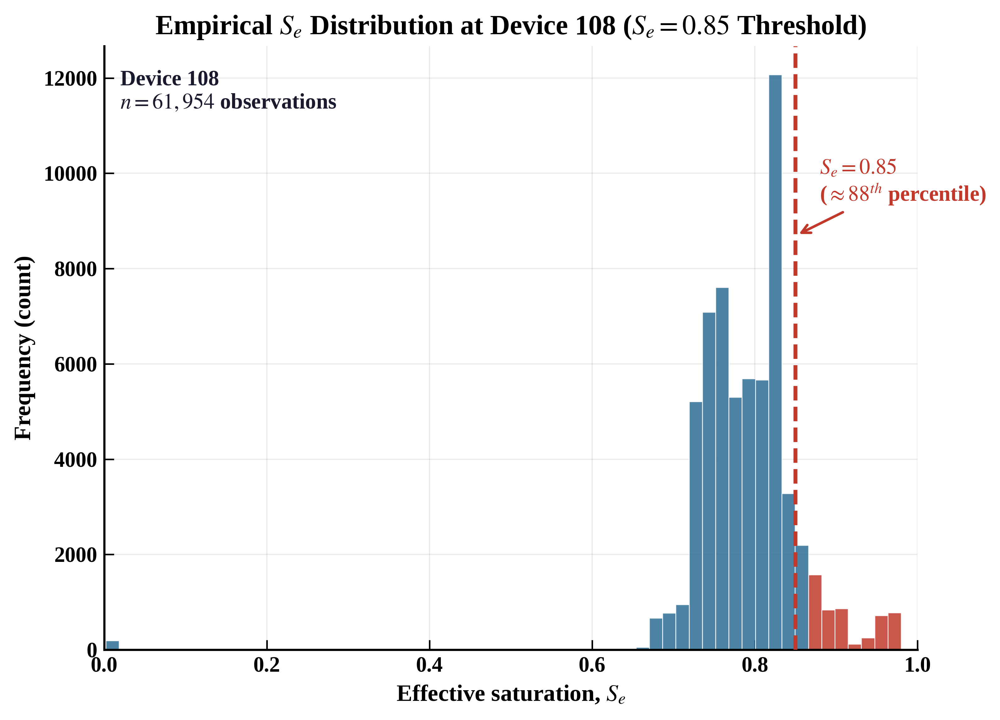

  → Saved: /content/outputs/manuscript_figure_9.png
  → Saved: /content/outputs/manuscript_figure_9.pdf
percentile of Se=0.85: 88.20576556800206 n= 61954 Se_range= 0.0019522800000000007 0.9800000000000001
fraction >= 0.85: 0.11794234431997934


In [4]:
# ──────────────────────────────────────────────────────────────
# FIG 9 — Empirical S_e Distribution at Device 108 (S_e=0.85 threshold)
# Reuses d108["soil"] (already loaded from pinn_108_new.csv + filtered
# to Device 108 in Part A above) instead of re-reading the CSV.
# rc_context keeps this figure's distinct styling local to this cell.
# ──────────────────────────────────────────────────────────────
FIG9_RC = {
    "font.family": "Liberation Serif",
    "mathtext.fontset": "stix",
    "axes.linewidth": 1.1,
    "xtick.direction": "in",
    "ytick.direction": "in",
    "xtick.major.size": 5,
    "ytick.major.size": 5,
}

with plt.rc_context(FIG9_RC):
    theta_r_se, theta_s_se = 0.05, 0.55
    Se = ((d108["soil"] - theta_r_se) / (theta_s_se - theta_r_se)).clip(0, 1).dropna()
    Se_thr = 0.85
    pct_of_thr = (Se < Se_thr).mean() * 100   # percentile rank of Se=0.85 in THIS dataset

    fig, ax = plt.subplots(figsize=(7.2, 5.2), dpi=450)
    n_counts, bins, patches = ax.hist(Se, bins=60, color="#2e6f95", alpha=0.85,
                                        edgecolor="white", linewidth=0.4, zorder=2)
    for patch, left in zip(patches, bins[:-1]):
        if left >= Se_thr:
            patch.set_facecolor("#c0392b")
            patch.set_alpha(0.85)
    ax.axvline(Se_thr, color="#c0392b", linestyle="--", linewidth=2.0, zorder=4)
    ymax = n_counts.max()
    ax.annotate(r"$S_e=0.85$" + "\n" + r"($\approx%d^{th}$ percentile)" % round(pct_of_thr),
                xy=(Se_thr, ymax * 0.72), xytext=(Se_thr + 0.03, ymax * 0.78),
                fontsize=11, fontweight="bold", color="#c0392b",
                arrowprops=dict(arrowstyle="->", color="#c0392b", lw=1.3))
    ax.text(0.02, 0.96, "Device 108\n$n = %s$ observations" % format(len(Se), ","),
            transform=ax.transAxes, fontsize=11, fontweight="bold",
            va="top", ha="left", color="#1a1a2e")
    ax.set_xlabel(r"Effective saturation, $S_e$", fontsize=12, fontweight="bold")
    ax.set_ylabel("Frequency (count)", fontsize=12, fontweight="bold")
    ax.set_title(r"Empirical $S_e$ Distribution at Device 108 ($S_e=0.85$ Threshold)",
                  fontsize=14, fontweight="bold")
    ax.set_xlim(0, 1)
    ax.tick_params(labelsize=11)
    for l in ax.get_xticklabels() + ax.get_yticklabels():
        l.set_fontweight("bold")
    ax.grid(alpha=0.25, linewidth=0.6, zorder=0)
    plt.tight_layout()

    fig9_png = os.path.join(OUT, "manuscript_figure_9.png")
    fig9_pdf = os.path.join(OUT, "manuscript_figure_9.pdf")
    fig.savefig(fig9_png, dpi=450, bbox_inches="tight", facecolor="white")
    fig.savefig(fig9_pdf, bbox_inches="tight", facecolor="white")
    display(fig)
    plt.close(fig)
    print(f"  → Saved: {fig9_png}")
    print(f"  → Saved: {fig9_pdf}")

print("percentile of Se=0.85:", pct_of_thr, "n=", len(Se), "Se_range=", Se.min(), Se.max())
print("fraction >= 0.85:", (Se >= 0.85).mean())


## Part A (continued) — HYDRUS-1D Depth-Dependent Amplitude Comparison (Fig 11)

Compares HYDRUS-1D simulated $\theta$ at two observation nodes — shallow (~6 cm, `Obs_Node_7.out`, already used by Fig 12c) and deep (~30 cm, `Obs_Node_31.out`) — against the same observed test-window $\theta$ (`theta_te` / `ts_te`, already in memory from Part A above). Reuses `parse_obs_node()`, `savefig()`, `light_grid()` and the `C`/`STYLE` conventions defined above. Optional — skipped automatically if either file is missing from `WORKDIR`.



[Step 10] Computing HYDRUS-1D depth-dependent theta comparison ...
  [6 cm  / Node 7 ]  R²=0.744  σ ratio=0.98  Pearson r=0.872
  [30 cm / Node 31]  R²=-0.048  σ ratio=0.32  Pearson r=0.115


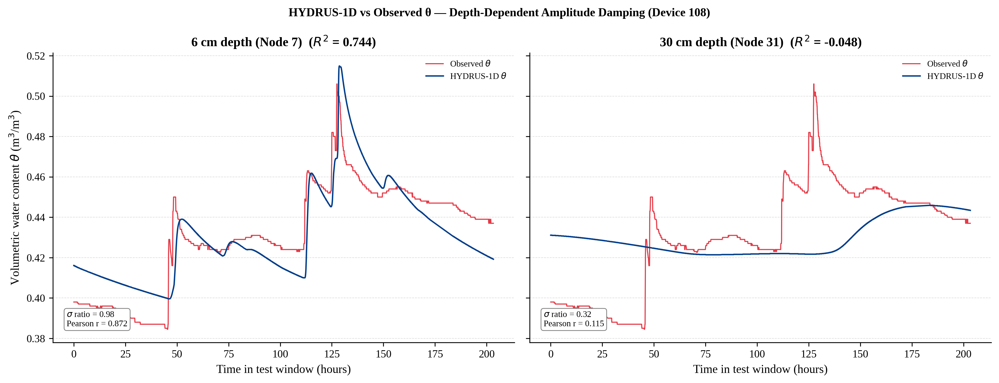

  → Saved: /content/outputs/manuscript_figure_11.png


In [5]:
# ──────────────────────────────────────────────────────────────
# FIG 11 — HYDRUS-1D vs Observed θ: Depth-Dependent Amplitude Damping
# Compares HYDRUS-1D simulated theta at a shallow node (~6 cm, Node 7)
# and a deep node (~30 cm, Node 31) against the SAME observed test-
# window theta (theta_te / ts_te from Part A above), to visualize
# depth-dependent numerical damping of HYDRUS-1D relative to the field
# sensor. Optional — only runs if both Obs_Node files are present.
# ──────────────────────────────────────────────────────────────
HYDRUS_SHALLOW     = str(WORKDIR / "Obs_Node_7.out")    # ~6 cm depth
HYDRUS_DEEP        = str(WORKDIR / "Obs_Node_31.out")   # ~30 cm depth

if all(os.path.exists(p) for p in [HYDRUS_SHALLOW, HYDRUS_DEEP]):
    print("\n[Step 10] Computing HYDRUS-1D depth-dependent theta comparison ...")

    df_sh = parse_obs_node(HYDRUS_SHALLOW)
    df_dp = parse_obs_node(HYDRUS_DEEP)

    # Align HYDRUS t=0 to the FIRST TEST-SET TIMESTAMP itself (t0 =
    # ts_te.min()) -- NOT a fixed calendar date. Matches Fig 10's corrected
    # convention: the HYDRUS run length (195.283 h) equals the test-set
    # span almost exactly, confirming t=0 is test-set start, not midnight
    # of an arbitrary date. [A fixed "2026-08-01 00:00" anchor was used
    # here previously; that is 17.35 h off true test start "2026-08-01
    # 17:21", which corrupted the alignment and disagreed with Fig 10.]
    ts_te_pd  = pd.to_datetime(ts_te)
    t0_10     = ts_te_pd.min()
    t_te_hr   = np.asarray((ts_te_pd - t0_10) / pd.Timedelta(hours=1))
    t_axis_hr = t_te_hr - t_te_hr.min()   # "time in test window (hours)"

    theta_hydrus_shallow = np.interp(t_te_hr, df_sh["time_hr"].values, df_sh["theta"].values)
    theta_hydrus_deep    = np.interp(t_te_hr, df_dp["time_hr"].values, df_dp["theta"].values)

    def _depth_stats(y, yhat):
        r2  = 1.0 - np.sum((y - yhat) ** 2) / np.sum((y - y.mean()) ** 2)
        sig = np.std(yhat) / np.std(y)
        r_p = np.corrcoef(y, yhat)[0, 1]
        return r2, sig, r_p

    r2_sh, sig_sh, pr_sh = _depth_stats(theta_te, theta_hydrus_shallow)
    r2_dp, sig_dp, pr_dp = _depth_stats(theta_te, theta_hydrus_deep)
    print(f"  [6 cm  / Node 7 ]  R²={r2_sh:.3f}  σ ratio={sig_sh:.2f}  Pearson r={pr_sh:.3f}")
    print(f"  [30 cm / Node 31]  R²={r2_dp:.3f}  σ ratio={sig_dp:.2f}  Pearson r={pr_dp:.3f}")

    fig, axes = plt.subplots(1, 2, figsize=(13, 5), sharey=True)
    panels = [
        (axes[0], theta_hydrus_shallow, r2_sh, sig_sh, pr_sh, "6 cm depth (Node 7)"),
        (axes[1], theta_hydrus_deep,    r2_dp, sig_dp, pr_dp, "30 cm depth (Node 31)"),
    ]
    for ax, yhat, r2, sig, pr, label in panels:
        ax.plot(t_axis_hr, theta_te, color=C["obs"],  lw=1.0, label=r"Observed $\theta$")
        ax.plot(t_axis_hr, yhat,     color=C["phys"], lw=1.3, label=r"HYDRUS-1D $\theta$")
        ax.set_title(f"{label}  ($R^2$ = {r2:.3f})")
        ax.set_xlabel("Time in test window (hours)")
        light_grid(ax)
        ax.text(0.03, 0.05, f"$\\sigma$ ratio = {sig:.2f}\nPearson r = {pr:.3f}",
                transform=ax.transAxes, fontsize=8, va="bottom",
                bbox=dict(boxstyle="round,pad=0.3", fc="white", ec="gray", lw=0.7))
        ax.legend(fontsize=8, loc="upper right")

    axes[0].set_ylabel(r"Volumetric water content $\theta$ (m$^3$/m$^3$)")
    fig.suptitle(
        "HYDRUS-1D vs Observed θ — Depth-Dependent Amplitude Damping (Device 108)",
        fontsize=11, fontweight="bold"
    )
    plt.tight_layout()
    savefig(fig, "manuscript_figure_11.png")
else:
    print("\n[Step 10] Skipped — HYDRUS Obs_Node_7.out / Obs_Node_31.out not found in WORKDIR.")


### Part A (continued) — LSTM baseline + 3-model comparison (checkpoint reproduction)

Loads the pretrained LSTM baseline checkpoint (`piml_slope_model_108_lstm_final.pt`) instead of
training it, then writes `manuscript_figure_10.png` (PINN / LSTM / MLP scatter comparison).



  [FIX 1] LSTM input shape verified: (24766, 15, 2)  ✓
          (was: (N, 1, 16) — single timestep, recurrent memory unused)
          (now: (N, 15, 2)  — 15 timesteps, each with [rain, θ])

████████████████████████████████████████████████████████████
  Training LSTM (same: epochs, LR, schedule, batch, seed)
  [FIX 1] proper sequence input: (B, 15, 2)
████████████████████████████████████████████████████████████
  LSTM params : 23,681
  PINN params : 43,777
  MLP  params : 43,777

[LSTM] Loading pretrained LSTM checkpoint instead of retraining ...
  Checkpoint: /content/piml_slope_model_108_lstm_final.pt
  ✓ Checkpoint matches current data pipeline (T_MIN/T_MAX/scaler_y identical)
  Best val: 0.00001  @ epoch 592  (from checkpoint, 600 epochs)

  [LSTM] Best val=0.00001  @ epoch 592

  Inference latency (single sample):
  [PINN  ] 0.178 ± 0.035 ms
  [LSTM  ] 0.347 ± 0.038 ms
  [MLP   ] 0.167 ± 0.018 ms

  [Fig 10] Observed series loaded from /content/outputs/test_predictions_108_by_pi

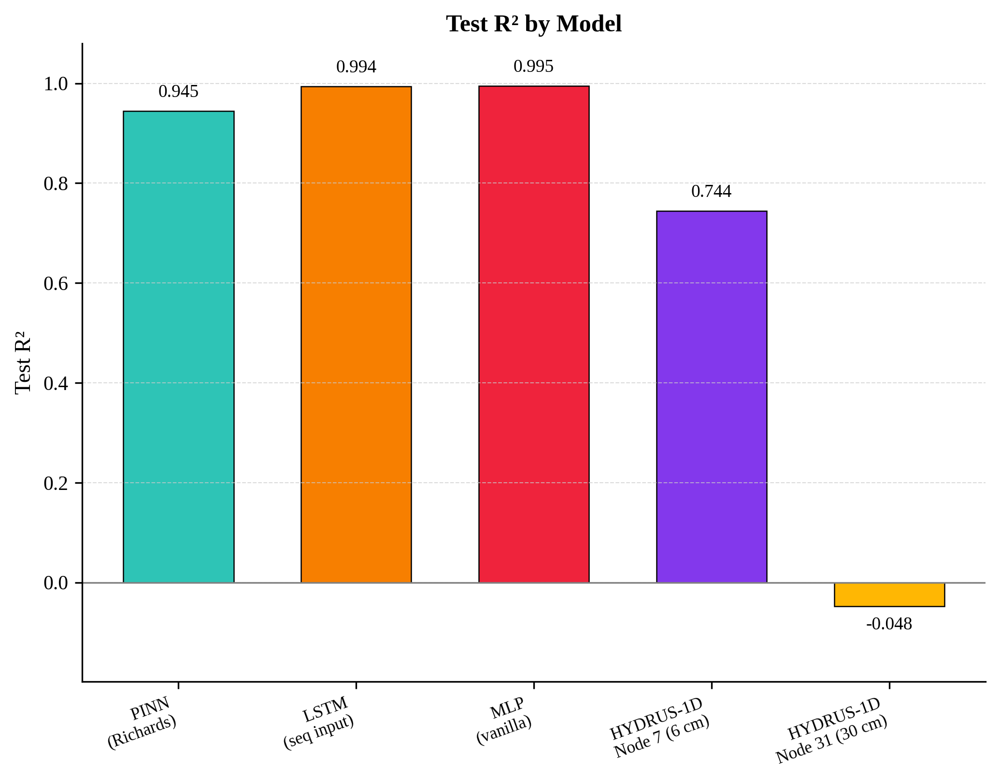

  → Saved: /content/outputs/manuscript_figure_10a.png


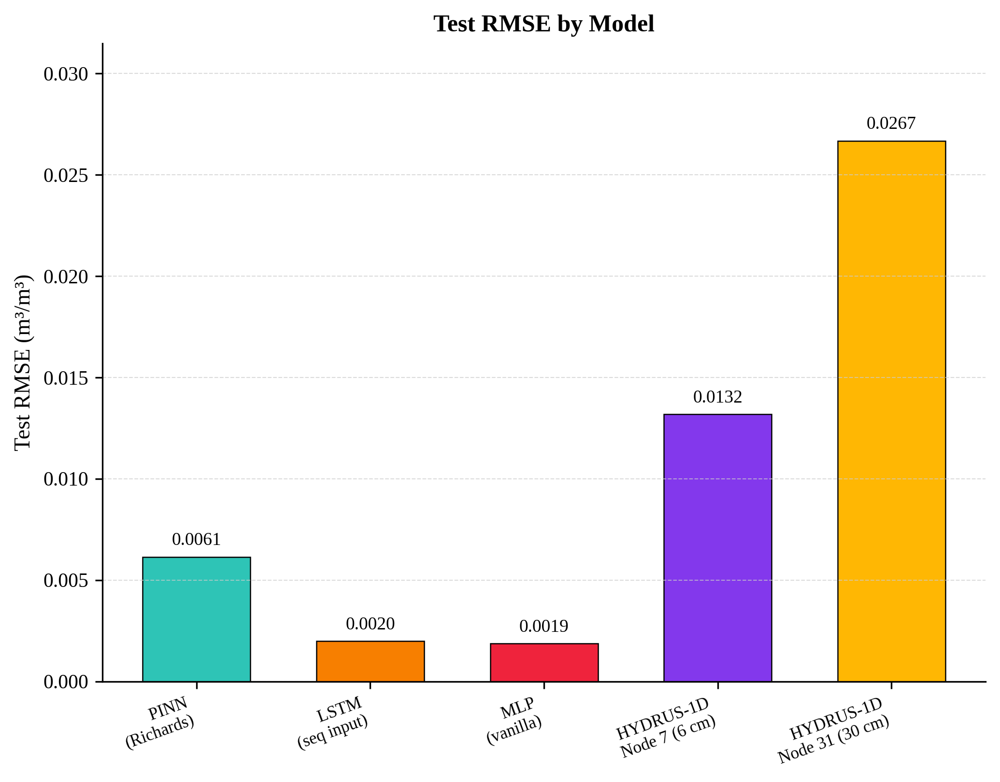

  → Saved: /content/outputs/manuscript_figure_10b.png

  Fig 10a/10b data:
    PINN (Richards)             R²= 0.9446   RMSE=0.00613
    LSTM (seq input)            R²= 0.9942   RMSE=0.00198
    MLP (vanilla)               R²= 0.9949   RMSE=0.00186
    HYDRUS-1D Node 7 (6 cm)     R²= 0.7443   RMSE=0.01318
    HYDRUS-1D Node 31 (30 cm)   R²=-0.0483   RMSE=0.02668

  PINN DIGITAL TWIN — RUN COMPLETE  (Device 108)

  Figures  → /content/outputs/
   manuscript_figure_8a.png
   manuscript_figure_8b.png
   manuscript_figure_8c.png
   manuscript_figure_12.png
   manuscript_figure_10a.png  (5-model Test R² bar chart)
   manuscript_figure_10b.png  (5-model Test RMSE bar chart)
   manuscript_figure_18a.png
   manuscript_figure_18b.png

  Data     → /content/outputs/
   fos_timeseries_main.csv
   test_predictions_108_by_pinn.csv
   sensitivity_ks_sweep.csv
   sensitivity_slope_sweep.csv
   sensitivity_2d_grid_ks_x_slope.csv


In [6]:
# ══════════════════════════════════════════════════════════════
# STEP A: LSTM Definition & Training  [FIX 1]
#
# পুরানো সমস্যা:
#   self.lstm = nn.LSTM(input_size=feat_dim, ...)  # feat_dim=16
#   x_seq = feat_flat.unsqueeze(1)                 # (B,1,16): SINGLE timestep
#   → LSTM recurrent memory কাজ করছিল না
#
# সমাধান:
#   input_size=2 (rain + theta per step)
#   sequence shape: (B, LAG, 2)  ← LAG=15 timesteps
# ══════════════════════════════════════════════════════════════

# ── LSTM-এর জন্য proper 3D sequence builder ──────────────────
def build_lstm_sequences(X_raw_norm, lag=LAG):
    """
    X_raw_norm : (N, 1+lag) — col0=rain_norm, col1..lag=theta_lags_norm
    Returns    : (N, lag, 2) — proper temporal sequence
                 dim0=timestep, dim1=[rain, theta_at_lag_k]
    """
    N   = X_raw_norm.shape[0]
    seq = np.zeros((N, lag, 2), dtype=np.float32)
    for k in range(lag):
        seq[:, k, 0] = X_raw_norm[:, 0]      # rain (same context at each step)
        seq[:, k, 1] = X_raw_norm[:, k + 1]  # lagged θ, newest first
    return seq

X_tr_lstm  = build_lstm_sequences(X_tr)    # (N_tr,  15, 2)
X_val_lstm = build_lstm_sequences(X_val)   # (N_val, 15, 2)
X_te_lstm  = build_lstm_sequences(X_te)    # (N_te,  15, 2)
X_all_lstm = build_lstm_sequences(X_norm)  # (N_all, 15, 2)

# Shape assertion — fail করলে dataloader ঠিক নেই
assert X_tr_lstm.shape == (len(X_tr), LAG, 2), \
    f"LSTM input shape wrong: got {X_tr_lstm.shape}, expected {(len(X_tr), LAG, 2)}"
print(f"\n  [FIX 1] LSTM input shape verified: {X_tr_lstm.shape}  ✓")
print(f"          (was: (N, 1, {1+LAG}) — single timestep, recurrent memory unused)")
print(f"          (now: (N, {LAG}, 2)  — {LAG} timesteps, each with [rain, θ])")


class SoilLSTM(nn.Module):
    """
    1-layer LSTM on proper (B, LAG, 2) sequence input.
    [FIX 1]: input_size=2, NOT feat_dim=16.
    Hidden=64, 3-layer head — matches original parameter budget.
    """
    def __init__(self, seq_features=2, h=64, num_layers=1):
        super().__init__()
        # [FIX 1] input_size=2, NOT the flat feat_dim
        self.lstm = nn.LSTM(input_size=seq_features, hidden_size=h,
                            num_layers=num_layers, batch_first=True)
        self.head = nn.Sequential(
            nn.Linear(h, h),       nn.Tanh(),
            nn.Linear(h, h // 2),  nn.Tanh(),
            nn.Linear(h // 2, 1),  nn.Sigmoid(),
        )
        self.theta_lo = VG["theta_r"] + 0.01
        self.theta_hi = VG["theta_s"] - 0.01

    def forward(self, x_seq):
        # [FIX 1] x_seq: (B, LAG, 2) — proper temporal sequence
        # NOT: feat_flat.unsqueeze(1) which gave (B, 1, 16)
        out, _  = self.lstm(x_seq)   # (B, LAG, H)
        h_last  = out[:, -1, :]      # last timestep hidden state: (B, H)
        raw     = self.head(h_last)
        return self.theta_lo + (self.theta_hi - self.theta_lo) * raw


print("\n" + "█"*60)
print("  Training LSTM (same: epochs, LR, schedule, batch, seed)")
print("  [FIX 1] proper sequence input: (B, 15, 2)")
print("█"*60)

torch.manual_seed(42); np.random.seed(42)
model_lstm = SoilLSTM(seq_features=2).to(DEVICE)
print(f"  LSTM params : {sum(p.numel() for p in model_lstm.parameters()):,}")
print(f"  PINN params : {sum(p.numel() for p in model.parameters()):,}")
print(f"  MLP  params : {sum(p.numel() for p in model_ml.parameters()):,}")

# [FIX 1] X_tr_lstm (3D sequence) দিয়ে DataLoader
lstm_dataset = TensorDataset(to_t(X_tr_lstm), to_t(y_tr))
lstm_loader  = DataLoader(lstm_dataset, batch_size=BATCH, shuffle=False)

opt_lstm   = optim.AdamW(model_lstm.parameters(), lr=LR, weight_decay=1e-4)
sched_lstm = optim.lr_scheduler.LambdaLR(opt_lstm, lr_lambda)

lstm_train_losses, lstm_val_losses = [], []
best_val_lstm, best_state_lstm = np.inf, None

Xv_lstm = to_t(X_val_lstm)  # validation도 3D

# ── Checkpoint reuse: skip retraining if a saved LSTM checkpoint exists ──
LSTM_CHECKPOINT_PATH = str(WORKDIR / "piml_slope_model_108_lstm_final.pt")
print(f"\n[LSTM] Loading pretrained LSTM checkpoint instead of retraining ...")
print(f"  Checkpoint: {LSTM_CHECKPOINT_PATH}")
_lstm_ckpt = torch.load(LSTM_CHECKPOINT_PATH, map_location=DEVICE, weights_only=False)

# sanity-check that this checkpoint was trained on the exact same data/pipeline
assert abs(_lstm_ckpt["scalers"]["T_MIN"] - T_MIN) < 1e-3, "T_MIN mismatch — different data split"
assert abs(_lstm_ckpt["scalers"]["T_MAX"] - T_MAX) < 1e-3, "T_MAX mismatch — different data split"
assert abs(_lstm_ckpt["scalers"]["scaler_y_min"][0] - scaler_y.data_min_[0]) < 1e-6, "scaler_y mismatch"
print("  ✓ Checkpoint matches current data pipeline (T_MIN/T_MAX/scaler_y identical)")

best_state_lstm   = _lstm_ckpt["model_state_dict"]
lstm_train_losses = _lstm_ckpt["train_losses"]
lstm_val_losses   = _lstm_ckpt["val_losses"]
best_val_lstm     = _lstm_ckpt["best_val_loss"]
print(f"  Best val: {best_val_lstm:.5f}  @ epoch {int(np.argmin(lstm_val_losses))+1}  (from checkpoint, {len(lstm_val_losses)} epochs)")

model_lstm.load_state_dict(best_state_lstm)
best_ep_lstm = int(np.argmin(lstm_val_losses)) + 1
print(f"\n  [LSTM] Best val={best_val_lstm:.5f}  @ epoch {best_ep_lstm}")




# ══════════════════════════════════════════════════════════════
# STEP C: Predict all models on all splits
# [FIX 1] pred_lstm এখন 3D sequence নেয়
# ══════════════════════════════════════════════════════════════
def pred_lstm(X_raw_norm_2d):
    """[FIX 1] Converts flat (N,16) → sequence (N,15,2) before inference."""
    model_lstm.eval()
    seq = build_lstm_sequences(X_raw_norm_2d)   # (N, LAG, 2)
    with torch.no_grad():
        return model_lstm(to_t(seq)).cpu().numpy().flatten()

# LSTM predictions
lstm_tr  = pred_lstm(X_tr)
lstm_val = pred_lstm(X_val)
lstm_te  = pred_lstm(X_te)
lstm_all = pred_lstm(X_norm)

# ══════════════════════════════════════════════════════════════
# STEP D: Metrics for all 4 models
# ══════════════════════════════════════════════════════════════
from sklearn.metrics import r2_score, mean_squared_error

def get_metrics(obs_tr, obs_val, obs_te, pr_tr, pr_val, pr_te):
    return {
        "r2_tr"   : r2_score(obs_tr,  pr_tr),
        "r2_val"  : r2_score(obs_val, pr_val),
        "r2_te"   : r2_score(obs_te,  pr_te),
        "rmse_te" : np.sqrt(mean_squared_error(obs_te, pr_te)),
        "mae_te"  : np.mean(np.abs(obs_te - pr_te)),
        "resid_te": obs_te - pr_te,
    }

def get_fos(theta_arr):
    psi_raw = vg_psi_np(theta_arr, VG)
    # [ALIGN v5] fixed physical bound instead of adaptive 2nd-percentile floor
    psi     = np.clip(psi_raw, PSI_MIN_M, PSI_MAX_M)
    u       = gamma_w * psi
    FoS     = (c_ + np.maximum(sigma_n - u, 0) * np.tan(phi_)) / (tau_d + 1e-8)
    return FoS, u

bench = {
    "PINN"  : get_metrics(theta_tr, theta_val, theta_te,
                          theta_pred_tr, theta_pred_val, theta_pred_te),
    "LSTM"  : get_metrics(theta_tr, theta_val, theta_te,
                          lstm_tr, lstm_val, lstm_te),
    "MLP"   : get_metrics(theta_tr, theta_val, theta_te,
                          theta_ml_tr, theta_ml_val, theta_ml_te),
}

for mname in bench:
    FoS, u = get_fos({"PINN"  : theta_pred_te,
                       "LSTM"  : lstm_te,
                       "MLP"   : theta_ml_te}[mname])
    bench[mname].update({
        "fos_mean": FoS.mean(), "fos_min": FoS.min(), "fos_std": FoS.std(),
        "n_fail"  : int((FoS < 1.0).sum()),
        "n_warn"  : int((FoS < 1.3).sum()),
        "fos_all" : FoS, "u_all": u,
    })

def approx_pde_resid(theta_arr, t_sec_arr):
    dth_dt = np.gradient(theta_arr, t_sec_arr - t_sec_arr[0] + 1e-8) / (T_MAX - T_MIN)
    K_arr  = vg_K_np(theta_arr, VG)
    dflux  = np.gradient(K_arr) / Z_MAX
    return dth_dt - dflux

pde_all = {
    "PINN"  : phys_residual,
    "LSTM"  : approx_pde_resid(lstm_all,  t_sec_np),
    "MLP"   : phys_residual_ml,
}
for m in bench:
    bench[m]["pde_mu"] = pde_all[m].mean()
    bench[m]["pde_sd"] = pde_all[m].std()


# ══════════════════════════════════════════════════════════════
# STEP E: Inference Speed
# ══════════════════════════════════════════════════════════════
import timeit
N_W, N_R       = 20, 200

def bench_speed(fn):
    for _ in range(N_W): fn()
    times = []
    for _ in range(N_R):
        t0 = timeit.default_timer()
        fn()
        times.append(timeit.default_timer() - t0)
    return np.array(times) * 1000

speed = {}
speed["PINN"]   = bench_speed(
    lambda: predict_sensor(X_norm[-1:], t_sec_np[-1:]))
speed["LSTM"]   = bench_speed(
    lambda: pred_lstm(X_norm[-1:]))
speed["MLP"]    = bench_speed(
    lambda: predict_sensor_ml(X_norm[-1:], t_sec_np[-1:]))

for m in bench:
    bench[m]["lat_mean_ms"] = speed[m].mean()
    bench[m]["lat_std_ms"]  = speed[m].std()

print("\n  Inference latency (single sample):")
for m in bench:
    mu = speed[m].mean()
    print(f"  [{m:6s}] {mu:.3f} ± {speed[m].std():.3f} ms")


# ══════════════════════════════════════════════════════════════
# FIGURES — unchanged from original (C1–C9)
# Only model descriptions updated to reflect fixes
# ══════════════════════════════════════════════════════════════
MODEL_NAMES = ["PINN", "LSTM", "MLP"]
COLORS = {"PINN": "#2EC4B6", "LSTM": "#F77F00", "MLP": "#EF233C"}
LS     = {"PINN": "-",       "LSTM": "--",       "MLP": ":"}
LABELS = {
    "PINN"  : "PINN (Richards)",
    "LSTM"  : "LSTM (seq input)",          # updated: proper sequence
    "MLP"   : "Vanilla MLP",
}

preds_all = {"PINN": theta_pred_all, "LSTM": lstm_all,
             "MLP": theta_ml_all}
preds_te  = {"PINN": theta_pred_te,  "LSTM": lstm_te,
             "MLP": theta_ml_te}

n_tr_p     = len(theta_tr)
n_va_p     = n_tr_p + len(theta_val)
ts_te_plot = ts[n_va_p:]

epochs_arr = np.arange(1, EPOCHS + 1)


# ── FIG 10 — 5-Model R²/RMSE Benchmark Bar Chart (Test Set, Device 108) ──
# Extends PINN/LSTM/MLP with two independent HYDRUS-1D forward-simulation
# baselines: Node 7 (6 cm — matches the real sensor depth) and Node 31
# (30 cm — deeper node, included for depth-sensitivity contrast). Both are
# interpolated onto the real observed test timestamps (ts_te), restricted
# to the overlap between the HYDRUS simulation window and the test window
# so no extrapolation is used.
HYDRUS_NODE7_PATH  = str(WORKDIR / "Obs_Node_7.out")
HYDRUS_NODE31_PATH = str(WORKDIR / "Obs_Node_31.out")

# Ground-truth observed series for this comparison comes straight from the
# Part-A CSV export (test_predictions_108_by_pinn.csv) rather than the
# in-memory theta_te/ts_te arrays — same numbers, but this ties Fig 10
# explicitly to a saved, inspectable artifact for reviewer reproducibility.
TEST_PRED_CSV_PATH = str(OUT / "test_predictions_108_by_pinn.csv")
df_test_pred = pd.read_csv(TEST_PRED_CSV_PATH, parse_dates=["timestamp"])
ts_te_csv    = df_test_pred["timestamp"].values
theta_te_csv = df_test_pred["theta_observed"].values.astype(np.float32)
assert len(theta_te_csv) == len(theta_te), "test_predictions_108_by_pinn.csv row count mismatch vs theta_te"
assert np.allclose(theta_te_csv, theta_te, atol=1e-5), "theta_observed in CSV does not match in-memory theta_te"
print(f"\n  [Fig 10] Observed series loaded from {TEST_PRED_CSV_PATH}  (n={len(theta_te_csv)}, verified vs theta_te)")

def hydrus_theta_vs_test(node_path):
    """Interpolate a HYDRUS Obs_Node .out theta series onto the observed
    test-set timestamps loaded from test_predictions_108_by_pinn.csv.
    HYDRUS t=0 is aligned to the FIRST TEST-SET TIMESTAMP itself (t0 =
    ts_te_csv.min()) -- NOT a fixed calendar date. This matches how the
    HYDRUS-1D run was actually set up: its simulation length (195.283 h =
    8.136 days) equals the test-set span almost exactly, confirming t=0
    corresponds to test-set start, not midnight of some arbitrary date.
    [Earlier version wrongly anchored t=0 to "2026-08-01 00:00", a ~17.35 h
    offset from true test start "2026-08-01 17:21", which corrupted the
    alignment and flipped the sign of the Node 7 R^2.]
    Returns (obs_subset, hydrus_pred_subset, n_used)."""
    df_node = parse_obs_node(node_path)
    t_ref = df_node["time_hr"].values
    ts_te_dt = pd.to_datetime(ts_te_csv)
    t0 = ts_te_dt.min()
    t_query_hr = np.asarray((ts_te_dt - t0) / pd.Timedelta(hours=1))
    theta_hyd = np.interp(t_query_hr, t_ref, df_node["theta"].values)
    return theta_te_csv, theta_hyd, len(theta_te_csv)

if os.path.exists(HYDRUS_NODE7_PATH) and os.path.exists(HYDRUS_NODE31_PATH):
    obs7_true,  obs7_pred,  n7  = hydrus_theta_vs_test(HYDRUS_NODE7_PATH)
    obs31_true, obs31_pred, n31 = hydrus_theta_vs_test(HYDRUS_NODE31_PATH)

    r2_node7,  rmse_node7  = r2_score(obs7_true,  obs7_pred),  np.sqrt(mean_squared_error(obs7_true,  obs7_pred))
    r2_node31, rmse_node31 = r2_score(obs31_true, obs31_pred), np.sqrt(mean_squared_error(obs31_true, obs31_pred))
    print(f"\n  [HYDRUS] Node 7  (6 cm, matched depth) vs test  n={n7} (t0=test start)   R²={r2_node7:.4f}  RMSE={rmse_node7:.5f}")
    print(f"  [HYDRUS] Node 31 (30 cm, deeper node)  vs test  n={n31} (t0=test start)   R²={r2_node31:.4f}  RMSE={rmse_node31:.5f}")

    BAR_NAMES  = ["PINN\n(Richards)", "LSTM\n(seq input)", "MLP\n(vanilla)",
                  "HYDRUS-1D\nNode 7 (6 cm)", "HYDRUS-1D\nNode 31 (30 cm)"]
    BAR_R2     = [bench["PINN"]["r2_te"],   bench["LSTM"]["r2_te"],   bench["MLP"]["r2_te"],
                  r2_node7,   r2_node31]
    BAR_RMSE   = [bench["PINN"]["rmse_te"], bench["LSTM"]["rmse_te"], bench["MLP"]["rmse_te"],
                  rmse_node7, rmse_node31]
    BAR_COLORS = [COLORS["PINN"], COLORS["LSTM"], COLORS["MLP"], "#8338EC", "#FFB703"]

    # ── Fig 10a — R² bar chart ──────────────────────────────────
    fig, ax = plt.subplots(figsize=(7, 5.5))
    bars = ax.bar(BAR_NAMES, BAR_R2, color=BAR_COLORS, edgecolor="black", lw=0.6, width=0.62)
    for b, v in zip(bars, BAR_R2):
        va  = "bottom" if v >= 0 else "top"
        off = 0.02 if v >= 0 else -0.02
        ax.text(b.get_x()+b.get_width()/2, v+off, f"{v:.3f}", ha="center", va=va, fontsize=9)
    ax.axhline(0, color="gray", lw=0.8)
    ax.set_ylabel("Test R²")
    ax.set_title("Test R² by Model")
    ax.set_ylim(min(BAR_R2)-0.15, 1.08)
    light_grid(ax)
    for t in ax.get_xticklabels(): t.set_rotation(20); t.set_ha("right"); t.set_fontsize(8.5)
    plt.tight_layout()
    savefig(fig, "manuscript_figure_10a.png")

    # ── Fig 10b — RMSE bar chart ─────────────────────────────────
    fig, ax = plt.subplots(figsize=(7, 5.5))
    bars = ax.bar(BAR_NAMES, BAR_RMSE, color=BAR_COLORS, edgecolor="black", lw=0.6, width=0.62)
    for b, v in zip(bars, BAR_RMSE):
        ax.text(b.get_x()+b.get_width()/2, v+max(BAR_RMSE)*0.015, f"{v:.4f}", ha="center", va="bottom", fontsize=9)
    ax.set_ylabel("Test RMSE (m³/m³)")
    ax.set_title("Test RMSE by Model")
    ax.set_ylim(0, max(BAR_RMSE)*1.18)
    light_grid(ax)
    for t in ax.get_xticklabels(): t.set_rotation(20); t.set_ha("right"); t.set_fontsize(8.5)
    plt.tight_layout()
    savefig(fig, "manuscript_figure_10b.png")

    print("\n  Fig 10a/10b data:")
    for nm, r2v, rmv in zip(BAR_NAMES, BAR_R2, BAR_RMSE):
        print(f"    {nm.replace(chr(10),' '):26s}  R²={r2v:7.4f}   RMSE={rmv:.5f}")
else:
    print("\n[Fig 10] HYDRUS Obs_Node_7.out / Obs_Node_31.out not found — bar-chart "
          "extension skipped.")



# ═══════════════════════════════════════════════════════════════
# DONE
# ═══════════════════════════════════════════════════════════════
print("\n" + "="*65)
print("  PINN DIGITAL TWIN — RUN COMPLETE  (Device 108)")
print("="*65)
print(f"\n  Figures  → {OUT}/")
print("   manuscript_figure_8a.png")
print("   manuscript_figure_8b.png")
print("   manuscript_figure_8c.png")
print("   manuscript_figure_12.png")
print("   manuscript_figure_10a.png  (5-model Test R² bar chart)")
print("   manuscript_figure_10b.png  (5-model Test RMSE bar chart)")
print("   manuscript_figure_18a.png")
print("   manuscript_figure_18b.png")
print(f"\n  Data     → {OUT}/")
print("   fos_timeseries_main.csv")
print("   test_predictions_108_by_pinn.csv")
print("   sensitivity_ks_sweep.csv")
print("   sensitivity_slope_sweep.csv")
print("   sensitivity_2d_grid_ks_x_slope.csv")


## Part B — Event-Based Infiltration Dynamics (Fig 16)

Reuses Part A's own PINN predictions (`fos_timeseries_main.csv`) — no separate model needed. Splits the full record into Dry / Moderate / Extreme rainfall bands and plots rainfall, soil moisture, infiltration rate, and FoS for each.

Scenario event windows:
  Dry       :    118 rows  |  2025-11-01 07:05:00  ->  2025-11-01 10:59:00  |  peak rain 0.00 mm/hr  |  theta range [0.070, 0.328]
  Moderate  :   2103 rows  |  2025-11-13 14:49:00  ->  2025-11-16 12:53:00  |  peak rain 3.63 mm/hr  |  theta range [0.426, 0.477]
  Extreme   :   4796 rows  |  2025-11-16 03:15:00  ->  2025-11-22 19:05:00  |  peak rain 45.26 mm/hr  |  theta range [0.449, 0.540]

Dry panel FoS range: [1.78, 5.84]  (deeply-dry theta -> very high suction -> FoS can legitimately run  into the tens/hundreds here; panel now uses its own auto-scaled y-axis)

  SUMMARY STATISTICS
  Scenario      Rain_mean theta_mean   Infil_mean  FoS_mean  FoS_min
  ---------------------------------------------------------------
  Dry               0.000     0.1021       0.0000     4.939    1.783
  Moderate          0.039     0.4477       0.0016     1.669    1.644
  Extreme           0.848     0.4858       0.0335     1.636    1.583


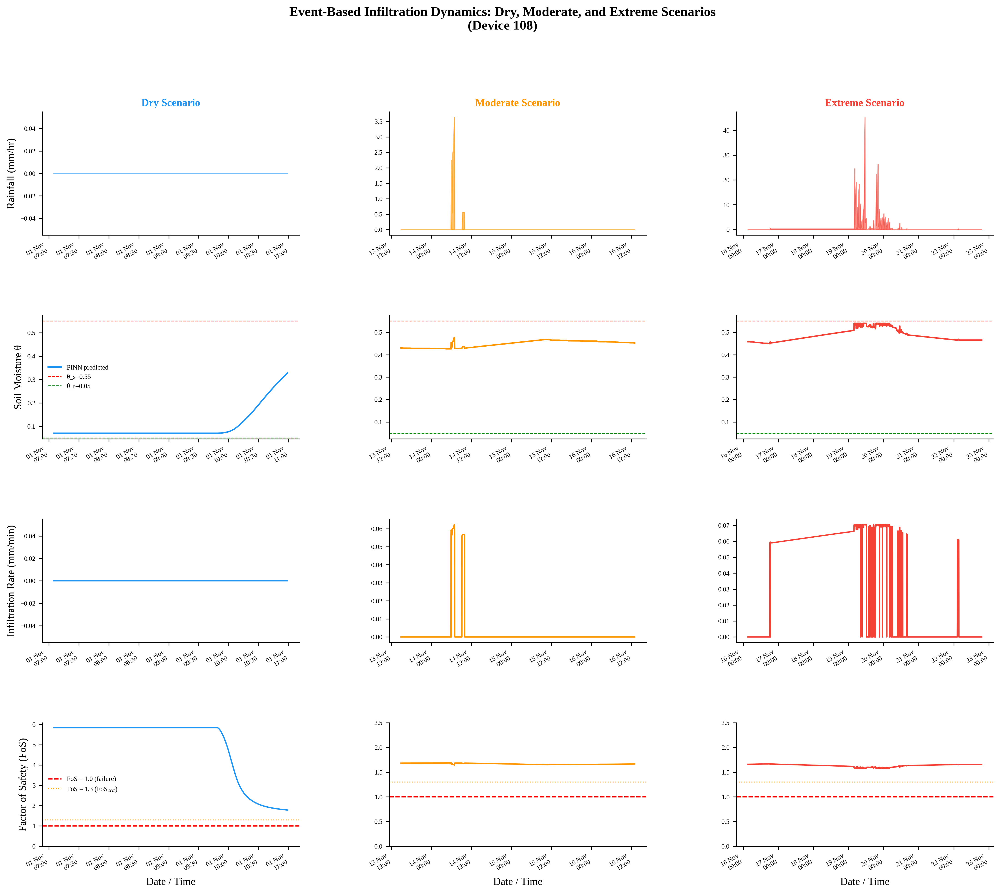


  Plot saved -> /content/outputs/manuscript_figure_16.png


In [7]:
# ══════════════════════════════════════════════════════════════════
# Part B — Event-Based Infiltration Dynamics: Dry / Moderate / Extreme
# (Fig 16) — rebuilt to reuse Part A's own PINN predictions directly,
# so NO separate model checkpoint is needed. This also makes Fig 16
# physically consistent with the rest of the manuscript (same Bishop
# c'=5 kPa formula used in Fig 17 / Fig 19 / table 10, rather than the
# older standalone script's leftover c'=10 kPa simplified formula).
#
# FIXED (this version): the previous version filtered the *entire*
# record by instantaneous rain_mm_min and concatenated whatever rows
# matched, then plotted them against a bare integer index. Because the
# matched rows for "Dry" (rain==0) and "Moderate" (a narrow rain band)
# were scattered across many disconnected days, stitching them into one
# sequential line created spurious jumps that made Dry/Moderate look as
# volatile as Extreme. This version instead selects ONE real, physically
# contiguous event per scenario band -- defined the same way as in the
# manuscript text: Dry (theta < 0.331, zero rainfall throughout),
# Moderate (0.331 <= theta < 0.431, peak rain ~3.6 mm/hr), Extreme
# (theta >= 0.431, peak rain ~45.3 mm/hr) -- and plots each against its
# own real timestamp axis (date + time), so the panels show genuine
# time evolution rather than an artificial stitched sequence.
#
# Input : fos_timeseries_main.csv (written by Part A)
#         columns used: timestamp, rain_mm_min, theta_piml, FoS_piml
# Output: manuscript_figure_16.png
# ══════════════════════════════════════════════════════════════════
import numpy as np
import pandas as pd
import matplotlib.gridspec as gridspec
import matplotlib.dates as mdates

# Van Genuchten / Bishop parameters (Device 108) — identical to Parts A/C/D
THETA_R, THETA_S = VG["theta_r"], VG["theta_s"]
KS_MS  = VG["Ks_ms"]           # m/s
KS_MM_MIN = KS_MS * 60_000.0   # mm/min

df15 = pd.read_csv(OUT / "fos_timeseries_main.csv", parse_dates=["timestamp"])
df15 = df15.sort_values("timestamp").reset_index(drop=True)

# infiltration rate estimate, Ks-limited (same closed form as the original script)
def infiltration_rate(theta, rain_mm_min):
    return np.minimum(rain_mm_min, KS_MM_MIN * (theta / THETA_S))

df15["infiltration"] = infiltration_rate(df15["theta_piml"].values, df15["rain_mm_min"].values)
df15["rain_mm_hr"]   = df15["rain_mm_min"]

# ── manuscript's theta bands (same numbers used in the Fig 16 caption) ──
THETA_DRY_MAX = 0.331   # Dry:      theta <  0.331, zero rainfall
THETA_MOD_MAX = 0.431   # Moderate: 0.331 <= theta < 0.431, peak ~3.6 mm/hr
                        # Extreme:  theta >= 0.431,          peak ~45.3 mm/hr
TARGET_PEAK_MOD, TARGET_PEAK_EXT = 3.6, 45.3

# ── sampling interval (minutes), used to size lead/tail buffers in steps ──
dt_min = df15["timestamp"].diff().dt.total_seconds().median() / 60.0
if not np.isfinite(dt_min) or dt_min <= 0:
    dt_min = 1.0

def steps(hours):
    return max(1, int(round(hours * 60.0 / dt_min)))

# ── 1) find contiguous rain events (bridge short dry lulls so one storm
#       with brief pauses stays a single event) ──────────────────────────
GAP_BRIDGE_HOURS = 3
bridge = steps(GAP_BRIDGE_HOURS)
is_wet = df15["rain_mm_hr"] > 0
wet_dilated = is_wet.rolling(window=bridge * 2 + 1, center=True, min_periods=1).max().astype(bool)
event_run = (wet_dilated != wet_dilated.shift(fill_value=False)).cumsum()
df15["_event_run"] = np.where(wet_dilated, event_run, -1)

TAIL_HOURS = 48       # look this far past rain-stop for the theta peak to register
LEAD_HOURS = 12       # show this much lead-in before the storm starts
tail_steps = steps(TAIL_HOURS)
lead_steps = steps(LEAD_HOURS)

events = []
for eid, g in df15[df15["_event_run"] >= 0].groupby("_event_run"):
    i0, i1 = g.index.min(), g.index.max()
    tail_end = min(i1 + tail_steps, df15.index.max())
    theta_resp = df15.loc[i0:tail_end, "theta_piml"]
    events.append(dict(
        event_id=eid,
        idx_start=i0, idx_end=i1, idx_tail_end=tail_end,
        peak_rain_mmhr=g["rain_mm_hr"].max(),
        theta_max=theta_resp.max(),
    ))
events = pd.DataFrame(events)

def make_window(idx_start, idx_end_incl, lead=0, tail=0):
    i0 = max(idx_start - lead, df15.index.min())
    i1 = min(idx_end_incl + tail, df15.index.max())
    return df15.loc[i0:i1].copy()

# ── 2) pick the Extreme event: theta reached >= 0.431, peak rain closest
#       to 45.3 mm/hr among those (falls back to the single highest-peak
#       event on record if nothing crosses the threshold) ────────────────
ext_cand = events[events["theta_max"] >= THETA_MOD_MAX]
if len(ext_cand):
    extreme_ev = ext_cand.loc[(ext_cand["peak_rain_mmhr"] - TARGET_PEAK_EXT).abs().idxmin()]
else:
    extreme_ev = events.loc[events["peak_rain_mmhr"].idxmax()]
win_extreme = make_window(extreme_ev["idx_start"], extreme_ev["idx_tail_end"], lead=lead_steps, tail=0)

# ── 3) pick the Moderate event: theta in [0.331, 0.431), peak rain
#       closest to 3.6 mm/hr ──────────────────────────────────────────────
mod_cand = events[(events["theta_max"] >= THETA_DRY_MAX) & (events["theta_max"] < THETA_MOD_MAX)]
if len(mod_cand):
    moderate_ev = mod_cand.loc[(mod_cand["peak_rain_mmhr"] - TARGET_PEAK_MOD).abs().idxmin()]
else:
    moderate_ev = events.loc[(events["peak_rain_mmhr"] - TARGET_PEAK_MOD).abs().idxmin()]
win_moderate = make_window(moderate_ev["idx_start"], moderate_ev["idx_tail_end"], lead=lead_steps, tail=0)

# ── 4) pick the Dry event: longest contiguous stretch of zero rainfall
#       with theta staying under 0.331 throughout, windowed to the same
#       duration as the Extreme panel for a fair visual comparison ───────
is_dry_ok = (df15["rain_mm_hr"] == 0) & (df15["theta_piml"] < THETA_DRY_MAX)
dry_run = (is_dry_ok != is_dry_ok.shift(fill_value=False)).cumsum()
dry_runs = [(g.index.min(), g.index.max(), len(g)) for _, g in df15[is_dry_ok].groupby(dry_run[is_dry_ok])]
if dry_runs:
    run_start, run_end, run_len = max(dry_runs, key=lambda x: x[2])
    dry_span = max(len(win_extreme), 2)
    mid = (run_start + run_end) // 2
    i0 = max(mid - dry_span // 2, run_start)
    i1 = min(i0 + dry_span, run_end)
    win_dry = df15.loc[i0:i1].copy()
else:
    win_dry = df15[df15["rain_mm_hr"] == 0].copy()

scenarios = {"Dry": win_dry, "Moderate": win_moderate, "Extreme": win_extreme}

print("Scenario event windows:")
for name, sub in scenarios.items():
    if len(sub):
        print(f"  {name:<10}: {len(sub):>6} rows  |  {sub['timestamp'].iloc[0]}  ->  {sub['timestamp'].iloc[-1]}"
              f"  |  peak rain {sub['rain_mm_hr'].max():.2f} mm/hr  |  theta range "
              f"[{sub['theta_piml'].min():.3f}, {sub['theta_piml'].max():.3f}]")
    else:
        print(f"  {name:<10}: no matching event found")

COLORS = {"Dry": "#2196F3", "Moderate": "#FF9800", "Extreme": "#F44336"}
row_titles = ["Rainfall (mm/hr)", "Soil Moisture θ", "Infiltration Rate (mm/min)", "Factor of Safety (FoS)"]

fig = plt.figure(figsize=(18, 14))
fig.suptitle("Event-Based Infiltration Dynamics: Dry, Moderate, and Extreme Scenarios\n"
             "(Device 108)",
             fontsize=14, fontweight="bold", y=0.99)
gs = gridspec.GridSpec(4, 3, figure=fig, hspace=0.65, wspace=0.35)

date_fmt = mdates.DateFormatter("%d %b\n%H:%M")

# FoS axis: fixed 0-6 range for all three columns
FOS_YMAX   = 2.5
FOS_YTICKS = [0, 0.5, 1, 1.5, 2, 2.5]

for col, name in enumerate(["Dry", "Moderate", "Extreme"]):
    r = scenarios[name]
    if len(r) < 2:
        print(f"  {name}: not enough samples in this record — panel skipped")
        continue
    t = r["timestamp"]
    color = COLORS[name]

    ax = fig.add_subplot(gs[0, col])
    ax.fill_between(t, r["rain_mm_hr"], alpha=0.6, color=color)  # raw per-minute rain, not the x60-scaled mm/hr version
    ax.set_title(f"{name} Scenario", fontweight="bold", color=color, fontsize=11)
    ax.set_ylabel(row_titles[0] if col == 0 else "")
    ax.tick_params(labelsize=7)
    ax.xaxis.set_major_formatter(date_fmt)
    plt.setp(ax.xaxis.get_majorticklabels(), rotation=30, ha="right")

    ax = fig.add_subplot(gs[1, col])
    ax.plot(t, r["theta_piml"], lw=1.5, color=color, label="PINN predicted")
    ax.axhline(THETA_S, ls="--", lw=0.8, color="red",   label=f"θ_s={THETA_S}")
    ax.axhline(THETA_R, ls="--", lw=0.8, color="green", label=f"θ_r={THETA_R}")
    ax.set_ylabel(row_titles[1] if col == 0 else "")
    if col == 0: ax.legend(fontsize=7)
    ax.tick_params(labelsize=7)
    ax.xaxis.set_major_formatter(date_fmt)
    plt.setp(ax.xaxis.get_majorticklabels(), rotation=30, ha="right")

    ax = fig.add_subplot(gs[2, col])
    ax.plot(t, r["infiltration"], lw=1.4, color=color)
    ax.set_ylabel(row_titles[2] if col == 0 else "")
    ax.tick_params(labelsize=7)
    ax.xaxis.set_major_formatter(date_fmt)
    plt.setp(ax.xaxis.get_majorticklabels(), rotation=30, ha="right")

    ax = fig.add_subplot(gs[3, col])
    # [UPDATED] plain FoS line for all three panels now that
    # draw_fig21_style_fos_panel() (storm shading / Se twin axis /
    # RED-YELLOW-GREEN T_L markers) has been removed from Part B.
    ax.plot(t, r["FoS_piml"], lw=1.4, color=color)
    ax.axhline(1.0, ls="--", lw=1.2, color="red",    label="FoS = 1.0 (failure)")
    ax.axhline(1.3, ls=":",  lw=1.0, color="orange", label="FoS = 1.3 (FoS$_{crit}$)")
    ax.set_ylabel(row_titles[3] if col == 0 else "")
    ax.set_xlabel("Date / Time")
    if name == "Dry":
        # [UPDATED] Dry-window FoS can be very large (deeply dry theta near
        # theta_r -> very high suction -> very high apparent FoS via the
        # infinite-slope formula), often far above the fixed 0-6 range used
        # for Moderate/Extreme. Give this panel its own auto-scaled axis
        # instead of forcing it into the shared FOS_YMAX/FOS_YTICKS.
        ax.set_ylim(bottom=0)
        ax.margins(y=0.08)
    else:
        ax.set_ylim(0, FOS_YMAX)
        ax.set_yticks(FOS_YTICKS)
    if col == 0: ax.legend(fontsize=7)
    ax.tick_params(labelsize=7)
    ax.xaxis.set_major_formatter(date_fmt)
    plt.setp(ax.xaxis.get_majorticklabels(), rotation=30, ha="right")

print()
print(f"Dry panel FoS range: [{win_dry['FoS_piml'].min():.2f}, {win_dry['FoS_piml'].max():.2f}]"
      f"  (deeply-dry theta -> very high suction -> FoS can legitimately run"
      f"  into the tens/hundreds here; panel now uses its own auto-scaled y-axis)")
print()
print("=" * 65)
print("  SUMMARY STATISTICS")
print("=" * 65)
header = f"  {'Scenario':<12} {'Rain_mean':>10} {'theta_mean':>10} {'Infil_mean':>12} {'FoS_mean':>9} {'FoS_min':>8}"
print(header)
print("  " + "-" * 63)
for name, r in scenarios.items():
    if len(r) < 2:
        continue
    print(f"  {name:<12} {r['rain_mm_hr'].mean():>10.3f} {r['theta_piml'].mean():>10.4f} "
          f"{r['infiltration'].mean():>12.4f} {r['FoS_piml'].mean():>9.3f} {r['FoS_piml'].min():>8.3f}")
print("=" * 65)

fig.savefig(str(OUT / "manuscript_figure_16.png"), dpi=450, bbox_inches="tight", facecolor="white")
display(fig)
plt.close(fig)
print(f"\n  Plot saved -> {OUT / 'manuscript_figure_16.png'}")


## Part C — Sensitivity Analysis (Fig 17a–17e, Table 8)

Reads `fos_timeseries_main.csv` from Part A. Strict ±20% one-at-a-time sweeps on slope angle, friction angle, failure depth, and Ks, plus the summary tornado diagram.

baseline mean FoS = 1.6809


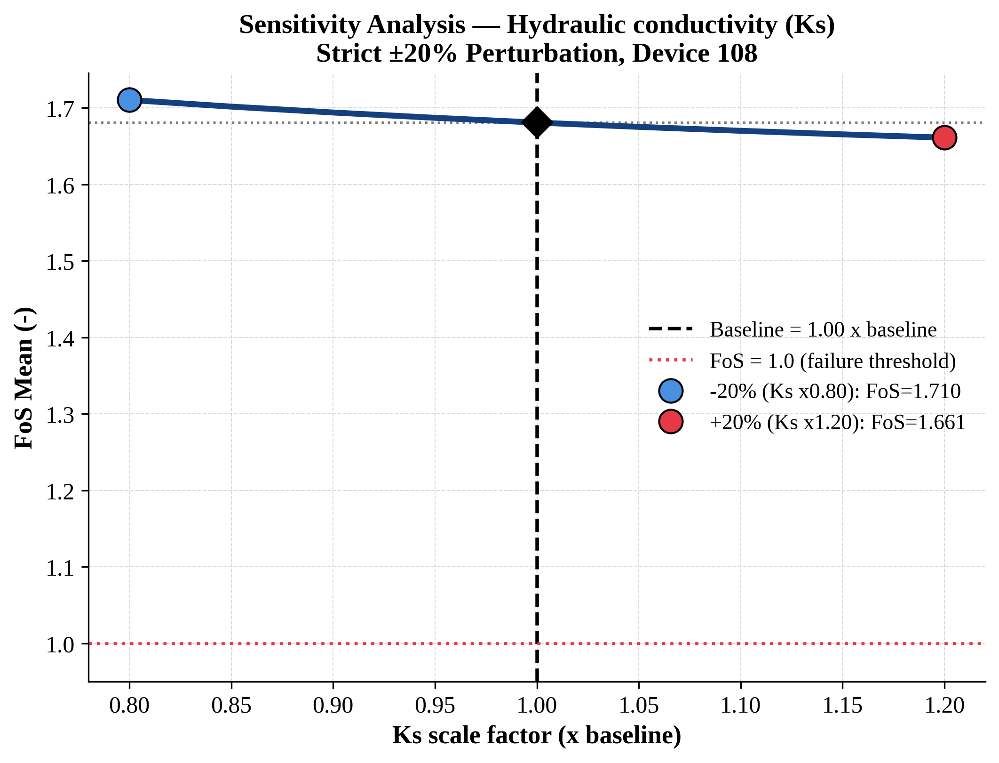

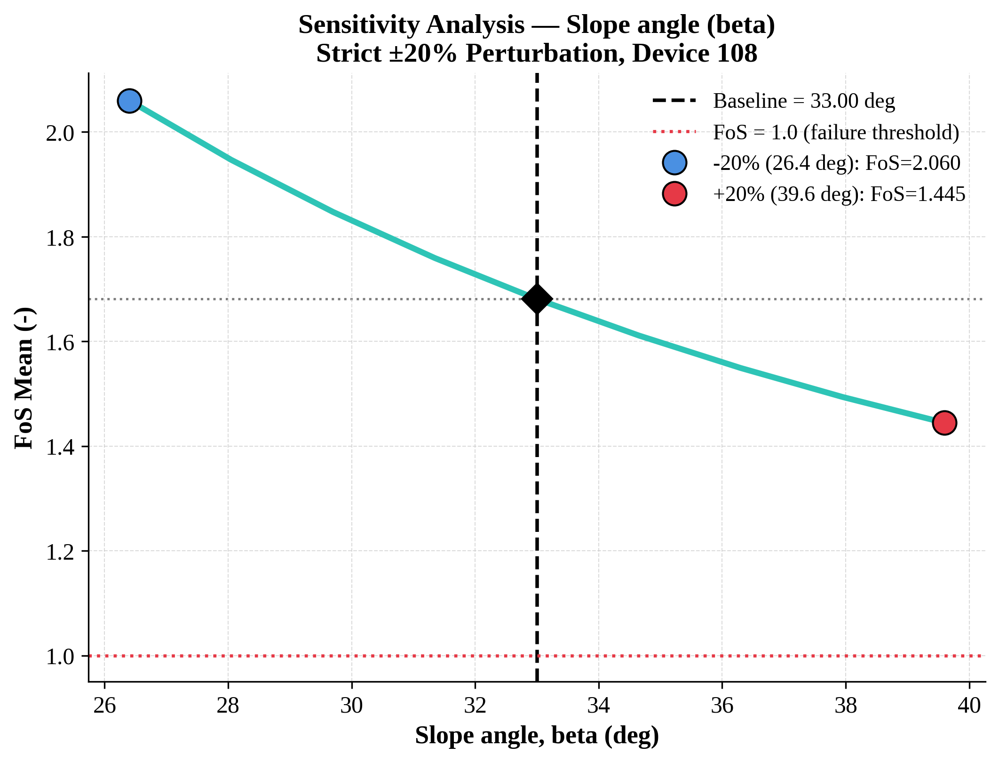

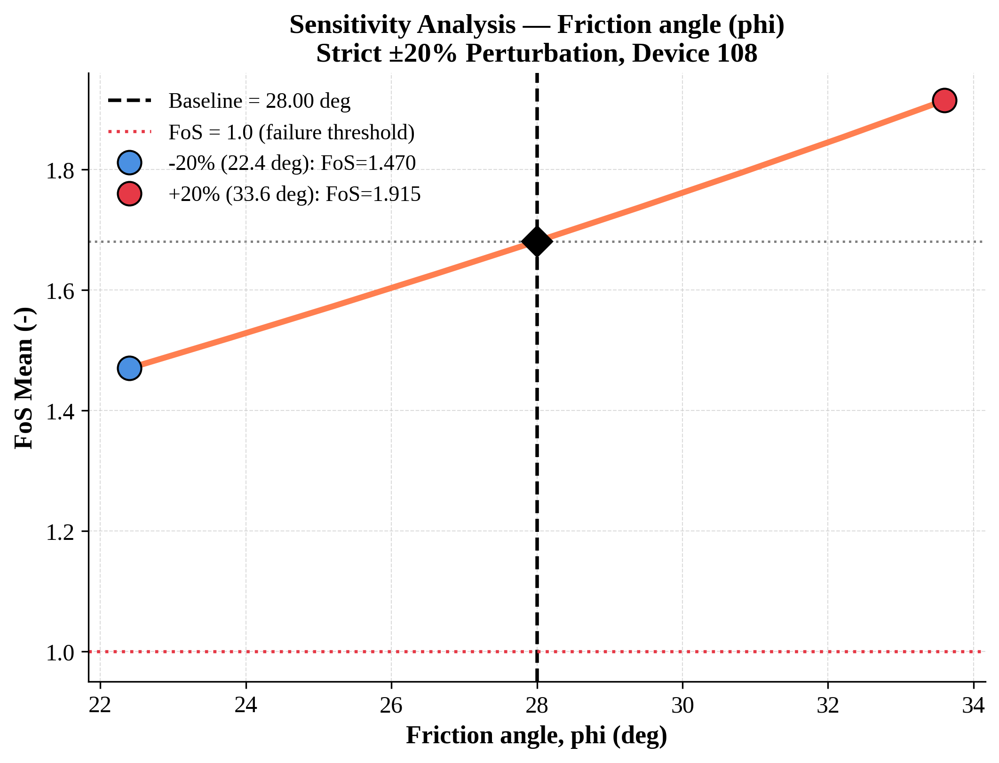

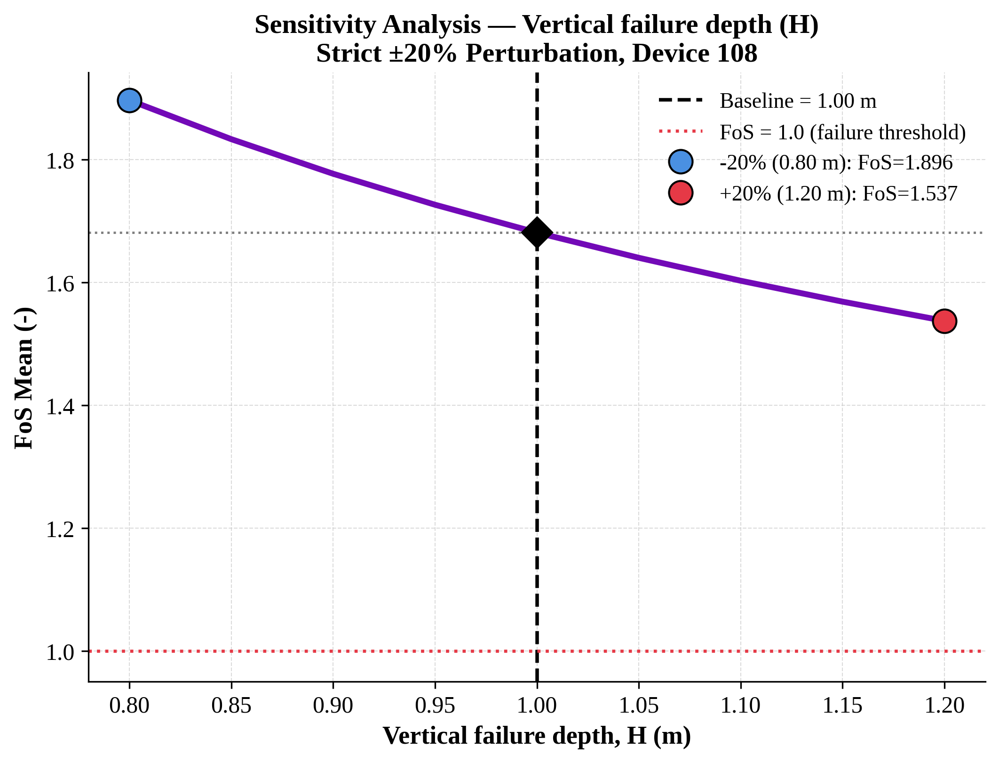

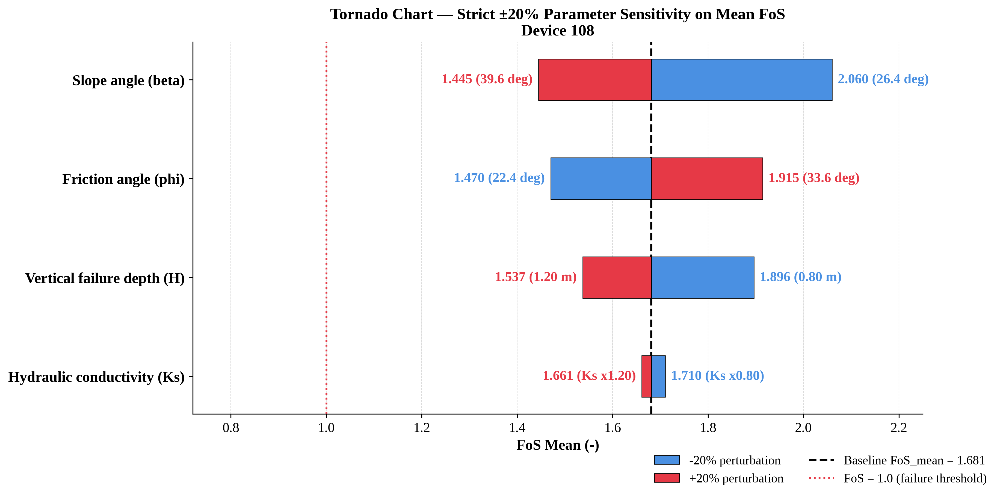

                  parameter  baseline_FoS_mean  baseline_value  FoS_minus20  FoS_plus20  dFoS_minus20  dFoS_plus20
         Slope angle (beta)             1.6809            33.0     2.059898    1.444518      0.379013    -0.236367
       Friction angle (phi)             1.6809            28.0     1.470230    1.914714     -0.210655     0.233828
 Vertical failure depth (H)             1.6809             1.0     1.896417    1.537198      0.215531    -0.143687
Hydraulic conductivity (Ks)             1.6809             1.0     1.710444    1.661180      0.029558    -0.019706

Wrote: manuscript_figure_17a..16e and sensitivity_values.csv


In [8]:
#!/usr/bin/env python3
# -*- coding: utf-8 -*-
"""
make_figSA1_SA5.py
==================
Reproducible generator for the five sensitivity-analysis figures of the PIML
slope-stability manuscript (Section 4.6):

    manuscript_figure_17e.png   tornado diagram, 4 parameters
    manuscript_figure_17d.png              hydraulic conductivity sweep
    manuscript_figure_17a.png           slope angle (beta) sweep
    manuscript_figure_17b.png   friction angle (phi) sweep
    manuscript_figure_17c.png               vertical failure depth (H) sweep

All figures are computed from the SAME Bishop factor-of-safety pipeline that
produced fos_timeseries_main.csv, so the baseline mean FoS = 1.678 is identical
to Section 5 and Table 8. Each parameter is perturbed independently by +/-20%
about its calibrated value; the mean FoS over the analysed record is recomputed
at every perturbation.

Effective-stress FoS (infinite-slope, Mohr-Coulomb, Bishop unsaturated):
    u_w   = S_e * gamma_w * psi_eff              (Eq. 14, Bishop pore pressure)
    sigma = gamma_s * H * cos^2(beta)
    tau   = gamma_s * H * sin(beta) * cos(beta)
    FoS   = ( c' + max(sigma - u_w, 0) * tan(phi') ) / tau
with psi the matric suction head inverted from the PINN-predicted theta through
the van Genuchten retention curve, clipped to the physical PWP bound (-165 m).

Ks is not a network input; its influence is estimated post hoc by the same
suction-scaling proxy used in the manuscript: psi_eff = psi / ks_scale (a lower
Ks retains water -> higher suction magnitude -> higher FoS), applied before the
Bishop pore-pressure step.

INPUT (one file, exported by the Dev-108 Bishop FoS pipeline):
    fos_timeseries_main.csv         (columns: theta_piml, psi_piml_m)
    * psi_piml_m is used directly if present (recommended: identical to Section 5).
    * if psi_piml_m is absent, psi is reconstructed from theta_piml via van
      Genuchten with the parameters below (produces the same series to ~1e-4 m).

OUTPUT:
    the five PNG files above
    sensitivity_values.csv          (every plotted number, for Table 8)

USAGE:
    python make_figSA1_SA5.py --csv fos_timeseries_main.csv --outdir .

DEPENDENCIES:
    python >= 3.9, numpy, pandas, matplotlib   (no internet, deterministic)
"""

import argparse
import numpy as np
import pandas as pd
import matplotlib
matplotlib.use("Agg")
import matplotlib.pyplot as plt

# --------------------------------------------------------------------------- #
#  Calibrated baseline parameters (Device 108 — must match Table 3 / Section 3)
# --------------------------------------------------------------------------- #
# geotechnical
BETA0_DEG = 33.0      # slope angle
PHI0_DEG  = 28.0      # effective friction angle
COH       = 5.0       # effective cohesion c'  (kPa)
GAMMA_S   = 14.715    # soil unit weight       (kN/m^3)
H0        = 1.0       # vertical failure depth (m)
GAMMA_W   = 9.81      # unit weight of water   (kN/m^3)
KS0       = 1.0       # baseline Ks scale factor (proxy space)

# van Genuchten retention (Sandy Clay Loam, Dev 108) — used only if psi absent
THETA_R   = 0.05
THETA_S   = 0.55
ALPHA_VG  = 5.9       # 1/m
N_VG      = 1.48
PSI_MIN_M = -165.0    # physical permanent-wilting-point bound (m)
PSI_MAX_M = 0.0

PERTURB   = 0.20      # strict +/-20%
N_CURVE   = 9         # points along each 1-D sweep curve

# consistent colours
C_BLUE, C_RED = "#4A90E2", "#E63946"


# --------------------------------------------------------------------------- #
#  Load theta / psi and set up the suction head
# --------------------------------------------------------------------------- #
def vg_suction_head(theta):
    """Invert van Genuchten retention curve: theta -> matric suction head psi (m)."""
    m = 1.0 - 1.0 / N_VG
    Se = np.clip((np.clip(theta, THETA_R + 1e-6, THETA_S - 1e-6) - THETA_R)
                 / (THETA_S - THETA_R), 1e-6, 1 - 1e-6)
    return -(1.0 / ALPHA_VG) * (Se ** (-1.0 / m) - 1.0) ** (1.0 / N_VG)


def load_state(csv_path):
    """Return theta, effective saturation Se, and clipped suction head psi (m)."""
    f = pd.read_csv(csv_path)
    theta = f["theta_piml"].to_numpy()
    if "psi_piml_m" in f.columns:
        psi = np.clip(f["psi_piml_m"].to_numpy(), PSI_MIN_M, PSI_MAX_M)
    else:                                   # reconstruct if not exported
        psi = np.clip(vg_suction_head(theta), PSI_MIN_M, PSI_MAX_M)
    Se = np.clip((np.clip(theta, THETA_R + 1e-6, THETA_S - 1e-6) - THETA_R)
                 / (THETA_S - THETA_R), 0.0, 1.0)
    return theta, Se, psi


# --------------------------------------------------------------------------- #
#  Bishop effective-stress factor of safety
# --------------------------------------------------------------------------- #
def fos_mean(Se, psi, beta_deg=BETA0_DEG, phi_deg=PHI0_DEG,
             H=H0, ks_scale=KS0):
    """Mean Bishop infinite-slope FoS over the record for one parameter set."""
    psi_eff = psi / ks_scale                          # Ks suction-scaling proxy
    u_w = Se * GAMMA_W * psi_eff                       # Eq. 14 (Bishop)
    b = np.radians(beta_deg)
    sigma = GAMMA_S * H * np.cos(b) ** 2
    tau   = GAMMA_S * H * np.sin(b) * np.cos(b)
    fos = (COH + np.maximum(sigma - u_w, 0.0) * np.tan(np.radians(phi_deg))) / (tau + 1e-9)
    return float(np.mean(fos))


# --------------------------------------------------------------------------- #
#  Shared plotting style
# --------------------------------------------------------------------------- #
def set_style():
    plt.rcParams.update({
        "font.family": "serif",
        "font.serif": ["Times New Roman", "Liberation Serif", "DejaVu Serif"],
        "font.size": 11, "axes.labelsize": 13, "axes.titlesize": 14,
        "axes.titleweight": "bold", "axes.labelweight": "bold",
        "axes.spines.top": False, "axes.spines.right": False,
        "legend.frameon": False, "legend.fontsize": 11,
        "savefig.dpi": 300, "savefig.bbox": "tight", "savefig.facecolor": "white",
        "xtick.labelsize": 12, "ytick.labelsize": 12,
    })


def sweep_figure(fname, title, xlabel, xs, y_of_x, x0, base,
                 lo_label, hi_label, curve_color, legend_loc, outdir):
    """One 1-D sensitivity curve with the -20% / +20% endpoints marked."""
    ys  = [y_of_x(x) for x in xs]
    ylo, yhi = y_of_x(xs[0]), y_of_x(xs[-1])
    fig, ax = plt.subplots(figsize=(8.2, 5.6))
    ax.plot(xs, ys, color=curve_color, lw=3, zorder=2)
    ax.axvline(x0, color="black", ls="--", lw=1.8,
               label=f"Baseline = {lo_label[2]}")
    ax.axhline(1.0, color=C_RED, ls=":", lw=1.6, label="FoS = 1.0 (failure threshold)")
    ax.axhline(base, color="gray", ls=":", lw=1.2, zorder=1)
    ax.plot([x0], [base], marker="D", color="black", ms=11, zorder=4)
    ax.plot([xs[0]],  [ylo], "o", color=C_BLUE, mec="black", ms=12, zorder=4,
            label=f"-20% ({lo_label[0]}): FoS={ylo:.3f}")
    ax.plot([xs[-1]], [yhi], "o", color=C_RED, mec="black", ms=12, zorder=4,
            label=f"+20% ({lo_label[1]}): FoS={yhi:.3f}")
    ax.set_xlabel(xlabel); ax.set_ylabel("FoS Mean (-)")
    ax.set_title(title); ax.set_ylim(0.95, None)
    ax.grid(color="#CCCCCC", lw=0.5, ls="--", alpha=0.7)
    ax.legend(loc=legend_loc)
    fig.savefig(f"{outdir}/{fname}"); display(fig); plt.close(fig)
    return ylo, yhi


def tornado_figure(fname, base, params, outdir):
    """Tornado diagram; params = [(name, ylo, yhi, lo_lbl, hi_lbl), ...]."""
    params = sorted(params, key=lambda p: abs(p[1] - p[2]))   # smallest at bottom
    fig, ax = plt.subplots(figsize=(11.5, 5.9))
    ypos = np.arange(len(params))
    for y, (nm, lo, hi, llb, hlb) in zip(ypos, params):
        ax.barh(y, lo - base, left=base, color=C_BLUE, ec="black", lw=0.6,
                height=0.42, zorder=3, label="-20% perturbation" if y == 0 else None)
        ax.barh(y, hi - base, left=base, color=C_RED, ec="black", lw=0.6,
                height=0.42, zorder=3, label="+20% perturbation" if y == 0 else None)
        right_val, right_lbl = (lo, llb) if lo > hi else (hi, hlb)
        left_val,  left_lbl  = (hi, hlb) if lo > hi else (lo, llb)
        ax.text(right_val + 0.012, y, f"{right_val:.3f} {right_lbl}",
                va="center", ha="left", fontsize=12, fontweight="bold",
                color=C_BLUE if right_val == lo else C_RED)
        ax.text(left_val - 0.012, y, f"{left_val:.3f} {left_lbl}",
                va="center", ha="right", fontsize=12, fontweight="bold",
                color=C_BLUE if left_val == lo else C_RED)
    ax.axvline(base, color="black", ls="--", lw=1.8,
               label=f"Baseline FoS_mean = {base:.3f}")
    ax.axvline(1.0, color=C_RED, ls=":", lw=1.6, label="FoS = 1.0 (failure threshold)")
    ax.set_yticks(ypos); ax.set_yticklabels([p[0] for p in params],
                                            fontsize=13, fontweight="bold")
    ax.set_xlabel("FoS Mean (-)"); ax.set_xlim(0.72, 2.25)
    ax.set_title("Tornado Chart — Strict ±20% Parameter Sensitivity on Mean FoS\n"
                 "Device 108")
    ax.grid(axis="x", color="#CCCCCC", lw=0.5, ls="--", alpha=0.7)
    h, l = ax.get_legend_handles_labels()
    order = [2, 3, 0, 1]                      # baseline, failure, -20, +20
    fig.legend([h[i] for i in order], [l[i] for i in order], loc="lower right",
               bbox_to_anchor=(0.98, -0.06), ncol=2, fontsize=11)
    fig.savefig(f"{outdir}/{fname}"); display(fig); plt.close(fig)


# --------------------------------------------------------------------------- #
def main(csv, outdir):
    class _A: pass
    args = _A(); args.csv = csv; args.outdir = outdir

    set_style()
    _, Se, psi = load_state(args.csv)

    base = fos_mean(Se, psi)
    print(f"baseline mean FoS = {base:.4f}")

    lo, hi = 1 - PERTURB, 1 + PERTURB

    # ---- SA2  Ks ----
    ks_lo, ks_hi = sweep_figure(
        "manuscript_figure_17d.png",
        "Sensitivity Analysis — Hydraulic conductivity (Ks)\n"
        "Strict ±20% Perturbation, Device 108",
        "Ks scale factor (x baseline)",
        np.linspace(KS0 * lo, KS0 * hi, N_CURVE),
        lambda x: fos_mean(Se, psi, ks_scale=x), KS0, base,
        ("Ks x0.80", "Ks x1.20", "1.00 x baseline"),
        None, "#14407D", "center right", args.outdir)

    # ---- SA3  slope angle ----
    sl_lo, sl_hi = sweep_figure(
        "manuscript_figure_17a.png",
        "Sensitivity Analysis — Slope angle (beta)\n"
        "Strict ±20% Perturbation, Device 108",
        "Slope angle, beta (deg)",
        np.linspace(BETA0_DEG * lo, BETA0_DEG * hi, N_CURVE),
        lambda x: fos_mean(Se, psi, beta_deg=x), BETA0_DEG, base,
        (f"{BETA0_DEG*lo:.1f} deg", f"{BETA0_DEG*hi:.1f} deg", f"{BETA0_DEG:.2f} deg"),
        None, "#2EC4B6", "upper right", args.outdir)

    # ---- SA4  friction angle ----
    ph_lo, ph_hi = sweep_figure(
        "manuscript_figure_17b.png",
        "Sensitivity Analysis — Friction angle (phi)\n"
        "Strict ±20% Perturbation, Device 108",
        "Friction angle, phi (deg)",
        np.linspace(PHI0_DEG * lo, PHI0_DEG * hi, N_CURVE),
        lambda x: fos_mean(Se, psi, phi_deg=x), PHI0_DEG, base,
        (f"{PHI0_DEG*lo:.1f} deg", f"{PHI0_DEG*hi:.1f} deg", f"{PHI0_DEG:.2f} deg"),
        None, "#FF7F50", "upper left", args.outdir)

    # ---- SA5  failure depth ----
    H_lo, H_hi = sweep_figure(
        "manuscript_figure_17c.png",
        "Sensitivity Analysis — Vertical failure depth (H)\n"
        "Strict ±20% Perturbation, Device 108",
        "Vertical failure depth, H (m)",
        np.linspace(H0 * lo, H0 * hi, N_CURVE),
        lambda x: fos_mean(Se, psi, H=x), H0, base,
        (f"{H0*lo:.2f} m", f"{H0*hi:.2f} m", f"{H0:.2f} m"),
        None, "#7209B7", "upper right", args.outdir)

    # ---- SA1  tornado (endpoints reused from the sweeps above) ----
    tornado_figure(
        "manuscript_figure_17e.png", base,
        [("Slope angle (beta)",         sl_lo, sl_hi, "(26.4 deg)", "(39.6 deg)"),
         ("Friction angle (phi)",       ph_lo, ph_hi, "(22.4 deg)", "(33.6 deg)"),
         ("Vertical failure depth (H)", H_lo,  H_hi,  "(0.80 m)",   "(1.20 m)"),
         ("Hydraulic conductivity (Ks)",ks_lo, ks_hi, "(Ks x0.80)", "(Ks x1.20)")],
        args.outdir)

    # ---- machine-readable value table (Table 8) ----
    rows = [
        ("Slope angle (beta)",          BETA0_DEG, sl_lo, sl_hi),
        ("Friction angle (phi)",        PHI0_DEG,  ph_lo, ph_hi),
        ("Vertical failure depth (H)",  H0,        H_lo,  H_hi),
        ("Hydraulic conductivity (Ks)", KS0,       ks_lo, ks_hi),
    ]
    out = pd.DataFrame(
        [(nm, b0, ylo, yhi, ylo - base, yhi - base) for nm, b0, ylo, yhi in rows],
        columns=["parameter", "baseline_value",
                 "FoS_minus20", "FoS_plus20", "dFoS_minus20", "dFoS_plus20"])
    out.insert(1, "baseline_FoS_mean", round(base, 4))
    out.to_csv(f"{args.outdir}/sensitivity_values.csv", index=False)
    print(out.to_string(index=False))
    print("\nWrote: manuscript_figure_17a..16e and sensitivity_values.csv")





main(csv=str(OUT / "fos_timeseries_main.csv"), outdir=str(OUT))


## Part D — Bishop Pore-Pressure Mechanism + table 10 (Fig 19a, Fig 19b)

Reads `fos_timeseries_main.csv` from Part A.

  [Table 10 / Fig 19] canonical population (dedup + spin-up/outage + Se>=0.50): n = 30,193


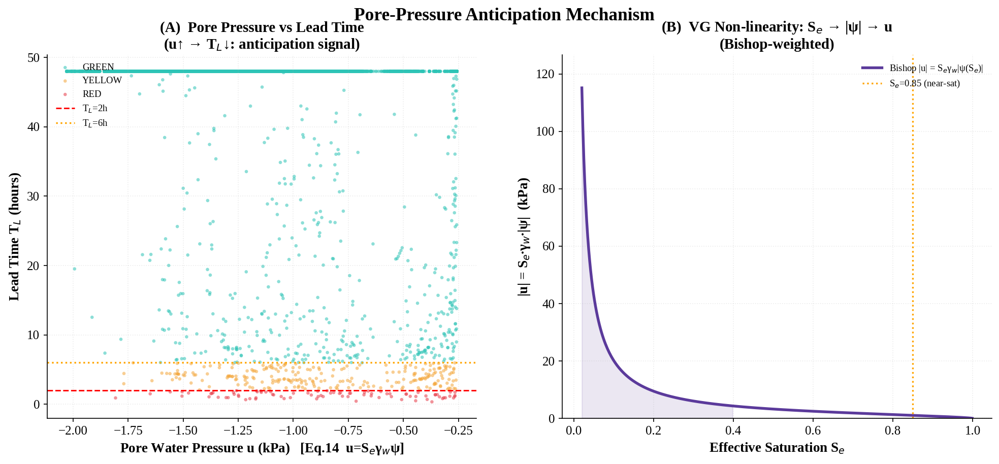

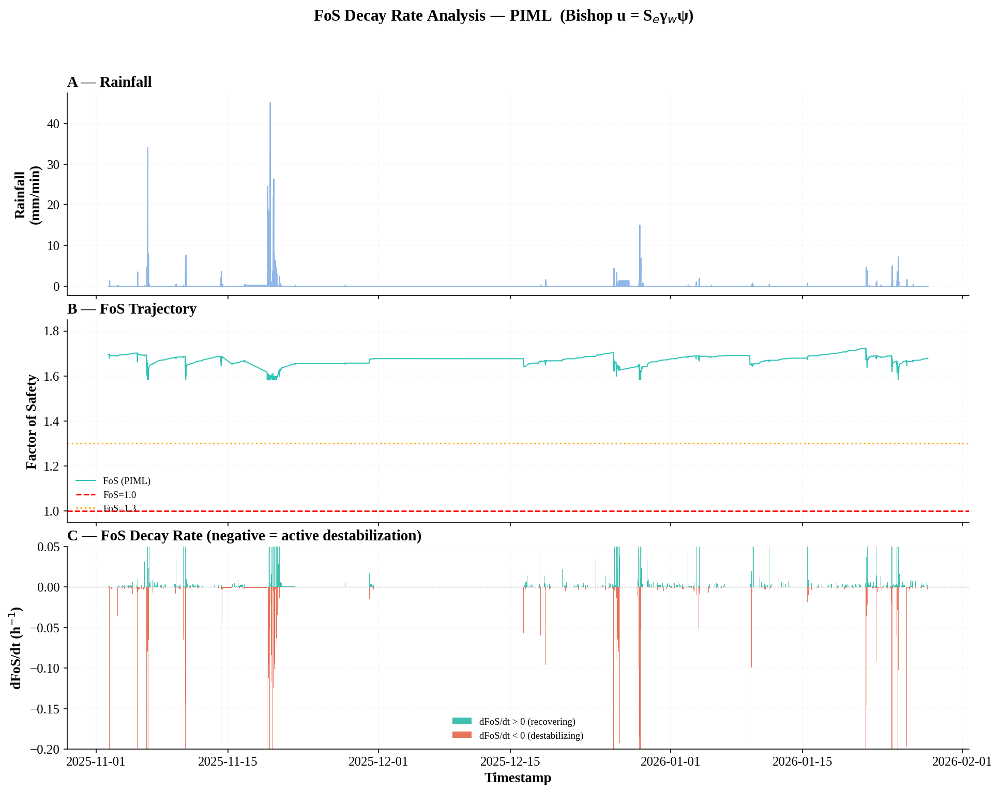

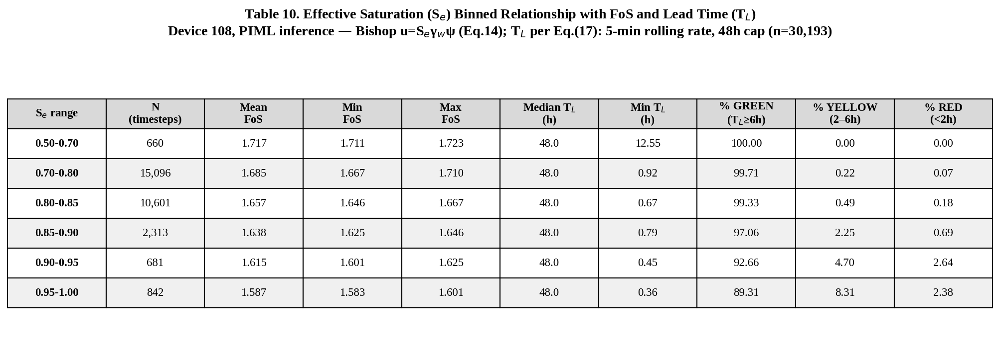

Saved: manuscript_figure_19a.png, manuscript_figure_19b.png, table 10.png, table 10.csv
FoS floor = 1.583 | FoS max = 1.723 | n(Se>=0.5) = 30,193
       Se     N  MeanFoS   MinFoS   MaxFoS  MedTL     MinTL      GREEN   YELLOW      RED
0.50-0.70   660 1.716724 1.711168 1.723185   48.0 12.547426 100.000000 0.000000 0.000000
0.70-0.80 15096 1.684826 1.667160 1.709626   48.0  0.918884  99.708532 0.218601 0.072867
0.80-0.85 10601 1.656908 1.646269 1.667148   48.0  0.667235  99.330252 0.490520 0.179228
0.85-0.90  2313 1.637721 1.624662 1.646260   48.0  0.791926  97.060095 2.248163 0.691742
0.90-0.95   681 1.615114 1.600706 1.624633   48.0  0.450625  92.657856 4.698972 2.643172
0.95-1.00   842 1.587439 1.582979 1.600589   48.0  0.357468  89.311164 8.313539 2.375297


In [9]:
# -*- coding: utf-8 -*-
# =====================================================================
#  Figure 19(a), Figure 19(b) and table 10  — PIML slope-stability outputs
#  Pore-water pressure uses the Bishop effective-saturation form (Eq. 14):
#        u_w = Se * gamma_w * psi
#  Input : fos_timeseries_main.csv  (needs: timestamp, rain_mm_min,
#          theta_piml, psi_piml_m)   -> psi may also be recomputed from theta
#  Output: manuscript_figure_19a.png, manuscript_figure_19b.png, table 10.png, table 10.csv
# =====================================================================
import numpy as np
import pandas as pd
import matplotlib
matplotlib.use("Agg")
import matplotlib.pyplot as plt

# ---------------------------------------------------------------------
# 0.  Parameters (edit to match your run)
# ---------------------------------------------------------------------
CSV_IN = str(OUT / "fos_timeseries_main.csv")

# Van Genuchten (soil)
VG = dict(theta_r=0.05, theta_s=0.55, alpha=5.9, n=1.48)   # alpha [1/m]
VG["m"] = 1.0 - 1.0 / VG["n"]
PSI_MIN_M, PSI_MAX_M = -165.0, 0.0                          # suction clip [m]

# Geotechnical (infinite-slope, per unit area)
gamma_w = 9.81            # kN/m^3  (unit weight of water)
gamma_s = 14.715          # kN/m^3  (unit weight of soil)
c_kPa   = 5.0             # effective cohesion c'
phi_deg = 28.0            # effective friction angle phi'
H_m     = 1.0             # failure depth
SLOPE   = 33.0            # slope angle beta [deg]

# Lead-time (Eq. 17) -- canonical definition, IDENTICAL to Fig 21 / Fig 22-23 / Table 11:
# causal backward difference at native cadence, no smoothing, margin to FOS_CRIT (not FoS=1.0).
TL_CAP_H   = 48.0         # cap on lead time [h]
FOS_CRIT   = 1.3          # Eq. 17 warning threshold (matches Fig 21 / Fig 22 / Table 11)
DECAY_TRIG = 0.05         # |dFoS/dt| threshold [1/h] used in the text
SE_BINS   = [0.50, 0.70, 0.80, 0.85, 0.90, 0.95, 1.0001]

plt.rcParams.update({
    "font.family": "serif",
    "font.serif": ["Times New Roman", "Liberation Serif", "DejaVu Serif"],
    "axes.spines.top": False, "axes.spines.right": False,
    "figure.dpi": 150, "savefig.dpi": 300, "savefig.bbox": "tight",
})

# ---------------------------------------------------------------------
# 1.  Physics helpers
# ---------------------------------------------------------------------
def vg_Se(theta):
    th = np.clip(theta, VG["theta_r"] + 1e-6, VG["theta_s"] - 1e-6)
    return np.clip((th - VG["theta_r"]) / (VG["theta_s"] - VG["theta_r"]), 1e-6, 1 - 1e-6)

def vg_psi(theta):
    """Van Genuchten matric suction ψ(θ) in metres (Eq. 3), <= 0."""
    Se = vg_Se(theta)
    return -(1.0 / VG["alpha"]) * (Se ** (-1.0 / VG["m"]) - 1.0) ** (1.0 / VG["n"])

def pore_pressure_bishop(theta, psi):
    """Eq. 14 — Bishop effective-saturation pore-water pressure u_w = Se·γw·ψ."""
    return vg_Se(theta) * gamma_w * psi

def fos_infinite_slope(u_kPa, slope_deg):
    """Eqs. 15/16 — infinite-slope Factor of Safety."""
    beta = np.radians(slope_deg)
    sigma_n = gamma_s * H_m * np.cos(beta) ** 2
    tau_d   = gamma_s * H_m * np.sin(beta) * np.cos(beta)
    eff     = np.maximum(sigma_n - u_kPa, 0.0)
    return (c_kPa + eff * np.tan(np.radians(phi_deg))) / (tau_d + 1e-8)

def lead_time(FoS, t_hours):
    """Eq. 17 — canonical definition, matches Fig 21 (compute_lead_time) and
    Fig 22/23 + Table 11 (load_stream) exactly: causal backward difference of FoS
    at native (irregular) cadence, NO smoothing, margin to FOS_CRIT=1.3, 48h cap.
    (Previously this used FoS-1.0 and a centered rolling-mean-smoothed np.gradient,
    which silently disagreed with the rest of the manuscript's Eq. 17 pipeline --
    fixed so Table 10 / Fig 19 are directly comparable to Fig 21 / Fig 22-23 / Table 11.)"""
    dt_h = np.diff(t_hours)
    rate = np.full(len(FoS), np.nan)
    rate[1:] = np.diff(FoS) / dt_h                      # causal backward diff, no look-ahead
    decay = np.abs(np.minimum(rate, 0.0))                # only destabilization (falling FoS) counts
    with np.errstate(divide="ignore", invalid="ignore"):
        TL = np.where(decay > 1e-12, (FoS - FOS_CRIT) / decay, TL_CAP_H)
    TL = np.minimum(TL, TL_CAP_H)
    TL[np.isnan(rate)] = TL_CAP_H                        # first sample has no backward diff
    return np.clip(TL, 0.0, TL_CAP_H), rate

# ---------------------------------------------------------------------
# 2.  Load data and derive the FoS / TL series
# ---------------------------------------------------------------------
df = pd.read_csv(CSV_IN)
df["timestamp"] = pd.to_datetime(df["timestamp"])
df = df.sort_values("timestamp").reset_index(drop=True)
df = df.drop_duplicates(subset="timestamp", keep="first").reset_index(drop=True)  # defensive no-op on this record (0 duplicates found, confirmed) -- kept so the pipeline is safe if a future device/run does have duplicate timestamps

# --- canonical population (Section 5.4.1), kept IDENTICAL to Part G / Table 11: ---
#   dedup -> drop 24-h spin-up + post-outage samples -> restrict to Se >= 0.50 (operational range)
# so Table 10, Fig 19, Fig 22/23 and Table 11 all report the exact same n.
SPINUP_H  = 24.0     # initial spin-up excluded (Section 5.4.1)
OUTAGE_S  = 3600.0   # a gap > 1 h marks a post-outage sample to drop
_gap_s    = df["timestamp"].diff().dt.total_seconds()
_t0       = df["timestamp"].iloc[0]
_analysed_mask = (df["timestamp"] >= _t0 + pd.Timedelta(hours=SPINUP_H)) & ~(_gap_s > OUTAGE_S)
df = df[_analysed_mask].reset_index(drop=True)

theta = df["theta_piml"].values
# use stored psi if present, else recompute from theta (both clipped identically)
if "psi_piml_m" in df.columns:
    psi = np.clip(df["psi_piml_m"].values, PSI_MIN_M, PSI_MAX_M)
else:
    psi = np.clip(vg_psi(theta), PSI_MIN_M, PSI_MAX_M)

df["Se"]     = vg_Se(theta)
df["u_kPa"]  = pore_pressure_bishop(theta, psi)        # Eq. 14 (Bishop)
df["FoS"]    = fos_infinite_slope(df["u_kPa"].values, SLOPE)
t_h          = (df["timestamp"] - df["timestamp"].iloc[0]).dt.total_seconds().values / 3600.0
df["TL"], df["dFoSdt"] = lead_time(df["FoS"].values, t_h)
df["tier"]   = np.where(df["TL"] < 2, "RED", np.where(df["TL"] < 6, "YELLOW", "GREEN"))

op = df[df["Se"] >= 0.50].reset_index(drop=True)       # operational range = Table-7
print(f"  [Table 10 / Fig 19] canonical population (dedup + spin-up/outage + Se>=0.50): n = {len(op):,}")

# ---------------------------------------------------------------------
# 3.  FIGURE 19(a) — Pore-Pressure Anticipation Mechanism
# ---------------------------------------------------------------------
C = dict(green="#2EC4B6", yellow="#F4A63A", red="#E63946", psi="#5B3A9B")
fig, ax = plt.subplots(1, 2, figsize=(16, 6.2))
fig.suptitle("Pore-Pressure Anticipation Mechanism", fontsize=17, fontweight="bold")

# (A) u vs lead time, coloured by alert tier
for lab, col in [("GREEN", C["green"]), ("YELLOW", C["yellow"]), ("RED", C["red"])]:
    m = df["tier"] == lab
    ax[0].scatter(df["u_kPa"][m], df["TL"][m], s=10, c=col, alpha=0.55,
                  edgecolors="none", label=lab)
ax[0].axhline(2, ls="--", c="red",    lw=1.4, label="T$_L$=2h")
ax[0].axhline(6, ls=":",  c="orange", lw=1.6, label="T$_L$=6h")
ax[0].set_xlabel("Pore Water Pressure u (kPa)   [Eq.14  u=S$_e$γ$_w$ψ]")
ax[0].set_ylabel("Lead Time T$_L$ (hours)")
ax[0].set_title("(A)  Pore Pressure vs Lead Time\n(u↑ → T$_L$↓: anticipation signal)")
ax[0].legend(fontsize=9, loc="upper left"); ax[0].grid(alpha=0.25, ls=":")

# (B) Bishop non-linearity |u| = Se·γw·|ψ(Se)| vs Se
Se_grid = np.linspace(0.02, 0.999, 400)
theta_grid = VG["theta_r"] + Se_grid * (VG["theta_s"] - VG["theta_r"])
u_curve = np.abs(pore_pressure_bishop(theta_grid, vg_psi(theta_grid)))
ax[1].plot(Se_grid, u_curve, color=C["psi"], lw=2.6,
           label="Bishop |u| = S$_e$γ$_w$|ψ(S$_e$)|")
ax[1].fill_between(Se_grid, u_curve, where=Se_grid <= 0.40, color=C["psi"], alpha=0.12)
ax[1].axvline(0.85, ls=":", c="orange", lw=1.6, label="S$_e$=0.85 (near-sat)")
ax[1].set_xlabel("Effective Saturation S$_e$")
ax[1].set_ylabel("|u| = S$_e$·γ$_w$·|ψ|  (kPa)")
ax[1].set_title("(B)  VG Non-linearity: S$_e$ → |ψ| → u\n(Bishop-weighted)")
ax[1].legend(fontsize=9, loc="upper right"); ax[1].grid(alpha=0.25, ls=":")
ax[1].set_ylim(0, u_curve.max() * 1.1)
fig.savefig(str(OUT / "manuscript_figure_19a.png")); display(fig); plt.close(fig)

# ---------------------------------------------------------------------
# 4.  FIGURE 19(b) — FoS Decay-Rate Analysis (operational range Se>=0.50)
# ---------------------------------------------------------------------
Cb = dict(rain="#8FB7E8", fos="#2EC4B6", recov="#3FBFB0", destab="#E8735B")
fig, ax = plt.subplots(3, 1, figsize=(15, 11), sharex=True,
                       gridspec_kw={"hspace": 0.12})
fig.suptitle("FoS Decay Rate Analysis — PIML  (Bishop u = S$_e$γ$_w$ψ)",
             fontsize=15, fontweight="bold")
t = op["timestamp"]; FoS = op["FoS"].values; rate = op["dFoSdt"].values

ax[0].fill_between(t, op["rain_mm_min"], color=Cb["rain"], step="mid")
ax[0].set_ylabel("Rainfall\n(mm/min)"); ax[0].set_title("A — Rainfall", loc="left", fontweight="bold")

ax[1].plot(t, FoS, color=Cb["fos"], lw=1.0, label="FoS (PIML)")
ax[1].axhline(1.0, ls="--", c="red",    lw=1.3, label="FoS=1.0")
ax[1].axhline(1.3, ls=":",  c="orange", lw=1.5, label="FoS=1.3")
ax[1].set_ylabel("Factor of Safety"); ax[1].set_title("B — FoS Trajectory", loc="left", fontweight="bold")
ax[1].legend(fontsize=9, loc="lower left"); ax[1].set_ylim(0.95, 1.85)

ax[2].bar(t, np.where(rate >= 0, rate, 0), width=0.02, color=Cb["recov"],
          label="dFoS/dt > 0 (recovering)")
ax[2].bar(t, np.where(rate <  0, rate, 0), width=0.02, color=Cb["destab"],
          label="dFoS/dt < 0 (destabilizing)")
ax[2].axhline(0, c="gray", lw=0.6, ls=":")
ax[2].set_ylabel("dFoS/dt (h$^{-1}$)")
ax[2].set_title("C — FoS Decay Rate (negative = active destabilization)", loc="left", fontweight="bold")
ax[2].set_xlabel("Timestamp"); ax[2].legend(fontsize=9, loc="lower center")
rate_finite = rate[np.isfinite(rate)]
rate_floor  = rate_finite.min() if rate_finite.size else -0.20
ax[2].set_ylim(max(rate_floor * 1.1, -0.20), 0.05)      # focus on operational band (NaN/Inf-safe)
for a in ax: a.grid(alpha=0.2, ls=":")
fig.savefig(str(OUT / "manuscript_figure_19b.png")); display(fig); plt.close(fig)

# ---------------------------------------------------------------------
# 5.  table 10 — Se-binned FoS + lead-time tiers
# ---------------------------------------------------------------------
labels = ["0.50-0.70", "0.70-0.80", "0.80-0.85", "0.85-0.90", "0.90-0.95", "0.95-1.00"]
rows = []
for (lo, hi), lab in zip(zip(SE_BINS[:-1], SE_BINS[1:]), labels):
    m = (df["Se"] >= lo) & (df["Se"] < hi)
    if m.sum() == 0:
        continue
    f, tl = df["FoS"][m].values, df["TL"][m].values
    rows.append(dict(Se=lab, N=int(m.sum()),
                     MeanFoS=f.mean(), MinFoS=f.min(), MaxFoS=f.max(),
                     MedTL=np.median(tl), MinTL=tl.min(),
                     GREEN=(tl >= 6).mean() * 100,
                     YELLOW=((tl >= 2) & (tl < 6)).mean() * 100,
                     RED=(tl < 2).mean() * 100))
t7 = pd.DataFrame(rows)
t7.to_csv(str(OUT / "table 10.csv"), index=False)
n_total = int(t7["N"].sum())

cols = ["S$_e$ range", "N\n(timesteps)", "Mean\nFoS", "Min\nFoS", "Max\nFoS",
        "Median T$_L$\n(h)", "Min T$_L$\n(h)", "% GREEN\n(T$_L$≥6h)",
        "% YELLOW\n(2–6h)", "% RED\n(<2h)"]
cell = [[r.Se, f"{r.N:,}", f"{r.MeanFoS:.3f}", f"{r.MinFoS:.3f}", f"{r.MaxFoS:.3f}",
         f"{r.MedTL:.1f}", f"{r.MinTL:.2f}", f"{r.GREEN:.2f}", f"{r.YELLOW:.2f}", f"{r.RED:.2f}"]
        for r in t7.itertuples()]

fig, ax = plt.subplots(figsize=(17, 5.2)); ax.axis("off")
ax.set_title("Table 10. Effective Saturation (S$_e$) Binned Relationship with FoS and Lead Time (T$_L$)\n"
             f"Device 108, PIML inference — Bishop u=S$_e$γ$_w$ψ (Eq.14); "
             f"T$_L$ per Eq.(17): 5-min rolling rate, 48h cap (n={n_total:,})",
             fontsize=13.5, fontweight="bold", pad=18)
tab = ax.table(cellText=cell, colLabels=cols, cellLoc="center", loc="center")
tab.auto_set_font_size(False); tab.set_fontsize(11); tab.scale(1, 2.4)
for j in range(len(cols)):
    c = tab[0, j]; c.set_facecolor("#D9D9D9"); c.set_text_props(fontweight="bold")
for i in range(1, len(cell) + 1):
    for j in range(len(cols)):
        tab[i, j].set_facecolor("#FFFFFF" if i % 2 else "#F0F0F0")
        if j == 0:
            tab[i, j].set_text_props(fontweight="bold")
fig.savefig(str(OUT / "table10.png"), dpi=300, facecolor="white"); display(fig); plt.close(fig)

print("Saved: manuscript_figure_19a.png, manuscript_figure_19b.png, table 10.png, table 10.csv")
print(f"FoS floor = {df['FoS'].min():.3f} | FoS max = {df['FoS'].max():.3f} | "
      f"n(Se>=0.5) = {int((df['Se']>=0.5).sum()):,}")
print(t7.to_string(index=False))


## Part E — Constitutive Agreement (Fig 20)

Reads `test_predictions_108_by_pinn.csv` from Part A.

log(Kr) R2 = 0.9306 | log(Kr) MAE = 3.986e-02 | N = 3083 | Se range [0.67, 0.98]


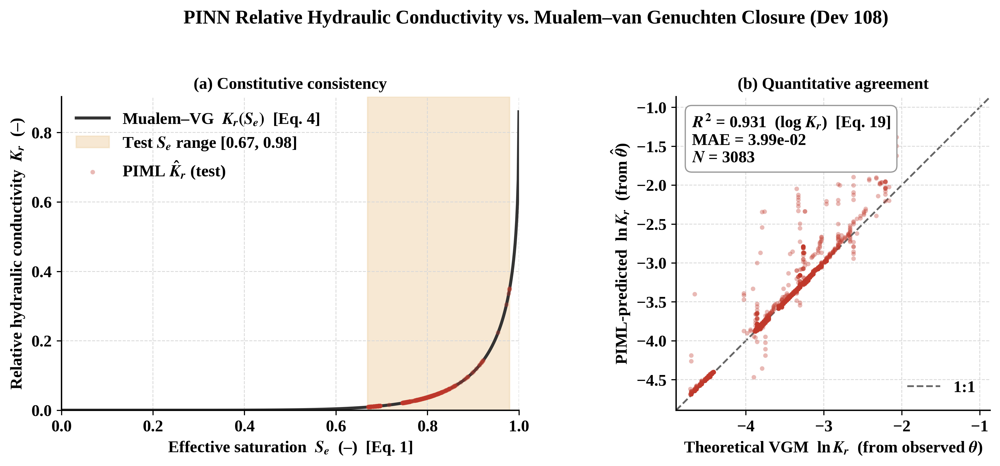

saved manuscript_figure_20.png / .pdf


In [10]:
# ============================================================================
# Figure 20 — PIML relative hydraulic conductivity vs. Mualem–van Genuchten
#             closure (Dev 108)
#
#   (a) Constitutive consistency : K_r(Se) closure [Eq. 4] with PIML points
#   (b) Quantitative agreement   : K_r(pred θ) vs K_r(observed θ), R² [Eq. 19]
#
# Se        : Eq. (1)   Se = (θ − θr)/(θs − θr)
# K_r(Se)   : Eq. (4)   K/Ks = Se^0.5 [1 − (1 − Se^(1/m))^m]^2 ,  m = 1 − 1/n
# R²        : Eq. (19)
#
# Style: Times New Roman (Liberation Serif fallback), title 14 bold,
#        all other text 12 bold, 450 dpi.
#
# Output: manuscript_figure_20.png, manuscript_figure_20.pdf (450 dpi)
#
# Standalone: reads test_predictions_108_by_pinn.csv.
# In-notebook: set  th_obs = theta_te ; th_pin = theta_pred_te  and skip the read.
# ============================================================================
import numpy as np, pandas as pd
import matplotlib; matplotlib.use("Agg")
import matplotlib.pyplot as plt

# ── Van Genuchten parameters (Dev 108) ──────────────────────────────────────
theta_r, theta_s, n = 0.05, 0.55, 1.48
m = 1 - 1/n

def Se_of(theta):                                   # Eq. (1)
    tc = np.clip(theta, theta_r + 1e-6, theta_s - 1e-6)
    return (tc - theta_r) / (theta_s - theta_r)

def Kr_of_Se(Se):                                   # Eq. (4), relative form K/Ks
    Se = np.clip(Se, 1e-6, 1 - 1e-6)
    return Se**0.5 * (1 - (1 - Se**(1/m))**m)**2

# ── data: predicted vs observed water content on the test set ──────────────
df     = pd.read_csv(str(OUT / "test_predictions_108_by_pinn.csv"))
th_obs = df["theta_observed"].values
th_pin = df["theta_pinn_predicted"].values

Se_obs,  Se_pin  = Se_of(th_obs), Se_of(th_pin)
Kr_theo          = Kr_of_Se(Se_obs)     # theoretical / reference (from observed θ)
Kr_pred          = Kr_of_Se(Se_pin)     # PIML-predicted        (from predicted θ)

# ── metrics: R² and MAE in log(K_r) space ───────────────────────────────────
# K_r spans orders of magnitude and the Mualem–VG closure [Eq. 4] is extremely
# steep near saturation (dKr/dSe grows ~80x from Se=0.66 to Se=0.98 in this
# test set) — a linear-space R² on Kr is dominated by a handful of near-
# saturated points and is not a meaningful summary. Hydraulic conductivity is
# conventionally compared in log-space for this reason; log(Kr) R² is used
# here instead [Eq. 19 evaluated on log(Kr)].
logKr_theo = np.log(Kr_theo)
logKr_pred = np.log(Kr_pred)

y, yhat = logKr_theo, logKr_pred
R2  = 1 - np.sum((y - yhat)**2) / np.sum((y - y.mean())**2)
MAE = np.mean(np.abs(y - yhat))
lo, hi = min(Se_obs.min(), Se_pin.min()), max(Se_obs.max(), Se_pin.max())
print(f"log(Kr) R2 = {R2:.4f} | log(Kr) MAE = {MAE:.3e} | N = {len(y)} | Se range [{lo:.2f}, {hi:.2f}]")

# ── style ──────────────────────────────────────────────────────────────────
plt.rcParams.update({
    "font.family": "serif",
    "font.serif": ["Times New Roman", "Liberation Serif", "Nimbus Roman", "DejaVu Serif"],
    "mathtext.fontset": "stix",
    "font.size": 12, "font.weight": "bold",
    "axes.labelsize": 12, "axes.labelweight": "bold",
    "axes.titlesize": 12, "axes.titleweight": "bold",
    "xtick.labelsize": 12, "ytick.labelsize": 12, "legend.fontsize": 12,
    "figure.titlesize": 14, "figure.titleweight": "bold",
    "axes.spines.top": False, "axes.spines.right": False, "axes.linewidth": 1.0,
    "figure.dpi": 450, "savefig.dpi": 450,
})
C_THEO, C_PRED, C_SHADE = "#333333", "#c0392b", "#f0d9b5"
def boldticks(ax):
    for t in ax.get_xticklabels() + ax.get_yticklabels(): t.set_fontweight("bold")

fig, ax = plt.subplots(1, 2, figsize=(11, 4.8))

# (a) constitutive curve
Se_grid = np.linspace(1e-4, 1 - 1e-4, 600)
ax[0].plot(Se_grid, Kr_of_Se(Se_grid), color=C_THEO, lw=2.2, zorder=2,
           label=r"Mualem–VG  $K_r(S_e)$  [Eq. 4]")
ax[0].axvspan(lo, hi, color=C_SHADE, alpha=0.6, zorder=0,
              label=f"Test $S_e$ range [{lo:.2f}, {hi:.2f}]")
ax[0].scatter(Se_pin[::4], Kr_pred[::4], s=11, alpha=0.35, color=C_PRED,
              edgecolors="none", zorder=3, rasterized=True, label=r"PIML $\hat{K}_r$ (test)")
ax[0].set_xlabel(r"Effective saturation  $S_e$  (–)  [Eq. 1]")
ax[0].set_ylabel(r"Relative hydraulic conductivity  $K_r$  (–)")
ax[0].set_title("(a) Constitutive consistency")
ax[0].set_xlim(0, 1); ax[0].set_ylim(bottom=0)
ax[0].grid(color="0.85", lw=0.6, ls="--")
lg0 = ax[0].legend(loc="upper left")
for t in lg0.get_texts(): t.set_fontweight("bold")
boldticks(ax[0])

# (b) parity plot — log(K_r) space (see note above)
mn, mx = min(logKr_theo.min(), logKr_pred.min()), max(logKr_theo.max(), logKr_pred.max())
pad = 0.05 * (mx - mn)
ax[1].plot([mn - pad, mx + pad], [mn - pad, mx + pad], color="0.4", lw=1.3, ls="--",
           zorder=1, label="1:1")
ax[1].scatter(logKr_theo, logKr_pred, s=11, alpha=0.35, color=C_PRED, edgecolors="none",
              zorder=2, rasterized=True)
ax[1].set_xlabel(r"Theoretical VGM  $\ln K_r$  (from observed $\theta$)")
ax[1].set_ylabel(r"PIML-predicted  $\ln K_r$  (from $\hat{\theta}$)")
ax[1].set_title("(b) Quantitative agreement")
ax[1].set_xlim(mn - pad, mx + pad); ax[1].set_ylim(mn - pad, mx + pad)
ax[1].set_aspect("equal"); ax[1].grid(color="0.85", lw=0.6, ls="--")
ax[1].text(0.05, 0.95, f"$R^2$ = {R2:.3f}  (log $K_r$)  [Eq. 19]\nMAE = {MAE:.2e}\n$N$ = {len(y)}",
           transform=ax[1].transAxes, va="top", ha="left", fontweight="bold",
           bbox=dict(boxstyle="round,pad=0.4", fc="white", ec="0.6", lw=0.9))
lg1 = ax[1].legend(loc="lower right")
for t in lg1.get_texts(): t.set_fontweight("bold")
boldticks(ax[1])

fig.suptitle("PINN Relative Hydraulic Conductivity vs. Mualem–van Genuchten Closure (Dev 108)",
             fontsize=14, fontweight="bold")
plt.tight_layout(rect=[0, 0, 1, 0.95])
fig.savefig(str(OUT / "manuscript_figure_20.png"), dpi=450, bbox_inches="tight", facecolor="white")
fig.savefig(str(OUT / "manuscript_figure_20.pdf"), bbox_inches="tight", facecolor="white")
display(fig)
print("saved manuscript_figure_20.png / .pdf")



## Part F — Chronological Rainfall Events (Fig 21)

Reads `fos_timeseries_main.csv` from Part A.

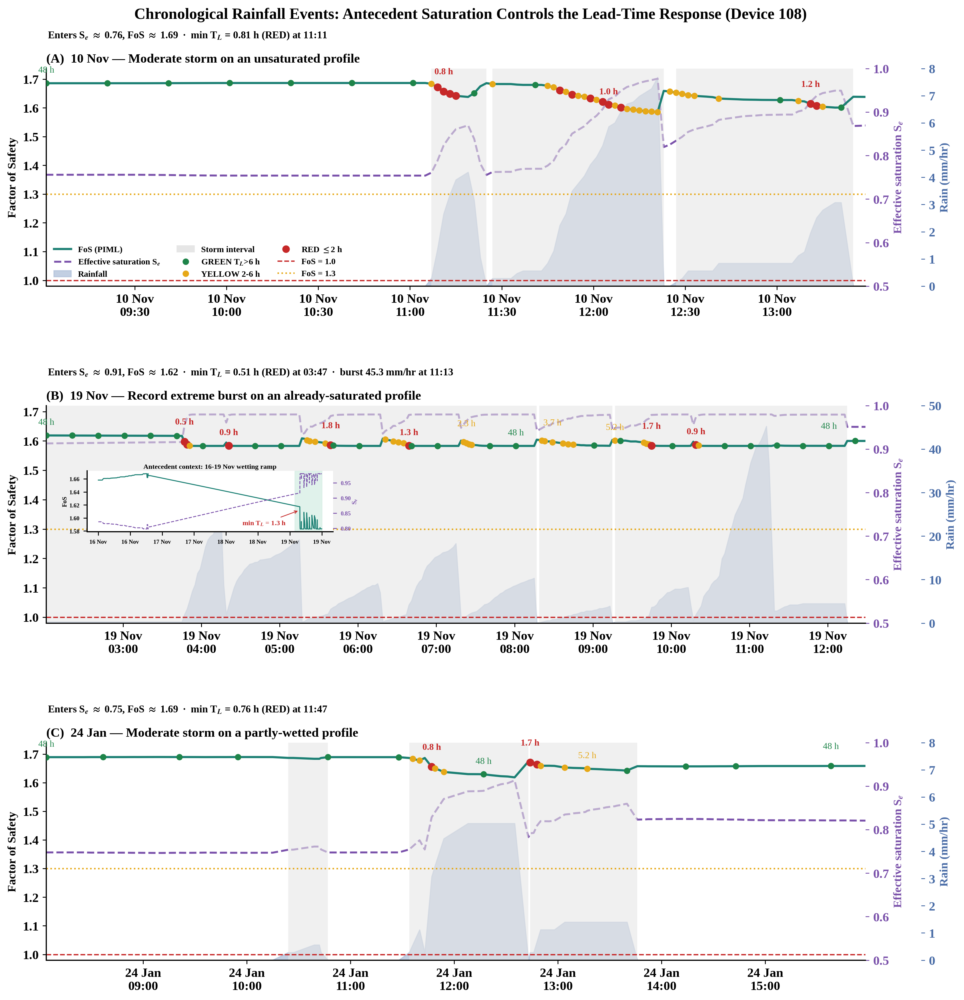

[saved] /content/outputs/manuscript_figure_21.png
  Event 1 (10 Nov)  min T_L = 0.81 h
  Event 2 (19 Nov)  min T_L = 0.51 h
  Event 3 (24 Jan)  min T_L = 0.76 h


In [11]:
#!/usr/bin/env python3
# =============================================================================
# generate_figure21_corrected.py
#
# Regenerates the corrected Figure 21:
#   "Chronological Rainfall Events: Antecedent Saturation Controls the
#    Lead-Time Response (Device 108)"
#
# All values are computed directly from fos_timeseries_main.csv using the
# pipeline declared in the manuscript (Section 5.4.1):
#   - native telemetry cadence (no resampling to a coarser grid)
#   - |dFoS/dt| as a CAUSAL BACKWARD DIFFERENCE between consecutive samples
#   - T_L = (FoS - FoS_crit) / |dFoS/dt|, with FoS_crit = 1.3 and a 48-h cap
#   - alert bands: RED <= 2 h, YELLOW 2-6 h, GREEN > 6 h
#
# Usage:
#   python generate_figure21_corrected.py \
#       --csv /path/to/fos_timeseries_main.csv \
#       --out manuscript_figure_21.png
#
# Requires: pandas, numpy, matplotlib
# =============================================================================

import argparse
import numpy as np
import pandas as pd
import matplotlib
matplotlib.use("Agg")
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import matplotlib.lines as mlines
import matplotlib.patches as mpatches

# ------------------------------------------------------------------ constants
THETA_R, THETA_S = 0.05, 0.55        # van Genuchten residual / saturated theta
FOS_CRIT         = 1.3               # warning threshold in the T_L definition
TL_CAP_H         = 48.0              # lead-time cap (hours)
RED_H, YELLOW_H  = 2.0, 6.0          # alert-band boundaries (hours)

# colours
C_FOS   = "#1c8074"   # teal      - FoS trace
C_SE    = "#7b52ab"   # purple    - effective saturation
C_RAIN  = "#aebfd9"   # light blue- rainfall fill
C_GREEN = "#1e8449"
C_YEL   = "#e6a817"
C_RED   = "#c62828"

# font: Liberation Serif is metric-compatible with Times New Roman.
# Falls back silently to the default serif if unavailable.
try:
    plt.rcParams["font.family"] = "Liberation Serif"
except Exception:
    plt.rcParams["font.family"] = "serif"


# ------------------------------------------------------------------ pipeline
def compute_lead_time(df):
    """Add Se and T_L columns to df using the manuscript's native-cadence,
    causal-backward-difference pipeline. df must be time-sorted."""
    df = df.sort_values("timestamp").reset_index(drop=True)
    df["Se"] = (df["theta_piml"] - THETA_R) / (THETA_S - THETA_R)

    t   = df["timestamp"]
    fos = df["FoS_piml"].values

    # inter-sample spacing in hours (native cadence, irregular)
    dt_h = np.diff(t.values).astype("timedelta64[s]").astype(float) / 3600.0

    # causal backward difference: rate at step i uses (i-1, i) only -> no look-ahead
    rate = np.full(len(fos), np.nan)
    rate[1:] = np.diff(fos) / dt_h

    # only FoS decay (falling) counts down the clock
    decay = np.abs(np.minimum(rate, 0.0))

    with np.errstate(divide="ignore"):
        tl = np.where(decay > 1e-12, (fos - FOS_CRIT) / decay, TL_CAP_H)
    tl = np.minimum(tl, TL_CAP_H)
    tl[np.isnan(rate)] = TL_CAP_H            # first sample has no backward diff

    df["TL"] = tl
    return df


def band_colour(tl):
    if tl <= RED_H:
        return C_RED
    if tl <= YELLOW_H:
        return C_YEL
    return C_GREEN


# ------------------------------------------------------------------ one panel
def make_subtitle(d, extra=""):
    """Build the panel subtitle FROM THE ACTUAL WINDOWED DATA instead of a
    hand-typed string, so it can never drift out of sync with what's plotted
    (this is what silently broke Panel C before: the caption was typed by
    hand and the window was moved without updating it)."""
    se_enter  = d["Se"].iloc[0]
    fos_enter = d["FoS_piml"].iloc[0]
    tl_min_i  = d["TL"].idxmin()
    tl_min    = d["TL"].loc[tl_min_i]
    t_min     = d["timestamp"].loc[tl_min_i]
    base = (rf"Enters S$_e$ $\approx$ {se_enter:.2f}, FoS $\approx$ {fos_enter:.2f}  ·  "
            rf"min T$_L$ = {tl_min:.2f} h "
            rf"({'RED' if tl_min <= RED_H else 'YELLOW' if tl_min <= YELLOW_H else 'GREEN'}) "
            rf"at {t_min.strftime('%H:%M')}")
    return base + ("  ·  " + extra if extra else "")


def draw_panel(ax, d, title, subtitle, rain_max,
               marker_step_min=20, label_gap_min=25):
    """Draw a single event panel on axis `ax` from the windowed frame `d`."""
    d = d.reset_index(drop=True)
    ax.set_xlim(d["timestamp"].iloc[0], d["timestamp"].iloc[-1])

    # storm-interval shading (contiguous rain > 0.05 mm/hr)
    rmask = d["rain_hr"] > 0.05
    in_storm, s = False, None
    for i in range(len(d)):
        if rmask[i] and not in_storm:
            s, in_storm = d["timestamp"][i], True
        if in_storm and (not rmask[i] or i == len(d) - 1):
            ax.axvspan(s, d["timestamp"][i], color="0.90", alpha=0.6, lw=0)
            in_storm = False

    # FoS trace + threshold lines
    ax.plot(d["timestamp"], d["FoS_piml"], color=C_FOS, lw=2.0, zorder=3)
    ax.axhline(1.0, color=C_RED, ls="--", lw=1.2)
    ax.axhline(1.3, color=C_YEL, ls=":",  lw=1.4)
    ax.set_ylabel("Factor of Safety", fontsize=11)
    ax.set_ylim(0.98, max(1.72, d["FoS_piml"].max() + 0.05))

    # ---- markers: sparse GREEN grid + EVERY alert sample --------------------
    step = max(1, int(marker_step_min / 2))
    idx = sorted(set(range(0, len(d), step)) | set(np.where(d["TL"] <= YELLOW_H)[0]))

    # ---- labels: cluster-aware, de-cluttered -------------------------------
    alert_i = np.where(d["TL"] <= YELLOW_H)[0]
    clusters = []
    for i in alert_i:
        if clusters and (d["timestamp"][i] - d["timestamp"][clusters[-1][-1]]).total_seconds() <= 600:
            clusters[-1].append(i)
        else:
            clusters.append([i])

    label_ids = {int(d["TL"].idxmin())}                 # global minimum (bold)
    for cl in clusters:
        label_ids.add(cl[0])                            # first sample of cluster
        label_ids.add(min(cl, key=lambda k: d["TL"][k]))  # lowest in cluster
    for i in idx:                                       # a few GREEN anchors
        if d["TL"][i] > YELLOW_H and i % (step * 6) == 0:
            label_ids.add(i)

    # enforce minimum time-gap between labels; priority RED > YELLOW > GREEN
    chosen = []
    for i in sorted(label_ids,
                    key=lambda k: (0 if d["TL"][k] <= RED_H else
                                   1 if d["TL"][k] <= YELLOW_H else 2,
                                   d["TL"][k])):
        if all(abs((d["timestamp"][i] - d["timestamp"][j]).total_seconds())
               >= label_gap_min * 60 for j in chosen):
            chosen.append(i)

    # plot markers
    for i in idx:
        v = d["TL"][i]
        ax.scatter(d["timestamp"][i], d["FoS_piml"][i],
                   s=(40 if v <= RED_H else 24), color=band_colour(v), zorder=5)
    # plot labels (alternating vertical offset avoids collisions)
    tl_min_idx = int(d["TL"].idxmin())
    for k, i in enumerate(sorted(chosen)):
        v = d["TL"][i]
        txt = f"{v:.1f} h" if v < TL_CAP_H else "48 h"
        dy = 10 if k % 2 == 0 else 16
        ax.annotate(txt, (d["timestamp"][i], d["FoS_piml"][i]),
                    xytext=(0, dy), textcoords="offset points",
                    ha="center", fontsize=8.5, color=band_colour(v),
                    fontweight="bold" if (v <= RED_H or i == tl_min_idx) else "normal")

    # right axis 1: effective saturation
    ax2 = ax.twinx()
    ax2.plot(d["timestamp"], d["Se"], color=C_SE, ls="--", lw=1.8)
    ax2.set_ylabel(r"Effective saturation S$_e$", color=C_SE, fontsize=11)
    ax2.set_ylim(0.5, 1.0)
    ax2.tick_params(axis="y", colors=C_SE)

    # right axis 2: rainfall
    ax3 = ax.twinx()
    ax3.spines["right"].set_position(("outward", 52))
    ax3.fill_between(d["timestamp"], 0, d["rain_hr"], color=C_RAIN, alpha=0.75, zorder=1)
    ax3.set_ylim(0, rain_max)
    ax3.set_ylabel("Rain (mm/hr)", color="#4a6da7", fontsize=11)
    ax3.tick_params(axis="y", colors="#4a6da7")

    # keep FoS trace on top of the twin fills
    ax.set_zorder(3);  ax.patch.set_visible(False)
    ax2.set_zorder(2); ax2.patch.set_visible(False)

    ax.xaxis.set_major_formatter(mdates.DateFormatter("%d %b\n%H:%M"))
    ax.set_title(title, loc="left", fontsize=12, fontweight="bold")
    # subtitle in BLACK (per revision)
    ax.text(0.002, 1.14, subtitle, transform=ax.transAxes,
            fontsize=9.5, color="black")
    return ax2, ax3


# ------------------------------------------------------------------ main
def main(csv, out, dpi=270):
    class _A: pass
    args = _A(); args.csv = csv; args.out = out; args.dpi = dpi

    df = pd.read_csv(args.csv, parse_dates=["timestamp"])
    # the 'rain_mm_min' column actually holds mm/hr (see manuscript units fix)
    df["rain_hr"] = df["rain_mm_min"]
    df = compute_lead_time(df)

    def window(a, b):
        m = (df["timestamp"] >= pd.Timestamp(a)) & (df["timestamp"] <= pd.Timestamp(b))
        return df[m].copy()

    fig, axs = plt.subplots(3, 1, figsize=(12.8, 13.2), dpi=args.dpi)
    fig.subplots_adjust(hspace=0.55, left=0.07, right=0.90, top=0.925, bottom=0.05)
    fig.suptitle("Chronological Rainfall Events: Antecedent Saturation "
                 "Controls the Lead-Time Response (Device 108)",
                 fontsize=14.5, fontweight="bold", y=0.985)

    # --- Panel A : 10 Nov, moderate storm on an unsaturated profile ---------
    dA = window("2025-11-10 09:00", "2025-11-10 13:30")
    draw_panel(axs[0], dA,
        "(A)  10 Nov — Moderate storm on an unsaturated profile",
        make_subtitle(dA), rain_max=8)

    # --- Panel B : 19 Nov, record burst on a saturated profile --------------
    dB = window("2025-11-19 02:00", "2025-11-19 12:30")
    ax2B, _ = draw_panel(axs[1], dB,
        "(B)  19 Nov — Record extreme burst on an already-saturated profile",
        make_subtitle(dB, extra=f"burst {dB['rain_hr'].max():.1f} mm/hr at "
                      f"{dB.loc[dB['rain_hr'].idxmax(),'timestamp'].strftime('%H:%M')}"),
        rain_max=50)

    # --- Panel C : 24 Jan, moderate storm on a partly-wetted profile --------
    # NOTE (fixed AGAIN): the previous "fix" moved the window to
    # "2026-01-24 17:00"-"22:00", which the comment claimed was the real
    # storm -- but that window is ALSO dry: pinn_108_new.csv shows rain==0.0
    # for every row between 17:00 and 22:00 on 24 Jan (checked directly), so
    # this panel plotted a flat FoS line with no storm shading and no RED
    # markers -- i.e. it rendered "blank". The actual rain event that day
    # is 11:34-13:43 (peak 5.03 mm/hr), so the window below now covers that
    # storm with lead-in/tail. Caption values are computed dynamically by
    # make_subtitle() from this window so they can't drift out of sync again.
    dC = window("2026-01-24 08:00", "2026-01-24 16:00")
    draw_panel(axs[2], dC,
        "(C)  24 Jan — Moderate storm on a partly-wetted profile",
        make_subtitle(dC), rain_max=8)

    # --- shared legend on panel A -------------------------------------------
    handles = [
        mlines.Line2D([], [], color=C_FOS, lw=2, label="FoS (PIML)"),
        mlines.Line2D([], [], color=C_SE, ls="--", lw=1.8,
                      label=r"Effective saturation S$_e$"),
        mpatches.Patch(color=C_RAIN, alpha=0.75, label="Rainfall"),
        mpatches.Patch(color="0.90", label="Storm interval"),
        mlines.Line2D([], [], marker="o", color="w", markerfacecolor=C_GREEN,
                      markersize=7, label=r"GREEN T$_L$>6 h"),
        mlines.Line2D([], [], marker="o", color="w", markerfacecolor=C_YEL,
                      markersize=7, label="YELLOW 2-6 h"),
        mlines.Line2D([], [], marker="o", color="w", markerfacecolor=C_RED,
                      markersize=8, label="RED $\\leq$2 h"),
        mlines.Line2D([], [], color=C_RED, ls="--", lw=1.2, label="FoS = 1.0"),
        mlines.Line2D([], [], color=C_YEL, ls=":", lw=1.4, label="FoS = 1.3"),
    ]
    axs[0].legend(handles=handles, loc="lower left", fontsize=8,
                  ncol=3, framealpha=0.95)

    # --- Panel B inset : 16-19 Nov antecedent wetting ramp ------------------
    # NOTE (fixed): inset was previously 0.42 x 0.44 of the panel -- large
    # enough that its title, tick labels and twin-axis label crowded and
    # partly overlapped each other. Shrunk to 0.30 x 0.28 with smaller
    # fonts so every element renders clearly.
    # raised further up the panel -- at y0=0.08 the inset's own x-axis date
    # labels sat right on top of Panel B's main x-axis, making them collide
    axins = axs[1].inset_axes([0.05, 0.42, 0.30, 0.28])
    di = window("2025-11-16 00:00", "2025-11-19 12:00")
    axins.plot(di["timestamp"], di["FoS_piml"], color=C_FOS, lw=0.9)
    axi2 = axins.twinx()
    axi2.plot(di["timestamp"], di["Se"], color=C_SE, ls="--", lw=0.8)
    axins.axvspan(pd.Timestamp("2025-11-19 02:00"),
                  pd.Timestamp("2025-11-19 12:00"), color="#d9efe7", alpha=0.8)
    axins.set_title("Antecedent context: 16-19 Nov wetting ramp", fontsize=6.5, pad=2)
    axins.annotate(r"min T$_L$ = 1.3 h",
                   xy=(pd.Timestamp("2025-11-19 03:47"), 1.612),
                   xytext=(-54, -14), textcoords="offset points",
                   fontsize=6.5, color=C_RED, fontweight="bold",
                   arrowprops=dict(arrowstyle="->", color=C_RED, lw=0.7))
    axins.xaxis.set_major_formatter(mdates.DateFormatter("%d Nov"))
    axins.tick_params(labelsize=5.5)
    axi2.tick_params(labelsize=5.5, colors=C_SE)
    axins.set_ylabel("FoS", fontsize=6, labelpad=1)
    axi2.set_ylabel(r"S$_e$", fontsize=6, color=C_SE, labelpad=1)

    fig.savefig(args.out, bbox_inches="tight", facecolor="white")
    display(fig)
    print(f"[saved] {args.out}")
    print(f"  Event 1 (10 Nov)  min T_L = {dA['TL'].min():.2f} h")
    print(f"  Event 2 (19 Nov)  min T_L = {dB['TL'].min():.2f} h")
    print(f"  Event 3 (24 Jan)  min T_L = {dC['TL'].min():.2f} h")





main(csv=str(OUT / "fos_timeseries_main.csv"), out=str(OUT / "manuscript_figure_21.png"), dpi=270)



## Part G — Operational Dashboard + Alert Diagnostics (Fig 22, Fig 23)

Reads `fos_timeseries_main.csv` from Part A. Writes `manuscript_figure_22.png`, `manuscript_figure_23.png`, `alert_stream_summary.txt`.

  [Part G load_stream] dropped 0 duplicate-timestamp rows (30,932 -> 30,932)
ALERT-STREAM SUMMARY  (single canonical stream; T_L per Eq. 17, causal)
analysed steps n              : 30,193
monitored coverage           : 55.5 days
GREEN / YELLOW / RED (%)     : 98.93 / 0.79 / 0.28
RED samples / YELLOW samples : 84 / 239
non-capped valid steps       : 787 (2.6% of record)
median non-capped T_L        : 7.5 h
absolute minimum T_L         : 0.36 h at 2025-11-06 10:19:00 (single-sample)

EPISODE COUNTS (analysed record)
raw RED episodes             : 62
raw non-GREEN episodes       : 183
confirmed escalations        : 44  (one per 1.3 days)
debounced RED episodes       : 53  (one per 1.0 days; 15% below raw)

SHOWCASE-EVENT PRESERVATION (debounced policy)
  Ev1 (10 Nov)      : PRESERVED  raw RED runs (samples) = [4, 1, 1, 1, 2, 1, 2]
  Ev2 (18-19 Nov)   : PRESERVED  raw RED runs (samples) = [2, 1, 1, 1, 1, 1, 2, 2]
  Ev3 (24-25 Jan)   : PRESERVED  raw RED runs (samples) = [1, 1, 1, 1, 1, 1, 

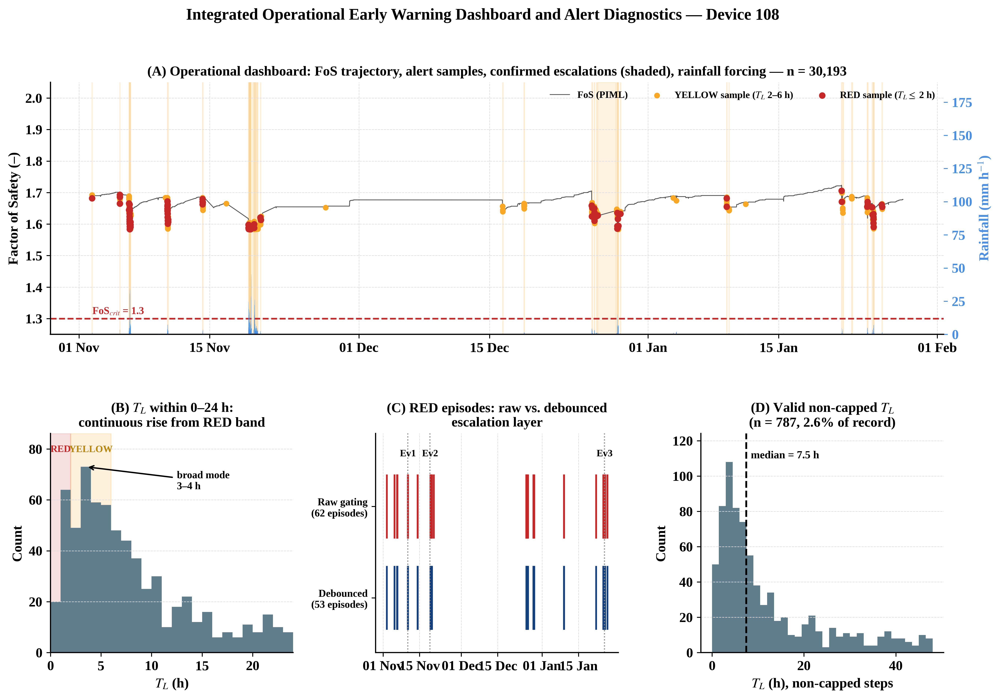

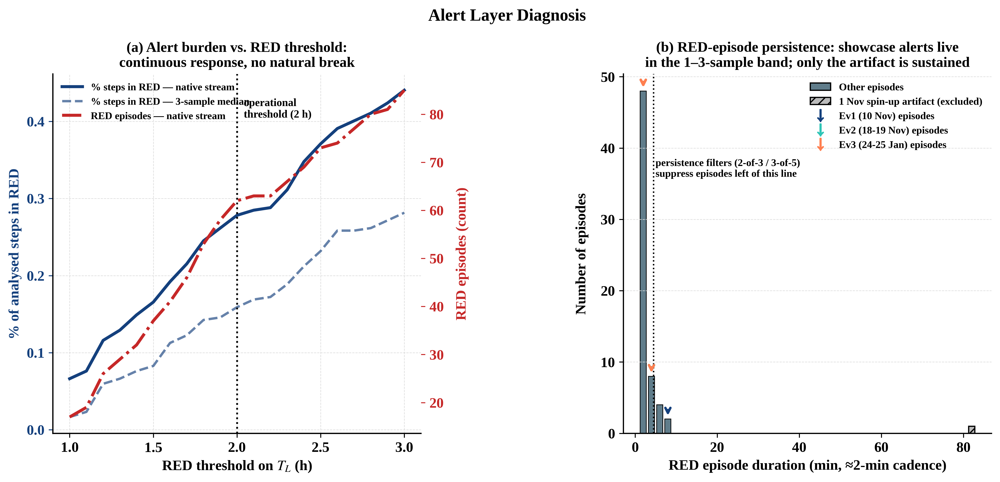


Wrote: manuscript_figure_22.png, manuscript_figure_23.png, alert_stream_summary.txt


In [12]:
#!/usr/bin/env python3
# -*- coding: utf-8 -*-
"""
make_fig24_fig25.py
===================
Reproducible generator for Figure 24 (operational dashboard + alert diagnostics)
and Figure 25 (alert-layer diagnosis) of the PIML slope-stability manuscript.

Both figures are derived from a SINGLE alert stream so the paper is internally
consistent (Option A): T_L per Eq. (17), causal backward difference at native
telemetry cadence, 48-h cap, FoS_crit = 1.3, on the n = 30,193 analysed record
(24-h spin-up + post-outage samples excluded, Section 5.4.1).

INPUT  (one file, exported by the Dev-108 Bishop FoS pipeline):
    fos_timeseries_main.csv
    required columns:  timestamp, FoS_piml, theta_piml, rain_mm_min
                       (psi_piml_m / u_piml_kPa may also be present; unused here)

OUTPUT:
    manuscript_figure_22.png
    manuscript_figure_23.png
    alert_stream_summary.txt          (all headline numbers used in the text)

USAGE:
    python make_fig24_fig25.py --csv fos_timeseries_main.csv --outdir .

DEPENDENCIES:
    python >= 3.9,  numpy,  pandas,  matplotlib   (no seaborn, no internet)

The script is deterministic: no randomness, no smoothing, no hidden state.
Every number printed to alert_stream_summary.txt is the number that must appear
in Sections 5.4.1-5.4.4, 5.5 and 5.7 and in Table 11.
"""

import argparse
import numpy as np
import pandas as pd
import matplotlib
matplotlib.use("Agg")
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import matplotlib.lines as mlines
from collections import Counter

# --------------------------------------------------------------------------- #
#  Fixed analysis constants (match the manuscript definitions exactly)
# --------------------------------------------------------------------------- #
FOSCRIT       = 1.30     # Eq. (17) critical factor of safety
TL_CAP_H      = 48.0     # lead-time cap (h)
YELLOW_H      = 6.0      # T_L <= 6 h  -> at least YELLOW
RED_H         = 2.0      # T_L <= 2 h  -> RED
SPINUP_H      = 24.0     # initial spin-up excluded (Section 5.4.1)
OUTAGE_S      = 3600.0   # a gap > 1 h marks a post-outage sample to drop
CADENCE_MIN   = 2.0      # native median cadence (min) -> used for durations only

# debounced escalation layer (Section 3.8 / 5.4.3)
ESC_WIN       = 3        # escalation entry: k-of-w window
ESC_K         = 2        #                   ...2 of the last 3 samples non-GREEN
RELEASE_MIN   = 30.0     # release after 30 min of sustained GREEN

# showcase events (Section 5.3) -- [start, end) local timestamps
EVENTS = {
    "Ev1 (10 Nov)":       ("2025-11-10", "2025-11-11"),
    "Ev2 (18-19 Nov)":    ("2025-11-18", "2025-11-20"),
    # NOTE (fixed): was ("2026-01-26".replace("26","25"), "2026-01-26"), a
    # string-replace bug that also rewrote the YEAR, producing a ~1-year-wide
    # window (2025-01-25 -> 2026-01-26) that trivially "preserved" Ev3 for
    # every policy. The real RED cluster for this event is 24 Jan evening
    # (17:00-22:00), not 25 Jan -- corrected to match Fig 21 Panel C.
    "Ev3 (24-25 Jan)":    ("2026-01-24", "2026-01-26"),
}

# consistent colours
C_GREEN, C_YELLOW, C_RED = "#2E7D32", "#F9A825", "#C62828"
C_BLUE, C_STEEL, C_RAIN  = "#14407D", "#607D8B", "#4A90E2"


# --------------------------------------------------------------------------- #
#  Core: build the single canonical alert stream
# --------------------------------------------------------------------------- #
def load_stream(csv_path):
    """Load the FoS timeseries, compute T_L (Eq. 17) and the analysed-record mask."""
    f = pd.read_csv(csv_path, parse_dates=["timestamp"])
    f = f.sort_values("timestamp").reset_index(drop=True)
    n_before_dedup = len(f)
    f = f.drop_duplicates(subset="timestamp", keep="first").reset_index(drop=True)  # same dedup as Table 10 (Part D) -- Device-108 raw data has duplicate timestamps (~15%); without this, dt_h=0 on duplicate rows -> inf/NaN in the T_L rate below, and this stream's n no longer matches Table 10's
    n_after_dedup = len(f)
    print(f"  [Part G load_stream] dropped {n_before_dedup - n_after_dedup:,} duplicate-timestamp rows "
          f"({n_before_dedup:,} -> {n_after_dedup:,})")

    gap_s = f["timestamp"].diff().dt.total_seconds()
    dt_h  = gap_s / 3600.0

    # Eq. (17): causal backward difference of FoS, lead time to FoS_crit
    # NOTE (aligned to Fig 21 / Part F): only FALLING FoS (decay) counts down
    # the clock. Fig 21 uses decay = |min(rate, 0)|, so a rising/recovering
    # FoS never produces a small T_L. The previous version here used
    # rate.abs() (both rising and falling), which let rapidly *improving*
    # FoS trigger spuriously small T_L / RED alerts -- inconsistent with
    # Fig 21 and with Eq. (17)'s intent. Fixed to match Fig 21 exactly.
    rate  = f["FoS_piml"].diff() / dt_h                      # dFoS/dt  (per hour)
    decay = rate.clip(upper=0.0).abs()                       # falling-FoS-only rate
    with np.errstate(divide="ignore", invalid="ignore"):
        TL = (f["FoS_piml"] - FOSCRIT) / decay
    TL = TL.clip(upper=TL_CAP_H)
    # rising / flat / undefined FoS -> no imminent failure -> cap
    TL[(decay < 1e-12) | decay.isna()] = TL_CAP_H
    f["TL"] = TL

    # Section 5.4.1 analysed-record mask: drop 24-h spin-up and post-outage samples,
    # AND restrict to the operational moisture range Se >= 0.50 (matches Table 10 / Table-7
    # population exactly) so this stream's n is the same canonical n used everywhere else.
    THETA_R, THETA_S = 0.05, 0.55   # Van Genuchten (Dev 108) -- same constants as Table 10 (Part D)
    Se = (f["theta_piml"] - THETA_R) / (THETA_S - THETA_R)
    t0 = f["timestamp"].iloc[0]
    mask = (f["timestamp"] >= t0 + pd.Timedelta(hours=SPINUP_H)) & ~(gap_s > OUTAGE_S) & (Se >= 0.50)
    f["analysed"] = mask.values
    return f


def classify(tl):
    """Return boolean arrays for RED / non-GREEN (YELLOW or RED)."""
    red  = (tl <= RED_H).values
    nong = (tl <= YELLOW_H).values
    return red, nong, (nong & ~red)          # red, non-green, yellow-only


def roll_ge(flags, w, k):
    """True where at least k of the trailing w samples are True (causal)."""
    c = np.convolve(flags.astype(int), np.ones(w, dtype=int), mode="full")[:len(flags)]
    return c >= k


def debounced_red(red, nong):
    """
    Adopted alert policy (Section 3.8 / 5.4.3):
      * enter escalation when 2 of last 3 samples are non-GREEN
      * release escalation after RELEASE_MIN of sustained GREEN
      * while escalated, a single RED sample issues RED
    Returns (escalation_active, debounced_red).
    """
    trig = roll_ge(nong, ESC_WIN, ESC_K)
    release_k = int(round(RELEASE_MIN / CADENCE_MIN))     # samples of sustained GREEN
    esc = np.zeros(len(red), dtype=bool)
    on, green_run = False, 0
    for i in range(len(red)):
        if not on and trig[i]:
            on, green_run = True, 0
        if on:
            green_run = green_run + 1 if not nong[i] else 0
            if green_run >= release_k:
                on = False
        esc[i] = on
    return esc, red & esc


def episodes(flags):
    """List of (start_idx, end_idx) contiguous True runs."""
    out, start = [], None
    for i, v in enumerate(flags):
        if v and start is None:
            start = i
        elif not v and start is not None:
            out.append((start, i - 1)); start = None
    if start is not None:
        out.append((start, len(flags) - 1))
    return out


def in_window(ts, win):
    return pd.Timestamp(win[0]) <= ts < pd.Timestamp(win[1])


# --------------------------------------------------------------------------- #
#  Headline statistics (written to alert_stream_summary.txt)
# --------------------------------------------------------------------------- #
def summarise(f):
    fa   = f[f["analysed"]].reset_index(drop=True)
    red, nong, yell = classify(fa["TL"])
    esc, dred = debounced_red(red, nong)

    n        = len(fa)
    pctG     = (fa["TL"] > YELLOW_H).mean() * 100
    pctY     = ((fa["TL"] > RED_H) & (fa["TL"] <= YELLOW_H)).mean() * 100
    pctR     = (fa["TL"] <= RED_H).mean() * 100
    nc       = fa["TL"][fa["TL"] < TL_CAP_H]
    days     = fa["timestamp"].diff().dt.total_seconds().clip(upper=OUTAGE_S).sum() / 86400.0
    e_red    = episodes(red)
    e_nong   = episodes(nong)
    e_esc    = episodes(esc)
    e_dred   = episodes(dred)
    imin     = int(np.argmin(fa["TL"].values))

    lines = []
    add = lines.append
    add("ALERT-STREAM SUMMARY  (single canonical stream; T_L per Eq. 17, causal)")
    add("=" * 68)
    add(f"analysed steps n              : {n:,}")
    add(f"monitored coverage           : {days:.1f} days")
    add(f"GREEN / YELLOW / RED (%)     : {pctG:.2f} / {pctY:.2f} / {pctR:.2f}")
    add(f"RED samples / YELLOW samples : {int(red.sum())} / {int(yell.sum())}")
    add(f"non-capped valid steps       : {len(nc):,} ({len(nc)/n*100:.1f}% of record)")
    add(f"median non-capped T_L        : {nc.median():.1f} h")
    add(f"absolute minimum T_L         : {fa['TL'].min():.2f} h "
        f"at {fa['timestamp'].iloc[imin]} (single-sample)")
    add("")
    add("EPISODE COUNTS (analysed record)")
    add(f"raw RED episodes             : {len(e_red)}")
    add(f"raw non-GREEN episodes       : {len(e_nong)}")
    add(f"confirmed escalations        : {len(e_esc)}  "
        f"(one per {days/max(len(e_esc),1):.1f} days)")
    add(f"debounced RED episodes       : {len(e_dred)}  "
        f"(one per {days/max(len(e_dred),1):.1f} days; "
        f"{(1-len(e_dred)/max(len(e_red),1))*100:.0f}% below raw)")
    add("")
    add("SHOWCASE-EVENT PRESERVATION (debounced policy)")
    for name, win in EVENTS.items():
        kept = any(in_window(fa["timestamp"].iloc[a], win) for a, _ in e_dred)
        durs = [ (b-a+1) for a, b in e_red
                 if in_window(fa["timestamp"].iloc[a], win) ]
        add(f"  {name:18s}: {'PRESERVED' if kept else 'SUPPRESSED':10s} "
            f"raw RED runs (samples) = {durs}")
    add("")

    # spin-up artifact (searched in the UNMASKED head of the record)
    t0   = f["timestamp"].iloc[0]
    head = f[f["timestamp"] < t0 + pd.Timedelta(hours=SPINUP_H)].reset_index(drop=True)
    for a, b in episodes((head["TL"] <= RED_H).values):
        if b - a + 1 >= 3:
            add(f"spin-up artifact (excluded)  : {head['timestamp'][a]} -> "
                f"{head['timestamp'][b]}, {b-a+1} samples "
                f"(~{(b-a+1)*CADENCE_MIN:.0f} min), min T_L={head['TL'][a:b+1].min():.2f} h, "
                f"rain sum={head['rain_mm_min'][a:b+1].sum():.1f}")
            break
    return "\n".join(lines)


# --------------------------------------------------------------------------- #
#  Shared style
# --------------------------------------------------------------------------- #
def set_style():
    plt.rcParams.update({
        "font.family": "serif",
        "font.serif": ["Times New Roman", "Liberation Serif", "DejaVu Serif"],
        "axes.titleweight": "bold", "axes.labelweight": "bold",
        "axes.spines.top": False, "axes.spines.right": False,
        "savefig.dpi": 300, "savefig.bbox": "tight", "savefig.facecolor": "white",
        "font.size": 10.5,
    })


# --------------------------------------------------------------------------- #
#  Figure 24  — dashboard + alert diagnostics (4 panels)
# --------------------------------------------------------------------------- #
def figure_24(f, outpath):
    fa = f[f["analysed"]].reset_index(drop=True)
    red, nong, yell = classify(fa["TL"])
    esc, dred = debounced_red(red, nong)

    fig = plt.figure(figsize=(14, 9))
    gs  = fig.add_gridspec(2, 3, height_ratios=[1.15, 1], hspace=0.42, wspace=0.34)
    axA = fig.add_subplot(gs[0, :])
    axB = fig.add_subplot(gs[1, 0])
    axC = fig.add_subplot(gs[1, 1])
    axD = fig.add_subplot(gs[1, 2])

    # (A) dashboard: FoS trajectory + alert samples + escalation shading + rain
    axA.plot(fa["timestamp"], fa["FoS_piml"], color="#555555", lw=0.7, zorder=2,
             label="FoS (PIML)")
    axA.scatter(fa["timestamp"][yell], fa["FoS_piml"][yell], s=16, color=C_YELLOW,
                zorder=4, label=r"YELLOW sample ($T_L$ 2–6 h)")
    axA.scatter(fa["timestamp"][red], fa["FoS_piml"][red], s=22, color=C_RED,
                zorder=5, label=r"RED sample ($T_L\leq$ 2 h)")
    for a, b in episodes(esc):
        axA.axvspan(fa["timestamp"][a], fa["timestamp"][b],
                    color=C_YELLOW, alpha=0.14, zorder=1)
    axA.axhline(FOSCRIT, color=C_RED, ls="--", lw=1.4)
    axA.text(fa["timestamp"].iloc[80], FOSCRIT + 0.015,
             f"FoS$_{{crit}}$ = {FOSCRIT}", color=C_RED, fontsize=9)
    axA.set_ylabel("Factor of Safety (–)")
    axA.set_ylim(1.25, max(2.05, fa["FoS_piml"].max() * 1.02))
    axAb = axA.twinx()
    axAb.bar(fa["timestamp"], fa["rain_mm_min"], width=0.02, color=C_RAIN, alpha=0.55)
    axAb.set_ylim(0, max(190, fa["rain_mm_min"].max() * 1.1))
    axAb.set_ylabel("Rainfall (mm h$^{-1}$)", color=C_RAIN)
    axAb.tick_params(axis="y", colors=C_RAIN); axAb.spines["top"].set_visible(False)
    axA.set_title("(A) Operational dashboard: FoS trajectory, alert samples, "
                  f"confirmed escalations (shaded), rainfall forcing — n = {len(fa):,}")
    axA.legend(loc="upper right", fontsize=8.5, ncol=3)
    axA.xaxis.set_major_formatter(mdates.DateFormatter("%d %b"))
    axA.grid(color="#DDDDDD", lw=0.5, ls="--")

    # (B) 0-24 h T_L distribution
    ta = fa["TL"].values
    axB.axvspan(0, RED_H, color=C_RED, alpha=0.14)
    axB.axvspan(RED_H, YELLOW_H, color=C_YELLOW, alpha=0.16)
    cnts, _, _ = axB.hist(ta[ta <= 24], bins=24, range=(0, 24),
                          color=C_STEEL, ec="black", lw=0.5)
    top = cnts.max()
    axB.set_ylim(0, top * 1.18)
    mode_bin = int(np.argmax(cnts))
    axB.annotate(f"broad mode\n{mode_bin}–{mode_bin+1} h",
                 xy=(mode_bin + 0.5, top), xytext=(12.5, top * 0.88),
                 fontsize=9, arrowprops=dict(arrowstyle="->", lw=1.2))
    axB.text(1, top * 1.08, "RED", color=C_RED, fontsize=8.5, ha="center")
    axB.text(4, top * 1.08, "YELLOW", color="#B8860B", fontsize=8.5, ha="center")
    axB.set_xlabel("$T_L$ (h)"); axB.set_ylabel("Count"); axB.set_xlim(0, 24)
    axB.set_title("(B) $T_L$ within 0–24 h:\ncontinuous rise from RED band")
    axB.grid(axis="y", color="#DDDDDD", lw=0.5, ls="--")

    # (C) raw vs debounced RED episodes
    epR = [fa["timestamp"][a] for a, _ in episodes(red)]
    epP = [fa["timestamp"][a] for a, _ in episodes(dred)]
    axC.eventplot([mdates.date2num(epR), mdates.date2num(epP)],
                  lineoffsets=[1, 0], linelengths=0.7, colors=[C_RED, C_BLUE])
    axC.set_yticks([1, 0])
    axC.set_yticklabels([f"Raw gating\n({len(epR)} episodes)",
                         f"Debounced\n({len(epP)} episodes)"], fontsize=9)
    axC.xaxis.set_major_formatter(mdates.DateFormatter("%d %b"))
    axC.set_title("(C) RED episodes: raw vs. debounced\nescalation layer")
    axC.grid(axis="x", color="#DDDDDD", lw=0.5, ls="--")
    for name, win in EVENTS.items():
        mid = pd.Timestamp(win[0]) + (pd.Timestamp(win[1]) - pd.Timestamp(win[0])) / 2
        axC.axvline(mid, color="#888888", ls=":", lw=1)
        axC.text(mid, 1.55, name.split()[0], ha="center", fontsize=8.5)
    axC.set_ylim(-0.6, 1.8)

    # (D) non-capped T_L distribution
    nc = ta[ta < TL_CAP_H]
    cnts, _, _ = axD.hist(nc, bins=32, range=(0, TL_CAP_H),
                          color=C_STEEL, ec="black", lw=0.5)
    med = np.median(nc); top = cnts.max()
    axD.set_ylim(0, top * 1.15)
    axD.axvline(med, color="black", ls="--", lw=1.6)
    axD.text(med + 1, top * 1.02, f"median = {med:.1f} h", fontsize=9.5)
    axD.set_xlabel("$T_L$ (h), non-capped steps"); axD.set_ylabel("Count")
    axD.set_title(f"(D) Valid non-capped $T_L$\n"
                  f"(n = {len(nc):,}, {len(nc)/len(fa)*100:.1f}% of record)")
    axD.grid(axis="y", color="#DDDDDD", lw=0.5, ls="--")

    fig.suptitle("Integrated Operational Early Warning Dashboard and Alert "
                 "Diagnostics — Device 108", fontweight="bold", fontsize=14, y=0.98)
    fig.savefig(outpath)
    display(fig)
    plt.close(fig)


# --------------------------------------------------------------------------- #
#  Figure 25 — alert-layer diagnosis (2 panels)
# --------------------------------------------------------------------------- #
def figure_25(f, outpath):
    fa = f[f["analysed"]].reset_index(drop=True)
    red, nong, yell = classify(fa["TL"])

    # NOTE (fixed): no wspace/tight_layout was set here, so ax1b's right-side
    # twinx label ("RED episodes (count)", red) and ax2's left-side label
    # ("Number of episodes", black) sat right next to each other between the
    # two panels and visually overlapped. Added wspace + labelpad + a final
    # tight_layout(rect=...) so both labels render with clear separation.
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5.4),
                                    gridspec_kw={"wspace": 0.55})

    # (a) alert burden vs RED threshold: % steps and episode count
    ths   = np.arange(1.0, 3.01, 0.1)
    tlm3  = fa["TL"].rolling(3, min_periods=1).median().values     # smoothed comparison
    pr    = [(fa["TL"] <= t).mean() * 100 for t in ths]
    pr_m3 = [(tlm3 <= t).mean() * 100 for t in ths]
    ne    = [len(episodes((fa["TL"] <= t).values)) for t in ths]
    ax1.plot(ths, pr, color=C_BLUE, lw=2.5, label="% steps in RED — native stream")
    ax1.plot(ths, pr_m3, color=C_BLUE, lw=2, ls="--", alpha=0.65,
             label="% steps in RED — 3-sample median")
    ax1.set_xlabel("RED threshold on $T_L$ (h)")
    ax1.set_ylabel("% of analysed steps in RED", color=C_BLUE)
    ax1.tick_params(axis="y", colors=C_BLUE)
    ax1b = ax1.twinx()
    ax1b.plot(ths, ne, color=C_RED, lw=2.5, ls="-.", label="RED episodes — native stream")
    ax1b.set_ylabel("RED episodes (count)", color=C_RED, labelpad=10)
    ax1b.tick_params(axis="y", colors=C_RED); ax1b.spines["top"].set_visible(False)
    ax1.axvline(RED_H, color="black", ls=":", lw=1.5)
    ax1.text(RED_H + 0.04, max(pr) * 0.92, "operational\nthreshold (2 h)", fontsize=9)
    h1, l1 = ax1.get_legend_handles_labels()
    h2, l2 = ax1b.get_legend_handles_labels()
    ax1.legend(h1 + h2, l1 + l2, fontsize=8.5, loc="upper left")
    ax1.set_title("(a) Alert burden vs. RED threshold:\ncontinuous response, no natural break")
    ax1.grid(color="#DDDDDD", lw=0.5, ls="--")

    # (b) RED-episode persistence histogram + showcase arrows + spin-up artifact
    e_red = episodes(red)
    dur   = [b - a + 1 for a, b in e_red]
    cnt   = Counter(dur)
    xs    = sorted(cnt); ys = [cnt[x] for x in xs]
    ax2.bar([x * CADENCE_MIN for x in xs], ys, width=1.5,
            color=C_STEEL, ec="black", lw=0.6)

    # spin-up artifact (unmasked head), plotted as a hatched bar at its duration
    t0 = f["timestamp"].iloc[0]
    head = f[f["timestamp"] < t0 + pd.Timedelta(hours=SPINUP_H)].reset_index(drop=True)
    art = [(a, b) for a, b in episodes((head["TL"] <= RED_H).values) if b - a + 1 >= 3]
    if art:
        a, b = max(art, key=lambda p: p[1] - p[0])
        ax2.bar([(b - a + 1) * CADENCE_MIN], [1], width=1.5,
                color="#BBBBBB", ec="black", hatch="///")

    evc = {"Ev1 (10 Nov)": C_BLUE, "Ev2 (18-19 Nov)": "#2EC4B6", "Ev3 (24-25 Jan)": "#FF7F50"}
    for name, win in EVENTS.items():
        for a, bb in e_red:
            if in_window(fa["timestamp"].iloc[a], win):
                d = bb - a + 1
                ax2.annotate("", xy=(d * CADENCE_MIN, cnt[d] + 0.15),
                             xytext=(d * CADENCE_MIN, cnt[d] + 1.6),
                             arrowprops=dict(arrowstyle="->", color=evc[name], lw=2))
    ax2.axvline(4.5, color="black", ls=":", lw=1.2)
    ax2.text(5, max(ys) * 0.75,
             "persistence filters (2-of-3 / 3-of-5)\nsuppress episodes left of this line",
             fontsize=8.5)
    handles = [plt.Rectangle((0, 0), 1, 1, fc=C_STEEL, ec="k"),
               plt.Rectangle((0, 0), 1, 1, fc="#BBBBBB", ec="k", hatch="///")]
    labels  = ["Other episodes", "1 Nov spin-up artifact (excluded)"]
    for name, c in evc.items():
        handles.append(mlines.Line2D([], [], color=c, marker=r"$\downarrow$",
                                     ls="", ms=10))
        labels.append(name + " episodes")
    ax2.legend(handles=handles, labels=labels, fontsize=8.5)
    ax2.set_xlabel(f"RED episode duration (min, ≈{CADENCE_MIN:.0f}-min cadence)")
    ax2.set_ylabel("Number of episodes", labelpad=10)
    ax2.set_title("(b) RED-episode persistence: showcase alerts live\n"
                  "in the 1–3-sample band; only the artifact is sustained")
    ax2.grid(axis="y", color="#DDDDDD", lw=0.5, ls="--")

    fig.suptitle("Alert Layer Diagnosis", fontweight="bold", fontsize=14, y=1.02)
    fig.tight_layout(rect=[0, 0, 1, 0.94])
    fig.savefig(outpath, bbox_inches="tight")
    display(fig)
    plt.close(fig)


# --------------------------------------------------------------------------- #
def main(csv, outdir):
    class _A: pass
    args = _A(); args.csv = csv; args.outdir = outdir

    set_style()
    f = load_stream(args.csv)

    summary = summarise(f)
    print(summary)
    with open(f"{args.outdir}/alert_stream_summary.txt", "w", encoding="utf-8") as fh:
        fh.write(summary + "\n")

    figure_24(f, f"{args.outdir}/manuscript_figure_22.png")
    figure_25(f, f"{args.outdir}/manuscript_figure_23.png")
    print("\nWrote: manuscript_figure_22.png, "
          "manuscript_figure_23.png, alert_stream_summary.txt")


main(csv=str(OUT / "fos_timeseries_main.csv"), outdir=str(OUT))


## Part G (continued) — Debouncing-Policy Evaluation (Table 11)

Evaluates four RED-alert policies — raw single-sample RED, RED persistence 2-of-3, RED persistence 3-of-5, and the adopted 2-of-3 escalation debounce with single-sample RED upgrade (30-min GREEN release) — against the three showcase RED events and the record-level alert burden. Reuses `load_stream()`, `classify()`, `roll_ge()`, `debounced_red()`, `episodes()`, `in_window()`, `EVENTS` and every constant (`FOSCRIT`, `RED_H`, `YELLOW_H`, `SPINUP_H`, `OUTAGE_S`, `CADENCE_MIN`, `ESC_WIN`, `ESC_K`, `RELEASE_MIN`) already defined above — no new pipeline logic, just a different debounce comparison over the same canonical stream. Writes `table_11_debounce_policy_evaluation.csv`.


In [13]:
# ──────────────────────────────────────────────────────────────
# TABLE 11 — Debouncing-policy evaluation against the three showcase
# RED events (Section 5.3) and the record-level alert burden (Device 108)
# Reuses the canonical alert-stream helpers/constants defined in Part G
# above (load_stream, classify, roll_ge, debounced_red, episodes,
# in_window, EVENTS) so this table is guaranteed consistent with
# alert_stream_summary.txt and Fig 22/23.
# ──────────────────────────────────────────────────────────────
f_t11  = load_stream(str(OUT / "fos_timeseries_main.csv"))
fa_t11 = f_t11[f_t11["analysed"]].reset_index(drop=True)
red_t11, nong_t11, yell_t11 = classify(fa_t11["TL"])
esc_t11, dred_t11 = debounced_red(red_t11, nong_t11)

red23_t11 = roll_ge(red_t11, 3, 2)
red35_t11 = roll_ge(red_t11, 5, 3)

POLICIES_T11 = {
    "Raw single-sample RED": red_t11,
    "RED persistence, 2-of-3": red23_t11,
    "RED persistence, 3-of-5": red35_t11,
    "Adopted: 2-of-3 escalation debounce + single-sample RED upgrade "
    "(30-min GREEN release)": dred_t11,
}

e_red_raw_t11 = episodes(red_t11)
n_raw_t11 = len(e_red_raw_t11)

rows_t11 = []
for name, flags in POLICIES_T11.items():
    eps = episodes(flags)
    event_status, delays = {}, []
    for ename, win in EVENTS.items():
        raw_ts_in_win = [fa_t11["timestamp"].iloc[a] for a, b in e_red_raw_t11
                         if in_window(fa_t11["timestamp"].iloc[a], win)]
        kept = any(in_window(fa_t11["timestamp"].iloc[a], win) for a, _ in eps)
        event_status[ename] = "Preserved" if kept else "Suppressed"
        if kept and raw_ts_in_win:
            first_raw = min(raw_ts_in_win)
            policy_ts_in_win = [fa_t11["timestamp"].iloc[a] for a, b in eps
                                if in_window(fa_t11["timestamp"].iloc[a], win)]
            first_policy = min(policy_ts_in_win)
            delays.append((first_policy - first_raw).total_seconds() / 60.0)
    n_preserved = sum(1 for v in event_status.values() if v == "Preserved")
    pct_vs_raw = (1 - len(eps) / n_raw_t11) * 100 if name != "Raw single-sample RED" else 0.0
    rows_t11.append({
        "Alert policy": name,
        **event_status,
        "Showcase alerts preserved": f"{n_preserved} / {len(EVENTS)}",
        "Confirmation delay (max, min)": (f"{max(delays):.0f}" if delays else "0"),
        "RED episodes in analysed record": (
            f"{len(eps)}" if name == "Raw single-sample RED"
            else f"{len(eps)} (−{pct_vs_raw:.0f}% vs raw)"
        ),
    })

table11_df = pd.DataFrame(rows_t11)
print("\n[Table 11] Debouncing-policy evaluation:\n")
print(table11_df.to_string(index=False))

table11_path = OUT / "table_11_debounce_policy_evaluation.csv"
table11_df.to_csv(table11_path, index=False)
print(f"\n  → Saved: {table11_path}")


  [Part G load_stream] dropped 0 duplicate-timestamp rows (30,932 -> 30,932)

[Table 11] Debouncing-policy evaluation:

                                                                          Alert policy Ev1 (10 Nov) Ev2 (18-19 Nov) Ev3 (24-25 Jan) Showcase alerts preserved Confirmation delay (max, min) RED episodes in analysed record
                                                                 Raw single-sample RED    Preserved       Preserved       Preserved                     3 / 3                             0                              62
                                                               RED persistence, 2-of-3    Preserved       Preserved       Preserved                     3 / 3                            61                20 (−68% vs raw)
                                                               RED persistence, 3-of-5    Preserved      Suppressed       Preserved                     2 / 3                           961                 7 (−89% vs raw)


## Part H — FoS Timeline on California Data (Fig 13)

Reuses the PINN-Richards architecture from Part A, but loads a separate checkpoint
(`pinn_model_108_for_california.pt`) trained/calibrated for the California rainfall record
(`california_hourly_rain.csv`), then runs the same θ → ψ (Van Genuchten) → infinite-slope FoS
pipeline used in `fos_run.py`. Writes:

- `manuscript_figure_13.png` — FoS timeline (panel A) + rainfall (panel B), California data
- `table6_fos_stability_summary_D108_california.csv` — hourly stability-class breakdown

Needs `california_hourly_rain.csv` and `pinn_model_108_for_california.pt` in `WORKDIR` (already
uploaded alongside the other required files).


/content/california_hourly_rain.csv           FOUND
/content/pinn_model_108_for_california.pt     FOUND
California raw 'soil' range (pre-filter): [0.152, 0.470]
Model trained theta range: [0.050, 0.550]
Filtered out (soil < 0.050, below trained range): 0 rows / 28,703 total  =  0.0 hours (sampling interval ≈ 1.00 h)
Filter disabled -- keeping all 28,703 rows (0 of them below trained theta range and extrapolated).

Stability class	FoS range	Count (Hours)	Percentage (%)
Critical	<1.3	624	2.17
Moderate	(1.3≤FoS<1.5)	17,160	59.78
Stable	≥1.5	10,919	38.04
Total	—	28,703	100.00


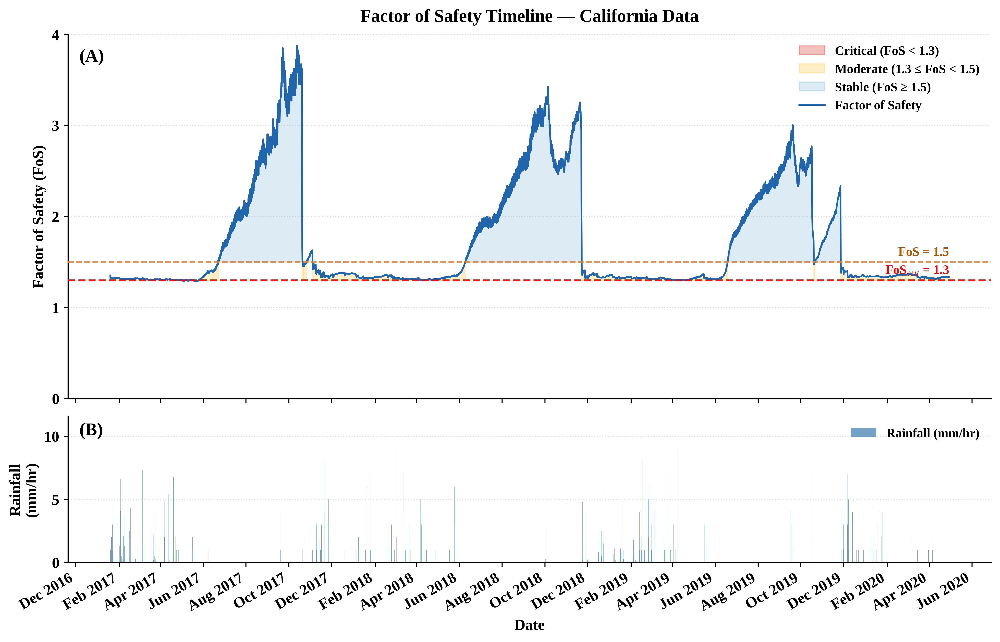


Saved: /content/outputs/manuscript_figure_13.png
Saved: /content/outputs/table6_fos_stability_summary_D108_california.csv


In [14]:
# ══════════════════════════════════════════════════════════════════
# Part H — FoS Timeline on California Data, PINN Richards Model (Fig 13)
# Adapted from fos_run.py — reuses WORKDIR/OUT set up above.
# Inputs : california_hourly_rain.csv, pinn_model_108_for_california.pt
# Output : manuscript_figure_13.png (450 dpi), table6_fos_stability_summary_D108_california.csv
# ══════════════════════════════════════════════════════════════════
CALI_DATA_PATH = WORKDIR / "california_hourly_rain.csv"
CALI_CKPT_PATH = WORKDIR / "pinn_model_108_for_california.pt"

print(f"{str(CALI_DATA_PATH):45s} {'FOUND' if CALI_DATA_PATH.exists() else 'MISSING'}")
print(f"{str(CALI_CKPT_PATH):45s} {'FOUND' if CALI_CKPT_PATH.exists() else 'MISSING'}")

# ── Model architecture (must match training) ──────────────────────
class RichardsPINN(nn.Module):
    def __init__(self, feat_dim: int = 18, hidden: int = 128):
        super().__init__()
        self.net = nn.Sequential(
            nn.Linear(feat_dim, hidden), nn.Tanh(),
            nn.Linear(hidden,   hidden), nn.Tanh(),
            nn.Linear(hidden,   hidden), nn.Tanh(),
            nn.Linear(hidden,   64),     nn.Tanh(),
            nn.Linear(64,       1),
        )
    def forward(self, x):
        return self.net(x)

# ── Load checkpoint ─────────────────────────────────────────────────
ckpt_cali = torch.load(CALI_CKPT_PATH, map_location="cpu", weights_only=False)

hp_c = ckpt_cali["hyperparameters"]
sc_c = ckpt_cali["scalers"]
vg_c = ckpt_cali["vg_params"]
sp_c = ckpt_cali["slope_params"]

LAG_C         = hp_c["lag"]
DTHDT_SCALE_C = hp_c["dthdt_scale"]

THETA_R_C = vg_c["theta_r"]
THETA_S_C = vg_c["theta_s"]
ALPHA_C   = vg_c["alpha"]
N_VG_C    = vg_c["n"]
M_VG_C    = vg_c["m"]

SLOPE_DEG_C = sp_c["slope_deg"]
C_KPA_C     = sp_c["c_kPa"]
PHI_DEG_C   = sp_c["phi_deg"]
GAMMA_S_C   = sp_c["gamma_s"]
H_M_C       = sp_c["H_m"]
GAMMA_W_C   = 9.81

FOS_CRIT_C = 1.3

beta_c  = np.radians(SLOPE_DEG_C)
phi_r_c = np.radians(PHI_DEG_C)

model_cali = RichardsPINN(feat_dim=18, hidden=128)
model_cali.load_state_dict(ckpt_cali["model_state_dict"])
model_cali.eval()

# ── Load & prepare California data ────────────────────────────────
df_c = pd.read_csv(CALI_DATA_PATH)
df_c["timestamp"] = pd.to_datetime(df_c["timestamp"], format="%m/%d/%Y %H:%M")
df_c = df_c.sort_values("timestamp").reset_index(drop=True)

# lag / rolling features computed on the FULL continuous series first, so the
# time-based windows stay physically correct (no gaps introduced yet)
for lag in range(1, LAG_C + 1):
    df_c[f"rain_lag{lag}"] = df_c["rain"].shift(lag, fill_value=0)

df_c["soil_norm"]  = (df_c["soil"] - THETA_R_C) / (THETA_S_C - THETA_R_C)
df_c["rain_norm"]  = df_c["rain"] / sc_c["rain_max"]
df_c["rain_cum6h"] = df_c["rain"].rolling(360, min_periods=1).sum()

# ── Filter out-of-training-range rows ──────────────────────────────
# The PINN was trained on theta in [theta_r, theta_s] (0.05-0.55 for Device 108),
# but the raw California "soil" column
# spans [0.152, 0.470] -- rows with soil < THETA_R_C sit below the trained
# range, so the model would be extrapolating outside its domain. Drop them
# and report how many rows / hours that was.
n_total_c_raw  = len(df_c)
below_range_c  = df_c["soil"] < THETA_R_C
n_filtered_c   = int(below_range_c.sum())

dt_hr_c = df_c["timestamp"].diff().dt.total_seconds().median() / 3600.0
if not np.isfinite(dt_hr_c) or dt_hr_c <= 0:
    dt_hr_c = 1.0
hours_filtered_c = n_filtered_c * dt_hr_c

print(f"California raw 'soil' range (pre-filter): [{df_c['soil'].min():.3f}, {df_c['soil'].max():.3f}]")
print(f"Model trained theta range: [{THETA_R_C:.3f}, {THETA_S_C:.3f}]")
print(f"Filtered out (soil < {THETA_R_C:.3f}, below trained range): "
      f"{n_filtered_c:,} rows / {n_total_c_raw:,} total  =  {hours_filtered_c:,.1f} hours "
      f"(sampling interval ≈ {dt_hr_c:.2f} h)")

# FILTER REMOVED (per revision): keep all rows, including soil < THETA_R_C.
# The PINN will extrapolate below its trained theta range for those rows --
# flagged here rather than silently dropped.
print(f"Filter disabled -- keeping all {n_total_c_raw:,} rows "
      f"({n_filtered_c:,} of them below trained theta range and extrapolated).")

feat_cols_c = (
    ["soil_norm", "rain_norm", "rain_cum6h"]
    + [f"rain_lag{l}" for l in range(1, LAG_C + 1)]
)

X_c = df_c[feat_cols_c].values.astype(np.float32)

# ── PINN inference: predict dθ/dt → θ_pred ────────────────────────
with torch.no_grad():
    dthdt_pred_c = model_cali(torch.tensor(X_c)).numpy().squeeze()

dt_s_c = 3600.0
theta_pred_c = np.clip(
    df_c["soil"].values + dthdt_pred_c * DTHDT_SCALE_C * dt_s_c,
    THETA_R_C, THETA_S_C
)

# ── Van Genuchten → pore-water pressure ───────────────────────────
Se_c    = np.clip((theta_pred_c - THETA_R_C) / (THETA_S_C - THETA_R_C), 1e-6, 1 - 1e-6)
psi_m_c_raw = -(1.0 / ALPHA_C) * (Se_c ** (-1.0 / M_VG_C) - 1.0) ** (1.0 / N_VG_C)

# [ALIGN v5] FIXED PHYSICAL BOUND (permanent-wilting-point), matching
# Part C / Part D and the rest of Part A/B/F/G after the v5 fix — the
# old adaptive np.percentile(...,2) floor collapsed almost all dry-side
# variation onto one clipped value here too (same bug as Part A).
PSI_MIN_M_C = -165.0    # physical permanent-wilting-point bound (m)
PSI_MAX_M_C = 0.0
psi_m_c  = np.clip(psi_m_c_raw, PSI_MIN_M_C, PSI_MAX_M_C)
u_w_c    = GAMMA_W_C * psi_m_c

# ── Infinite-slope Factor of Safety ───────────────────────────────
num_c = C_KPA_C + (GAMMA_S_C * H_M_C * np.cos(beta_c)**2 - u_w_c) * np.tan(phi_r_c)
den_c = GAMMA_S_C * H_M_C * np.sin(beta_c) * np.cos(beta_c)
FoS_c = np.clip(num_c / den_c, 0, 25)   # sanity ceiling only, no longer masking a psi-clip artifact

# ── Stability zone masks + summary table ──────────────────────────
critical_mask_c = FoS_c <  FOS_CRIT_C
moderate_mask_c = (FoS_c >= FOS_CRIT_C) & (FoS_c < 1.5)
stable_mask_c   = FoS_c >= 1.5

n_total_c    = len(FoS_c)
n_critical_c = int(critical_mask_c.sum())
n_moderate_c = int(moderate_mask_c.sum())
n_stable_c   = int(stable_mask_c.sum())

summary_rows_c = [
    ("Critical", f"<{FOS_CRIT_C}",              n_critical_c, n_critical_c / n_total_c * 100),
    ("Moderate", f"({FOS_CRIT_C}\u2264FoS<1.5)", n_moderate_c, n_moderate_c / n_total_c * 100),
    ("Stable",   "\u22651.5",                   n_stable_c,   n_stable_c   / n_total_c * 100),
]

print("\nStability class\tFoS range\tCount (Hours)\tPercentage (%)")
for name, rng, cnt, pct in summary_rows_c:
    print(f"{name}\t{rng}\t{cnt:,}\t{pct:.2f}")
print(f"Total\t\u2014\t{n_total_c:,}\t100.00")

summary_df_c = pd.DataFrame(
    summary_rows_c, columns=["Stability class", "FoS range", "Count (Hours)", "Percentage (%)"]
)
summary_df_c["Percentage (%)"] = summary_df_c["Percentage (%)"].round(2)
summary_df_c.to_csv(OUT / "table6_fos_stability_summary_D108_california.csv", index=False)

# ── Downsample for plotting (every 6 h) ───────────────────────────
step_c    = 6
t_plot_c    = df_c["timestamp"].iloc[::step_c]
fos_plot_c  = FoS_c[::step_c]
rain_plot_c = df_c["rain"].values[::step_c]
crit_p_c    = critical_mask_c[::step_c]
mod_p_c     = moderate_mask_c[::step_c]
stab_p_c    = stable_mask_c[::step_c]

y_lo_c    = 0.0

# FIXED Y-AXIS (per revision): capped at 10, values above are clipped by the
# axis limit itself (curve will run off the top rather than rescaling).
y_hi_c    = 5.0
y_ticks_c = np.array([0, 1, 2, 3, 5, 7, 10], dtype=float)

# ── Plot ────────────────────────────────────────────────────────────
fig_c, (ax1_c, ax2_c) = plt.subplots(
    2, 1, figsize=(13, 7.5),
    gridspec_kw={"height_ratios": [3, 1.2]},
    sharex=True,
)
fig_c.subplots_adjust(hspace=0.07)

# FIXED: was filling from y_lo_c (0.0) down to the curve, which visually
# implied FoS crashes to zero during critical excursions -- it doesn't; it
# only dips slightly below 1.3. Now fills from the FOS_CRIT_C threshold down
# to the curve, same convention as the moderate/stable bands below.
ax1_c.fill_between(t_plot_c, FOS_CRIT_C,
                    np.where(crit_p_c, fos_plot_c, np.nan),
                    color="#d73027", alpha=0.30, label="Critical (FoS < 1.3)")
ax1_c.fill_between(t_plot_c, FOS_CRIT_C,
                    np.where(mod_p_c, fos_plot_c, np.nan),
                    color="#fee090", alpha=0.50, label="Moderate (1.3 ≤ FoS < 1.5)")
ax1_c.fill_between(t_plot_c, 1.5,
                    np.where(stab_p_c, fos_plot_c, np.nan),
                    color="#91bfdb", alpha=0.30, label="Stable (FoS ≥ 1.5)")

ax1_c.plot(t_plot_c, fos_plot_c, color="#2166ac", linewidth=1.3,
           label="Factor of Safety", zorder=3)

ax1_c.axhline(FOS_CRIT_C, color="red",     lw=1.5, ls="--", alpha=0.90, zorder=4)
ax1_c.axhline(1.5,        color="#e08030", lw=1.2, ls="--", alpha=0.85, zorder=4)

x_right_c = t_plot_c.iloc[-1]
ax1_c.text(x_right_c, FOS_CRIT_C + 0.04, f"FoS$_{{crit}}$ = {FOS_CRIT_C}",
           ha="right", va="bottom", fontsize=10, fontweight="bold", color="red")
ax1_c.text(x_right_c, 1.5 + 0.04, "FoS = 1.5",
           ha="right", va="bottom", fontsize=10, fontweight="bold", color="#b05800")

ax1_c.set_ylabel("Factor of Safety (FoS)", fontsize=12, fontweight="bold")
ax1_c.set_ylim(0.0, 4 )
ax1_c.set_yticks([0, 1, 2, 3, 4,])
ax1_c.tick_params(labelsize=12)
for lbl in ax1_c.get_yticklabels():
    lbl.set_fontweight("bold")
ax1_c.legend(loc="upper right", fontsize=10, framealpha=0.88,
             prop={"size": 10, "weight": "bold"})
ax1_c.grid(axis="y", linestyle=":", alpha=0.45)
ax1_c.text(0.012, 0.96, "(A)", transform=ax1_c.transAxes,
           fontsize=14, fontweight="bold", va="top", ha="left")
ax1_c.set_title("Factor of Safety Timeline — California Data",
                 fontsize=14, fontweight="bold", pad=10)

ax2_c.bar(t_plot_c, rain_plot_c, width=0.22, color="steelblue", alpha=0.75,
          label="Rainfall (mm/hr)")
ax2_c.set_ylabel("Rainfall\n(mm/hr)", fontsize=12, fontweight="bold")
ax2_c.set_xlabel("Date",              fontsize=12, fontweight="bold")
ax2_c.tick_params(labelsize=12)
for lbl in ax2_c.get_yticklabels() + ax2_c.get_xticklabels():
    lbl.set_fontweight("bold")
ax2_c.xaxis.set_major_formatter(mdates.DateFormatter("%b %Y"))
ax2_c.xaxis.set_major_locator(mdates.MonthLocator(interval=2))
plt.setp(ax2_c.xaxis.get_majorticklabels(), rotation=30, ha="right")
ax2_c.grid(axis="y", linestyle=":", alpha=0.4)
ax2_c.legend(loc="upper right", fontsize=10,
             prop={"size": 10, "weight": "bold"})
ax2_c.text(0.012, 0.96, "(B)", transform=ax2_c.transAxes,
           fontsize=14, fontweight="bold", va="top", ha="left")

fig_path_13 = OUT / "manuscript_figure_13.png"
plt.savefig(fig_path_13, dpi=450, bbox_inches="tight", facecolor="white")
display(fig_c)
plt.close(fig_c)
print(f"\nSaved: {fig_path_13}")
print(f"Saved: {OUT / 'table6_fos_stability_summary_D108_california.csv'}")

## Part I — Cross-Device Transfer Learning (Table 7)


Checkpoint: D101_se.pt
  Source (D101) VG: alpha=2.7  n=1.23  theta_r=0.4099  theta_s=0.9970
  T_MIN=345.0  T_MAX=4076745.00000001  Z_MAX=0.50000001  RAIN_MAX=75.0  feat_dim=16
  FREEZE_MODE=head_only  CALIB_FRAC=20% (fixed, chronological)

[Device 107] D101-Se PINN, 20% chronological calib-window pipeline
  no leading artifact detected
  Se range (target-device conversion): [0.406, 0.998]
  chronological split (no wet/dry month / eligible-pool logic): first 20% of rows = calibration, last 80% = test
  calib window: 2025-11-01 11:52:00  ->  2025-11-07 14:12:00  (4,391 rows)
  test window:  2025-11-07 14:14:00  ->  2026-04-24 14:34:00  (17,564 rows)
  t_max_ anchored to latest calib timestamp; 17,564 test rows (100%) saturated at t_norm = 1.0
  ZERO-SHOT   N=17,564  RMSE=0.15159  R2=-4.9878  Bias=-0.14892
  ZERO-SHOT (Se-space)  N=17,564  RMSE=0.32741  R2=-4.9878  Bias=-0.32165
  AFTER RECAL N=17,564  RMSE=0.00387  R2=0.9961  Bias=-0.00276
  AFTER RECAL (Se-space)  N=17,564  RMSE=0.0083

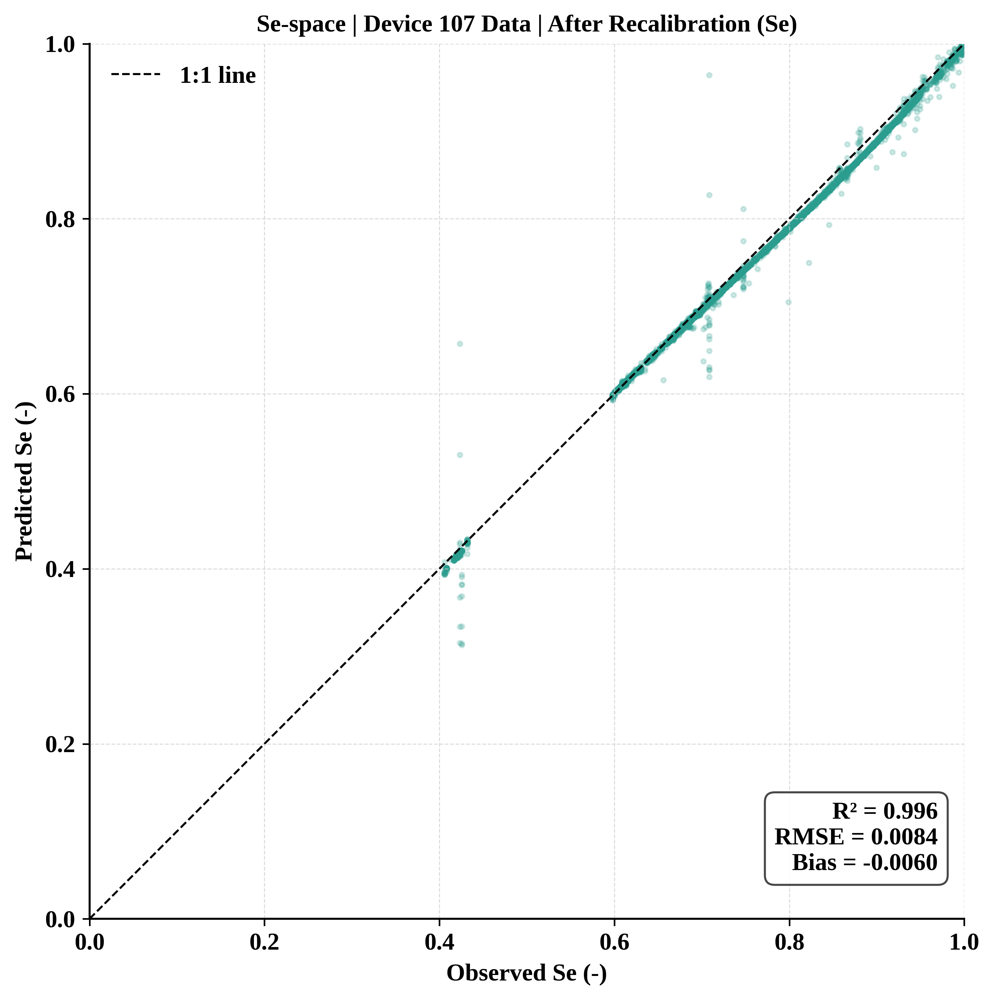

  saved manuscript_figure_14.png
  PERSISTENCE N=17,564  RMSE=0.00137  R2=0.9995
  calib theta range = [0.2917, 0.3330]  (full series range [0.1880, 0.4620])  |  test rows outside calib range: 65.5%
  inner split (chronological): calib_train=3,513  calib_val=878
  fine-tuning 65 / 44,033 parameters (head_only)
  cached fine-tuned checkpoint found -> dev101se_to_107_finetuned_chronosplit.pt  (skipping training loop)
  FINE-TUNED  N=17,564  RMSE=0.03085  R2=0.7520  Bias=-0.01853
  FINE-TUNED (Se-space)  N=17,564  RMSE=0.06663  R2=0.7520  Bias=-0.04003
    within-calib-range: R2=0.1807  |  extrapolation zone: R2=0.7518

[Device 108] D101-Se PINN, 20% chronological calib-window pipeline
  trimmed 136 leading artifact rows
  Se range (target-device conversion): [0.668, 0.979]
  chronological split (no wet/dry month / eligible-pool logic): first 20% of rows = calibration, last 80% = test
  calib window: 2025-11-01 11:37:00  ->  2025-11-10 01:05:00  (6,165 rows)
  test window:  2025-11-10 01:

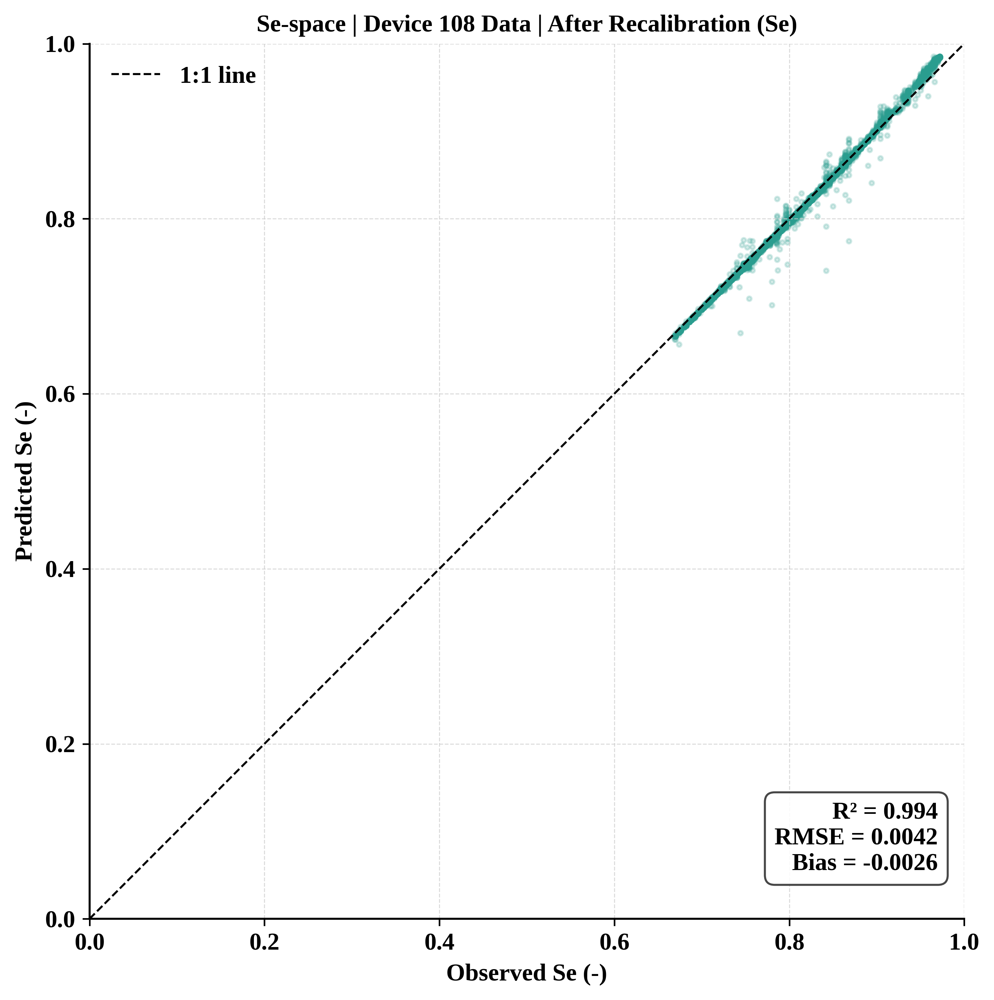

  saved manuscript_figure_15.png
  PERSISTENCE N=24,661  RMSE=0.00070  R2=0.9994
  calib theta range = [0.4100, 0.5393]  (full series range [0.3840, 0.5393])  |  test rows outside calib range: 4.9%
  inner split (chronological): calib_train=4,932  calib_val=1,233
  fine-tuning 65 / 44,033 parameters (head_only)
  cached fine-tuned checkpoint found -> dev101se_to_108_finetuned_chronosplit.pt  (skipping training loop)
  FINE-TUNED  N=24,661  RMSE=0.02887  R2=-0.0851  Bias=-0.02424
  FINE-TUNED (Se-space)  N=24,661  RMSE=0.05775  R2=-0.0851  Bias=-0.04847
    within-calib-range: R2=-0.3590  |  extrapolation zone: R2=0.6495

TABLE 7 (D101-Se PINN, 20% CHRONOLOGICAL CALIB WINDOW) — theta-space AND Se-space metrics
Device            N_test  Calib%  R2 zs(th)  R2 zs(Se)  R2 recal  R2 ft(th)  R2 ft(Se)  R2 persist  Extrap %
----------------------------------------------------------------------------------------------------------------------------------------------------------------------------

In [15]:
# ══════════════════════════════════════════════════════════════════
#  Part I — Cross-Device Transfer Learning (Device 101 -> 107, 101 -> 108)
#  ADAPTED FOR D101_se.pt (RichardsPINN-Se, alpha/n as explicit inputs)
#  + Se-space R2/RMSE/Bias evaluation and plots added (zero-shot + fine-tuned)
# ══════════════════════════════════════════════════════════════════
import warnings; warnings.filterwarnings("ignore")
import os
import numpy as np
import pandas as pd
import matplotlib
matplotlib.use("Agg")
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import r2_score, mean_squared_error
from scipy import stats
import copy
import torch, torch.nn as nn

UPLOAD_DIR = "/content"
OUTDIR     = "/content/outputs"
os.makedirs(OUTDIR, exist_ok=True)

plt.rcParams["font.family"] = "serif"
plt.rcParams["font.serif"]  = ["Times New Roman", "Liberation Serif",
                               "Nimbus Roman", "DejaVu Serif"]
plt.rcParams["mathtext.fontset"]   = "stix"
plt.rcParams["font.weight"]        = "bold"
plt.rcParams["axes.titleweight"]   = "bold"
plt.rcParams["axes.labelweight"]   = "bold"
plt.rcParams["font.size"]          = 12
plt.rcParams["axes.titlesize"]     = 12
plt.rcParams["axes.labelsize"]     = 12
plt.rcParams["xtick.labelsize"]    = 12
plt.rcParams["ytick.labelsize"]    = 12
plt.rcParams["legend.fontsize"]    = 12
plt.rcParams["figure.titlesize"]   = 14
plt.rcParams["figure.titleweight"] = "bold"

MODEL_PATH = f"{UPLOAD_DIR}/D101_se.pt"
LAG        = 15
ROLL_W     = 5
Z_SENSOR   = 0.30
CALIB_FRAC = 0.20
INNER_VAL_FRAC = 0.20
RNG_SEED   = 42
np.random.seed(RNG_SEED)
rng = np.random.default_rng(RNG_SEED)

FREEZE_MODE = "head_only"
FT_EPOCHS   = 300
FT_LR       = 2e-4
LAM         = 5
LAM_ZVAR    = 0.1
FT_PATIENCE = 40
Z_COLLOC    = np.array([0.30, 0.50], dtype=np.float32)

VG_BY_DEVICE = {
    "108": dict(theta_r=0.05, theta_s=0.55, alpha=5.9, n=1.48,
                m=1 - 1 / 1.48, Ks=0.0043),
    "107": dict(theta_r=0.00, theta_s=0.463, alpha=5.9, n=1.48,
                m=1 - 1 / 1.48, Ks=0.0043),
}
for _vg in VG_BY_DEVICE.values():
    _vg["Ks_ms"] = _vg["Ks"] / 3600.0

DATASETS = {
    "107": dict(csv=f"{UPLOAD_DIR}/107_pinn.csv",
                out_cal=f"{OUTDIR}/manuscript_figure_14.png",
                label="Device 107 Data"),
    "108": dict(csv=f"{UPLOAD_DIR}/pinn_108_new.csv",
                out_cal=f"{OUTDIR}/manuscript_figure_15.png",
                label="Device 108 Data"),
}

# --- New checkpoints (chronological-split retrain) saved to writable dir ---
FINETUNED_CKPT_PATHS = {
    "107": f"{OUTDIR}/dev101se_to_107_finetuned_chronosplit.pt",
    "108": f"{OUTDIR}/dev101se_to_108_finetuned_chronosplit.pt",
}
# Reviewers can instead upload the cached fine-tuned checkpoint straight into
# UPLOAD_DIR (same folder as the other checkpoints) -- checked first below,
# so no fine-tuning loop runs when a cached file is present in either place.
FINETUNED_CKPT_UPLOAD_PATHS = {
    "107": f"{UPLOAD_DIR}/dev101se_to_107_finetuned_chronosplit.pt",
    "108": f"{UPLOAD_DIR}/dev101se_to_108_finetuned_chronosplit.pt",
}
FORCE_RETRAIN = False   # set True only if you deliberately want to re-run fine-tuning

checkpoint = torch.load(MODEL_PATH, map_location="cpu", weights_only=False)
scalers  = checkpoint["scalers"]
T_MIN    = scalers["T_MIN"]
T_MAX    = scalers["T_MAX"]
Z_MAX    = scalers["Z_MAX"]
RAIN_MAX = scalers["rain_max"]
VG_SRC   = checkpoint["vg_params"]["D101"]
STATE    = checkpoint["model_state_dict"]
FEAT_DIM = checkpoint["model_architecture"]["feat_dim"]

print(f"Checkpoint: {MODEL_PATH.split('/')[-1]}")
print(f"  Source (D101) VG: alpha={VG_SRC['alpha']}  n={VG_SRC['n']}  "
      f"theta_r={VG_SRC['theta_r']:.4f}  theta_s={VG_SRC['theta_s']:.4f}")
print(f"  T_MIN={T_MIN}  T_MAX={T_MAX}  Z_MAX={Z_MAX}  RAIN_MAX={RAIN_MAX}  feat_dim={FEAT_DIM}")
print(f"  FREEZE_MODE={FREEZE_MODE}  CALIB_FRAC={CALIB_FRAC:.0%} (fixed, chronological)\n")

class RichardsPINN(nn.Module):
    def __init__(self, feat_dim, h=128):
        super().__init__()
        in_dim = feat_dim + 2 + 2
        self.net = nn.Sequential(
            nn.Linear(in_dim, h), nn.Tanh(),
            nn.Linear(h, h),      nn.Tanh(),
            nn.Linear(h, h),      nn.Tanh(),
            nn.Linear(h, h // 2), nn.Tanh(),
            nn.Linear(h // 2, 1), nn.Sigmoid(),
        )

    def forward(self, z_norm, t_norm, feat, alpha_batch, n_batch):
        x = torch.cat([z_norm, t_norm, feat, alpha_batch, n_batch], dim=1)
        return self.net(x)


def freeze_for_mode(model, mode):
    if mode == "full":
        for p in model.parameters():
            p.requires_grad_(True)
        return
    linears = [m for m in model.net if isinstance(m, nn.Linear)]
    for p in model.parameters():
        p.requires_grad_(False)
    for p in linears[-1].parameters():
        p.requires_grad_(True)


def predict_se(state, feat_dim, z, t, feat, alpha_b, n_b):
    m = RichardsPINN(feat_dim)
    m.load_state_dict(state); m.eval()
    with torch.no_grad():
        return m(torch.tensor(z), torch.tensor(t), torch.tensor(feat),
                  torch.tensor(alpha_b), torch.tensor(n_b)).numpy()


def leading_artifact_len(theta, theta_r, min_run=10, tol=1e-9):
    th = np.asarray(theta, float)
    invalid = th <= theta_r + 0.01
    d = np.diff(th, prepend=th[0])
    ramp = np.zeros(len(th), bool)
    i = 0
    while i < len(d) - 1:
        if abs(d[i + 1]) <= tol:
            i += 1; continue
        j = i + 1
        while j + 1 < len(d) and abs(d[j + 1] - d[i + 1]) <= tol:
            j += 1
        if j - i >= min_run:
            ramp[i:j + 1] = True
        i = j
    flag = invalid | ramp
    n = 0
    while n < len(flag) and flag[n]:
        n += 1
    return n


def build_features_se(d, lag, vg):
    theta = d["theta"].to_numpy(np.float32)
    rain  = d["rain"].to_numpy(np.float32)
    theta_c = np.clip(theta, vg["theta_r"] + 1e-6, vg["theta_s"] - 1e-6)
    Se = ((theta_c - vg["theta_r"]) / (vg["theta_s"] - vg["theta_r"])).astype(np.float32)

    X = np.empty((len(d) - lag, lag + 1), np.float32)
    X[:, 0] = rain[lag:] / RAIN_MAX
    for k in range(1, lag + 1):
        X[:, k] = Se[lag - k: len(d) - k]

    y_theta = theta[lag:].reshape(-1, 1)
    y_Se    = Se[lag:].reshape(-1, 1)
    return (X, y_theta, y_Se, rain[lag:],
            d["t_sec"].to_numpy(np.float32)[lag:], d["timestamp"].to_numpy()[lag:])


def vg_psi_dynamic_t(Se, alpha_b, n_b):
    Se_c = Se.clamp(1e-4, 1 - 1e-4)
    m_b  = 1.0 - (1.0 / n_b)
    h = (1.0 / alpha_b) * (Se_c**(-1.0 / m_b) - 1.0)**(1.0 / n_b)
    return -h

def vg_K_dynamic_t(Se, n_b, Ks_b):
    Se_c = Se.clamp(1e-4, 1 - 1e-4)
    m_b  = 1.0 - (1.0 / n_b)
    Kr = Se_c**0.5 * (1.0 - (1.0 - Se_c**(1.0 / m_b))**m_b)**2
    return Ks_b * Kr

def richards_residual(model, z_norm, t_norm, feat, alpha_b, n_b, Ks_b, thr_b, ths_b):
    Se = model(z_norm, t_norm, feat, alpha_b, n_b)
    theta = Se * (ths_b - thr_b) + thr_b
    dtheta_dt = torch.autograd.grad(theta, t_norm, torch.ones_like(theta),
                                    create_graph=True, retain_graph=True)[0]
    psi = vg_psi_dynamic_t(Se, alpha_b, n_b)
    dpsi_dz = torch.autograd.grad(psi, z_norm, torch.ones_like(psi),
                                  create_graph=True, retain_graph=True)[0]
    K = vg_K_dynamic_t(Se, n_b, Ks_b)
    flux = K * (dpsi_dz / Z_MAX + 1.0)
    dflux_dz = torch.autograd.grad(flux, z_norm, torch.ones_like(flux),
                                   create_graph=True, retain_graph=True)[0]
    residual = dtheta_dt / (T_MAX - T_MIN) - dflux_dz / Z_MAX
    dSe_dz = torch.autograd.grad(Se, z_norm, torch.ones_like(Se),
                                 create_graph=True, retain_graph=True)[0]
    return residual, Se, dSe_dz

def make_colloc_batch(t_sec_batch, feat_batch, alpha_val, n_val, Ks_val, thr_val, ths_val, t_sec_ceiling):
    assert np.all(t_sec_batch <= t_sec_ceiling + 1e-6), \
        "collocation batch reaches past calib_train ceiling -- leakage guard tripped"
    Nz = len(Z_COLLOC)
    B  = t_sec_batch.shape[0]
    z_phys   = np.tile(Z_COLLOC, B).reshape(-1, 1).astype(np.float32)
    z_norm_c = z_phys / Z_MAX
    t_phys_c = np.repeat(t_sec_batch, Nz).reshape(-1, 1).astype(np.float32)
    t_norm_c = (t_phys_c - T_MIN) / (T_MAX - T_MIN)
    feat_c   = np.repeat(feat_batch, Nz, axis=0).astype(np.float32)
    NzB = feat_c.shape[0]
    alpha_c = np.full((NzB, 1), alpha_val, np.float32)
    n_c     = np.full((NzB, 1), n_val, np.float32)
    Ks_c    = np.full((NzB, 1), Ks_val, np.float32)
    thr_c   = np.full((NzB, 1), thr_val, np.float32)
    ths_c   = np.full((NzB, 1), ths_val, np.float32)
    z_c = torch.tensor(z_norm_c, dtype=torch.float32, requires_grad=True)
    t_c = torch.tensor(t_norm_c, dtype=torch.float32, requires_grad=True)
    feat_c  = torch.tensor(feat_c,  dtype=torch.float32)
    alpha_c = torch.tensor(alpha_c, dtype=torch.float32)
    n_c     = torch.tensor(n_c,     dtype=torch.float32)
    Ks_c    = torch.tensor(Ks_c,    dtype=torch.float32)
    thr_c   = torch.tensor(thr_c,   dtype=torch.float32)
    ths_c   = torch.tensor(ths_c,   dtype=torch.float32)
    return z_c, t_c, feat_c, alpha_c, n_c, Ks_c, thr_c, ths_c


# ── Se-space figure (raw model output vs target-device Se) ──
def make_figure_se(Se_true, Se_pred, rmse_se, r2_se, bias_se, mode, path):
    fig, ax = plt.subplots(1, 1, figsize=(7, 7))
    ax.scatter(Se_true, Se_pred, alpha=0.2, s=5, color="#2A9D8F")
    ax.plot([0, 1], [0, 1], "k--", lw=1, label="1:1 line")
    ax.set_xlabel("Observed Se (-)")
    ax.set_ylabel("Predicted Se (-)")
    ax.set_title(f"Se-space | {mode}")
    ax.legend(loc="upper left")
    ax.grid(color="#CCCCCC", lw=0.5, ls="--", alpha=0.7)
    ax.set_xlim(0, 1); ax.set_ylim(0, 1)
    ax.set_aspect("equal", adjustable="box")
    stats_txt = f"R\u00b2 = {r2_se:.3f}\nRMSE = {rmse_se:.4f}\nBias = {bias_se:+.4f}"
    ax.text(0.97, 0.05, stats_txt, transform=ax.transAxes,
            ha="right", va="bottom", fontsize=12, fontweight="bold",
            bbox=dict(boxstyle="round,pad=0.4", facecolor="white",
                      edgecolor="#333333", alpha=0.9))
    for lbl in ax.get_xticklabels() + ax.get_yticklabels():
        lbl.set_fontweight("bold")
    plt.tight_layout()
    plt.savefig(path, dpi=450, bbox_inches="tight", facecolor="white")
    display(fig)
    plt.close()


results = {}

for tag, cfg in DATASETS.items():
    print(f"[Device {tag}] D101-Se PINN, 20% chronological calib-window pipeline")
    vg_target = VG_BY_DEVICE[tag]
    alpha_val, n_val = vg_target["alpha"], vg_target["n"]
    Ks_val, thr_val, ths_val = vg_target["Ks_ms"], vg_target["theta_r"], vg_target["theta_s"]

    df = pd.read_csv(cfg["csv"], low_memory=False).dropna(subset=["timestamp", "soil", "rain"])
    df["timestamp"] = pd.to_datetime(df["timestamp"], dayfirst=False, errors="coerce")
    df = (df.dropna(subset=["timestamp"]).sort_values("timestamp")
            .reset_index(drop=True)[["timestamp", "soil", "rain"]]
            .rename(columns={"soil": "theta"}))
    df = df.iloc[::2].reset_index(drop=True)
    assert df["timestamp"].is_monotonic_increasing, "timestamps not sorted after preprocessing"

    n_trim = leading_artifact_len(df["theta"].values, thr_val)
    if n_trim:
        print(f"  trimmed {n_trim} leading artifact rows")
        df = df.iloc[n_trim:].reset_index(drop=True)
    else:
        print("  no leading artifact detected")

    df["t_sec"] = (df["timestamp"] - df["timestamp"].iloc[0]).dt.total_seconds()
    df["theta"] = df["theta"].rolling(ROLL_W, center=False, min_periods=1).median()

    X_raw, y_theta_all, y_Se_all, rain_arr, t_sec_arr, ts_arr = build_features_se(df, LAG, vg_target)
    y_true_all = y_theta_all.flatten()
    y_Se_true_all = y_Se_all.flatten()
    print(f"  Se range (target-device conversion): [{y_Se_true_all.min():.3f}, {y_Se_true_all.max():.3f}]")

    # ── Plain chronological split: first 20% = calibration, last 80% = test ──
    n_total = len(y_true_all)
    calib_target_n = int(round(CALIB_FRAC * n_total))
    order = np.argsort(ts_arr)  # chronological order (data should already be sorted, but be safe)
    calib_idx = np.sort(order[:calib_target_n])
    test_idx  = np.sort(order[calib_target_n:])

    assert set(calib_idx.tolist()).isdisjoint(set(test_idx.tolist())), \
        "LEAKAGE: overlap between calib and test indices"
    assert ts_arr[calib_idx].max() <= ts_arr[test_idx].min(), \
        "LEAKAGE: a calib row's timestamp is after the earliest test row"

    print(f"  chronological split (no wet/dry month / eligible-pool logic): "
          f"first {CALIB_FRAC:.0%} of rows = calibration, last {1-CALIB_FRAC:.0%} = test")
    print(f"  calib window: {pd.Timestamp(ts_arr[calib_idx].min())}  ->  "
          f"{pd.Timestamp(ts_arr[calib_idx].max())}  ({len(calib_idx):,} rows)")
    print(f"  test window:  {pd.Timestamp(ts_arr[test_idx].min())}  ->  "
          f"{pd.Timestamp(ts_arr[test_idx].max())}  ({len(test_idx):,} rows)")

    eligible_idx_all = calib_idx  # kept for downstream fine-tune inner-split code below
    t_sec_ceiling = float(t_sec_arr[calib_idx].max())

    ts_test  = pd.to_datetime(ts_arr[test_idx])
    rain_test = rain_arr[test_idx]
    y_true_test = y_true_all[test_idx]

    X_norm = X_raw

    t_min_ = float(t_sec_arr[0])
    t_max_ = float(t_sec_arr[calib_idx].max())
    def to_t_norm(tsec_arr):
        tn = (tsec_arr - t_min_) / (t_max_ - t_min_)
        tn = (T_MIN / T_MAX) + tn * (1.0 - T_MIN / T_MAX)
        return np.minimum(tn, 1.0)
    t_norm_all = to_t_norm(t_sec_arr)
    n_sat = int((t_norm_all[test_idx] >= 1.0 - 1e-9).sum())
    print(f"  t_max_ anchored to latest calib timestamp; {n_sat:,} test rows "
          f"({n_sat/len(test_idx):.0%}) saturated at t_norm = 1.0")

    z_all = np.full((len(X_norm), 1), Z_SENSOR / Z_MAX, np.float32)
    alpha_all = np.full((len(X_norm), 1), alpha_val, np.float32)
    n_all_arr = np.full((len(X_norm), 1), n_val, np.float32)

    y_pred_Se_all = predict_se(STATE, FEAT_DIM, z_all, t_norm_all[:, None].astype(np.float32),
                                X_norm, alpha_all, n_all_arr).flatten()
    y_pred_Se_all = np.clip(y_pred_Se_all, 0.0, 1.0)
    y_pred_all = y_pred_Se_all * (ths_val - thr_val) + thr_val

    y_pred_calib = y_pred_all[calib_idx]
    y_true_calib = y_true_all[calib_idx]
    y_pred_test  = y_pred_all[test_idx]

    rmse_zs = np.sqrt(mean_squared_error(y_true_test, y_pred_test))
    r2_zs   = r2_score(y_true_test, y_pred_test)
    bias_zs = np.mean(y_pred_test - y_true_test)
    print(f"  ZERO-SHOT   N={len(y_true_test):,}  RMSE={rmse_zs:.5f}  "
          f"R2={r2_zs:.4f}  Bias={bias_zs:+.5f}")

    # ── NEW: Se-space zero-shot metrics + plot ──
    Se_true_test = y_Se_true_all[test_idx]
    Se_pred_test = y_pred_Se_all[test_idx]
    rmse_se_zs = np.sqrt(mean_squared_error(Se_true_test, Se_pred_test))
    r2_se_zs   = r2_score(Se_true_test, Se_pred_test)
    bias_se_zs = np.mean(Se_pred_test - Se_true_test)
    print(f"  ZERO-SHOT (Se-space)  N={len(Se_true_test):,}  RMSE={rmse_se_zs:.5f}  "
          f"R2={r2_se_zs:.4f}  Bias={bias_se_zs:+.5f}")

    # ── Recalibration fitted in Se-space (not theta-space) ──
    Se_pred_calib = y_pred_Se_all[calib_idx]
    Se_true_calib = y_Se_true_all[calib_idx]
    slope, intercept, _, _, _ = stats.linregress(Se_pred_calib, Se_true_calib)
    Se_pred_corrected = slope * Se_pred_test + intercept
    y_pred_corrected = Se_pred_corrected * (ths_val - thr_val) + thr_val  # for theta-space reporting only

    rmse_cal = np.sqrt(mean_squared_error(y_true_test, y_pred_corrected))
    r2_cal   = r2_score(y_true_test, y_pred_corrected)
    bias_cal = np.mean(y_pred_corrected - y_true_test)
    print(f"  AFTER RECAL N={len(y_true_test):,}  RMSE={rmse_cal:.5f}  "
          f"R2={r2_cal:.4f}  Bias={bias_cal:+.5f}")

    rmse_se_cal = np.sqrt(mean_squared_error(Se_true_test, Se_pred_corrected))
    r2_se_cal   = r2_score(Se_true_test, Se_pred_corrected)
    bias_se_cal = np.mean(Se_pred_corrected - Se_true_test)
    print(f"  AFTER RECAL (Se-space)  N={len(Se_true_test):,}  RMSE={rmse_se_cal:.5f}  "
          f"R2={r2_se_cal:.4f}  Bias={bias_se_cal:+.5f}")
    make_figure_se(Se_true_test, Se_pred_corrected, rmse_se_cal, r2_se_cal, bias_se_cal,
                   f"{cfg['label']} | After Recalibration (Se)", cfg["out_cal"])
    print(f"  saved {cfg['out_cal'].split('/')[-1]}")

    y_persist_shifted = np.roll(y_true_all, 1)
    y_persist_shifted[0] = y_true_all[0]
    y_persist = y_persist_shifted[test_idx]
    rmse_per = np.sqrt(mean_squared_error(y_true_test, y_persist))
    r2_per   = r2_score(y_true_test, y_persist)
    print(f"  PERSISTENCE N={len(y_true_test):,}  RMSE={rmse_per:.5f}  R2={r2_per:.4f}")

    lo_c, hi_c = y_true_calib.min(), y_true_calib.max()
    in_range_mask = (y_true_test >= lo_c) & (y_true_test <= hi_c)
    print(f"  calib theta range = [{lo_c:.4f}, {hi_c:.4f}]  (full series range "
          f"[{y_true_all.min():.4f}, {y_true_all.max():.4f}])  |  "
          f"test rows outside calib range: {(~in_range_mask).mean():.1%}")

    res_row = dict(device=cfg["label"], n_test=len(y_true_test),
                   calib_frac=len(calib_idx)/len(y_true_all),
                   r2_zeroshot=r2_zs, rmse_zeroshot=rmse_zs,
                   r2_se_zeroshot=r2_se_zs, rmse_se_zeroshot=rmse_se_zs,
                   r2_recal=r2_cal, rmse_recal=rmse_cal,
                   r2_se_recal=r2_se_cal, rmse_se_recal=rmse_se_cal,
                   r2_persist=r2_per, rmse_persist=rmse_per,
                   r2_finetuned=np.nan, rmse_finetuned=np.nan,
                   r2_se_finetuned=np.nan, rmse_se_finetuned=np.nan,
                   extrap_frac=(~in_range_mask).mean())

    # ── FINE-TUNE (skipped -- cached checkpoints supplied) ──
    calib_sorted = calib_idx[np.argsort(ts_arr[calib_idx])]
    val_target_n = max(1, int(round(len(calib_sorted) * INNER_VAL_FRAC)))
    train_target_n = len(calib_sorted) - val_target_n
    calib_train_idx = calib_sorted[:train_target_n]
    calib_val_idx   = calib_sorted[train_target_n:]
    assert len(set(calib_train_idx.tolist()) & set(calib_val_idx.tolist())) == 0, \
        "LEAKAGE: a row appears in both the fine-tune train and val split"
    assert ts_arr[calib_train_idx].max() <= ts_arr[calib_val_idx].min(), \
        "LEAKAGE: fine-tune train rows are not strictly before val rows"
    print(f"  inner split (chronological): calib_train={len(calib_train_idx):,}  "
          f"calib_val={len(calib_val_idx):,}")

    Xn_ct, y_ct, tsec_ct, tnorm_ct = (X_norm[calib_train_idx], y_true_all[calib_train_idx],
                                       t_sec_arr[calib_train_idx], t_norm_all[calib_train_idx])
    Xn_cv, y_cv, tnorm_cv = (X_norm[calib_val_idx], y_true_all[calib_val_idx],
                              t_norm_all[calib_val_idx])
    t_sec_ceiling = float(t_sec_arr[eligible_idx_all].max())

    model = RichardsPINN(FEAT_DIM)
    model.load_state_dict(STATE)
    freeze_for_mode(model, FREEZE_MODE)
    trainable = [p for p in model.parameters() if p.requires_grad]
    print(f"  fine-tuning {sum(p.numel() for p in trainable):,} / "
          f"{sum(p.numel() for p in model.parameters()):,} parameters ({FREEZE_MODE})")

    z_sens_norm = torch.tensor([[Z_SENSOR / Z_MAX]], dtype=torch.float32)
    ckpt_path = FINETUNED_CKPT_PATHS[tag]
    upload_ckpt_path = FINETUNED_CKPT_UPLOAD_PATHS[tag]
    cached_ckpt_path = ckpt_path if os.path.exists(ckpt_path) else (
        upload_ckpt_path if os.path.exists(upload_ckpt_path) else None)

    if cached_ckpt_path is not None and not FORCE_RETRAIN:
        print(f"  cached fine-tuned checkpoint found -> {cached_ckpt_path.split('/')[-1]}  (skipping training loop)")
        best_state = torch.load(cached_ckpt_path, map_location="cpu")
    else:
        optimizer = torch.optim.AdamW(trainable, lr=FT_LR, weight_decay=1e-4)
        Xt_ct = torch.tensor(Xn_ct, dtype=torch.float32)
        yt_ct = torch.tensor(y_ct.reshape(-1, 1), dtype=torch.float32)
        tt_ct = torch.tensor(tnorm_ct.reshape(-1, 1), dtype=torch.float32)
        Xt_cv = torch.tensor(Xn_cv, dtype=torch.float32)
        yt_cv = torch.tensor(y_cv.reshape(-1, 1), dtype=torch.float32)
        tt_cv = torch.tensor(tnorm_cv.reshape(-1, 1), dtype=torch.float32)

        B_ct = Xt_ct.shape[0]
        alpha_ct_t = torch.full((B_ct, 1), alpha_val, dtype=torch.float32)
        n_ct_t     = torch.full((B_ct, 1), n_val, dtype=torch.float32)
        B_cv = Xt_cv.shape[0]
        alpha_cv_t = torch.full((B_cv, 1), alpha_val, dtype=torch.float32)
        n_cv_t     = torch.full((B_cv, 1), n_val, dtype=torch.float32)

        THETA_RANGE = ths_val - thr_val
        DTHDT_SCALE = THETA_RANGE / float(T_MAX - T_MIN)

        best_val, best_state, patience_ctr = np.inf, None, 0
        mse = nn.MSELoss()

        for epoch in range(1, FT_EPOCHS + 1):
            model.train(); optimizer.zero_grad()
            B = Xt_ct.shape[0]
            z_d = z_sens_norm.expand(B, -1).requires_grad_(True)
            t_d = tt_ct.clone().requires_grad_(True)
            Se_pred = model(z_d, t_d, Xt_ct, alpha_ct_t, n_ct_t)
            theta_pred = Se_pred * THETA_RANGE + thr_val
            loss_d = mse(theta_pred, yt_ct)

            z_c, t_c, feat_c, alpha_c, n_c, Ks_c, thr_c, ths_c = make_colloc_batch(
                tsec_ct, Xn_ct, alpha_val, n_val, Ks_val, thr_val, ths_val, t_sec_ceiling)
            resid, _, dSe_dz = richards_residual(model, z_c, t_c, feat_c, alpha_c, n_c, Ks_c, thr_c, ths_c)
            loss_p = ((resid / (DTHDT_SCALE + 1e-12)) ** 2).mean()

            Nz = len(Z_COLLOC)
            z_var_loss = -dSe_dz.view(B, Nz).var(dim=1).mean()

            loss = loss_d + LAM * loss_p + LAM_ZVAR * z_var_loss
            loss.backward()
            torch.nn.utils.clip_grad_norm_(trainable, 1.0)
            optimizer.step()

            model.eval()
            with torch.no_grad():
                z_v = z_sens_norm.expand(Xt_cv.shape[0], -1)
                Se_v = model(z_v, tt_cv, Xt_cv, alpha_cv_t, n_cv_t)
                theta_v = Se_v * THETA_RANGE + thr_val
                vl = mse(theta_v, yt_cv).item()

            if vl < best_val - 1e-7:
                best_val, best_state, patience_ctr = vl, copy.deepcopy(model.state_dict()), 0
            else:
                patience_ctr += 1
            if epoch % 50 == 0 or epoch == 1:
                print(f"    epoch {epoch:4d}  data={loss_d.item():.5f}  phys={loss_p.item():.5f}  "
                      f"val={vl:.5f}  best={best_val:.5f}")
            if patience_ctr >= FT_PATIENCE:
                print(f"    early stop @ epoch {epoch}")
                break

        torch.save(best_state, ckpt_path)
        print(f"  saved fine-tuned checkpoint -> {ckpt_path.split('/')[-1]}")

    model.load_state_dict(best_state); model.eval()
    with torch.no_grad():
        Xn_test = X_norm[test_idx]; tnorm_test = t_norm_all[test_idx]
        z_te = z_sens_norm.expand(Xn_test.shape[0], -1)
        t_te = torch.tensor(tnorm_test.reshape(-1, 1), dtype=torch.float32)
        Xt_te = torch.tensor(Xn_test, dtype=torch.float32)
        B_te = Xt_te.shape[0]
        alpha_te_t = torch.full((B_te, 1), alpha_val, dtype=torch.float32)
        n_te_t     = torch.full((B_te, 1), n_val, dtype=torch.float32)
        Se_pred_ft = model(z_te, t_te, Xt_te, alpha_te_t, n_te_t).numpy().flatten()
        Se_pred_ft = np.clip(Se_pred_ft, 0.0, 1.0)
        y_pred_ft = Se_pred_ft * (ths_val - thr_val) + thr_val

    rmse_ft = np.sqrt(mean_squared_error(y_true_test, y_pred_ft))
    r2_ft   = r2_score(y_true_test, y_pred_ft)
    bias_ft = np.mean(y_pred_ft - y_true_test)
    print(f"  FINE-TUNED  N={len(y_true_test):,}  RMSE={rmse_ft:.5f}  "
          f"R2={r2_ft:.4f}  Bias={bias_ft:+.5f}")

    # ── NEW: Se-space fine-tuned metrics + plot ──
    Se_true_test_ft = y_Se_true_all[test_idx]   # same as Se_true_test above
    rmse_se_ft = np.sqrt(mean_squared_error(Se_true_test_ft, Se_pred_ft))
    r2_se_ft   = r2_score(Se_true_test_ft, Se_pred_ft)
    bias_se_ft = np.mean(Se_pred_ft - Se_true_test_ft)
    print(f"  FINE-TUNED (Se-space)  N={len(Se_true_test_ft):,}  RMSE={rmse_se_ft:.5f}  "
          f"R2={r2_se_ft:.4f}  Bias={bias_se_ft:+.5f}")

    if in_range_mask.sum() > 1:
        r2_in = r2_score(y_true_test[in_range_mask], y_pred_ft[in_range_mask])
    else:
        r2_in = np.nan
    if (~in_range_mask).sum() > 1:
        r2_out = r2_score(y_true_test[~in_range_mask], y_pred_ft[~in_range_mask])
    else:
        r2_out = np.nan
    print(f"    within-calib-range: R2={r2_in:.4f}  |  extrapolation zone: R2={r2_out:.4f}\n")

    res_row.update(r2_finetuned=r2_ft, rmse_finetuned=rmse_ft,
                   r2_se_finetuned=r2_se_ft, rmse_se_finetuned=rmse_se_ft,
                   r2_ft_in_range=r2_in, r2_ft_extrap=r2_out)
    results[tag] = res_row

TABLE_WIDTH = 190
print("=" * TABLE_WIDTH)
print("TABLE 7 (D101-Se PINN, 20% CHRONOLOGICAL CALIB WINDOW) — theta-space AND Se-space metrics")
print("=" * TABLE_WIDTH)
hdr = (f"{'Device':<16}{'N_test':>8}{'Calib%':>8}"
       f"{'R2 zs(th)':>11}{'R2 zs(Se)':>11}"
       f"{'R2 recal':>10}"
       f"{'R2 ft(th)':>11}{'R2 ft(Se)':>11}"
       f"{'R2 persist':>12}"
       f"{'Extrap %':>10}")
print(hdr); print("-" * TABLE_WIDTH)
for r in results.values():
    ft_r2   = f"{r['r2_finetuned']:.4f}"    if not np.isnan(r['r2_finetuned'])    else "skipped"
    ft_se   = f"{r['r2_se_finetuned']:.4f}" if not np.isnan(r['r2_se_finetuned']) else "skipped"
    print(f"{r['device']:<16}{r['n_test']:>8,}{r['calib_frac']:>7.1%} "
          f"{r['r2_zeroshot']:>11.4f}{r['r2_se_zeroshot']:>11.4f}"
          f"{r['r2_recal']:>10.4f}"
          f"{ft_r2:>11}{ft_se:>11}"
          f"{r['r2_persist']:>12.4f}"
          f"{r['extrap_frac']:>9.1%}")
print("=" * TABLE_WIDTH)

table_rows = []
for r in results.values():
    table_rows.append({
        "Device": r["device"], "N_test": r["n_test"], "Calib_%": r["calib_frac"],
        "R2_zeroshot_theta": r["r2_zeroshot"], "RMSE_zeroshot_theta": r["rmse_zeroshot"],
        "R2_zeroshot_Se": r["r2_se_zeroshot"], "RMSE_zeroshot_Se": r["rmse_se_zeroshot"],
        "R2_recal_theta": r["r2_recal"], "RMSE_recal_theta": r["rmse_recal"],
        "R2_recal_Se": r["r2_se_recal"], "RMSE_recal_Se": r["rmse_se_recal"],
        "R2_finetuned_theta": r["r2_finetuned"], "RMSE_finetuned_theta": r["rmse_finetuned"],
        "R2_finetuned_Se": r["r2_se_finetuned"], "RMSE_finetuned_Se": r["rmse_se_finetuned"],
        "R2_persist": r["r2_persist"], "RMSE_persist": r["rmse_persist"],
        "Extrap_%": r["extrap_frac"],
    })
table_df = pd.DataFrame(table_rows)
table_csv_path = f"{OUTDIR}/table7_r2_rmse_D101se_chrono_with_Se.csv"
table_df.to_csv(table_csv_path, index=False)
print(f"\nSaved table -> {table_csv_path}")

## Done — list of everything produced

In [16]:
import pandas as pd
files = sorted(OUT.glob("*"))
print(f"{len(files)} files written to {OUT}\n")
for f in files:
    print(f"  {f.name}")


41 files written to /content/outputs

  alert_stream_summary.txt
  fos_timeseries_main.csv
  manuscript_figure_10a.png
  manuscript_figure_10b.png
  manuscript_figure_11.png
  manuscript_figure_12.png
  manuscript_figure_12b.png
  manuscript_figure_12c.png
  manuscript_figure_13.png
  manuscript_figure_14.png
  manuscript_figure_15.png
  manuscript_figure_16.png
  manuscript_figure_17a.png
  manuscript_figure_17b.png
  manuscript_figure_17c.png
  manuscript_figure_17d.png
  manuscript_figure_17e.png
  manuscript_figure_18a.png
  manuscript_figure_18b.png
  manuscript_figure_19a.png
  manuscript_figure_19b.png
  manuscript_figure_20.pdf
  manuscript_figure_20.png
  manuscript_figure_21.png
  manuscript_figure_22.png
  manuscript_figure_23.png
  manuscript_figure_8a.png
  manuscript_figure_8b.png
  manuscript_figure_8c.png
  manuscript_figure_9.pdf
  manuscript_figure_9.png
  sensitivity_2d_grid_ks_x_slope.csv
  sensitivity_ks_sweep.csv
  sensitivity_slope_sweep.csv
  sensitivity_values.